# Modelo de inferencia de energia solar 

---
## Sección 1: EDA
En esta seccion se realizara un analisis exploratorio de los datos de las estaciones metereologicas de la argentina, se fucionaran distintos datasets para enriquecer los datos originales con por ejemplo la provincia de la estacion, region, etc

In [4]:
#Se importan todas las librerías necesarias
#Librerías de manejo de datos y genéricas
import os
import requests
import re
import itertools
import geopandas
import numpy as np
import pandas as pd

#Librerías de visualización
import missingno as msno
import matplotlib.pyplot as plt
import seaborn as sns

from tqdm import tqdm # para mostrar barras de progreso

from unidecode import unidecode # para eliminar acentos
from pandas.api.types import CategoricalDtype # para manejar tipos de datos categóricos

#Librerías de machine learning
from sklearn.linear_model import Ridge #regresión lineal regularizada
from sklearn.ensemble import RandomForestRegressor # Random Forest Regressor
from sklearn.metrics import r2_score, mean_absolute_error, median_absolute_error, max_error, mean_squared_error # métricas de rendimiento
from sklearn.svm import SVR # Support Vector Regression
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler # para escalar los datos numéricos
from sklearn.neighbors import NearestNeighbors # para encontrar vecinos más cercanos
from lightgbm import LGBMRegressor # LightGBM Regressor

#Otras librerías
from concurrent.futures import ThreadPoolExecutor, as_completed
from shapely.geometry import Point
from scipy.interpolate import LinearNDInterpolator

In [5]:
# Funciones de utilidad
def iqr(x):
    """Función para calcular el Rango Intercuartílico."""
    return x.quantile(0.75) - x.quantile(0.25)

def mode(x):
    """Función para obtener la moda (el primer valor si hay múltiples)."""
    return x.mode().iloc[0] if not x.mode().empty else np.nan

def limpiar_texto(texto):
    """Función para limpiar texto, eliminando acentos y caracteres especiales, y convirtiendo a minúsculas."""
    if not isinstance(texto, str):
        return texto
    limpio = unidecode(texto)
    limpio = re.sub(r'[\s-]+', '_', limpio)
    limpio = re.sub(r'[^\w]', '', limpio)
    return limpio.lower()


In [6]:
# Cargar y procesar los datos de las estaciones meteorológicas de Argentina
# Se cargan los datos de las estaciones meteorológicas de Argentina desde un archivo de texto con formato fijo.
# Se procesan las columnas para extraer la latitud y longitud en formato decimal y se renombran las columnas para facilitar su uso posterior.
df_bases = pd.read_fwf(
    'datos/estaciones_smn.txt', 
    skiprows=2, 
    header=None, 
    encoding='latin-1'
)

nombres_columnas = [
    'nombre_original', 'provincia', 'lat_gr', 'lat_min',
    'lon_gr', 'lon_min', 'altura', 'nro', 'oaci'
]

df_bases.columns = nombres_columnas
df_bases['nombre_original'] = df_bases['nombre_original'].str.strip()
df_bases['provincia'] = df_bases['provincia'].str.strip()
# Convertir latitud y longitud a formato decimal
df_bases['latitud'] = df_bases['lat_gr'] + np.sign(df_bases['lat_gr']) * (df_bases['lat_min'] / 60)
df_bases['longitud'] = df_bases['lon_gr'] + np.sign(df_bases['lon_gr']) * (df_bases['lon_min'] / 60)
# Eliminar columnas que ya no se usan
df_bases = df_bases.drop(columns=['lat_gr', 'lat_min', 'lon_gr', 'lon_min'])
# Se muestra el DataFrame resultante
df_bases.head()


,nombre_original,provincia,altura,nro,oaci,latitud,longitud
0,BASE BELGRANO II,ANTARTIDA,256.0,89034.0,SAYB,-77.866667,-34.616667
1,BASE CARLINI (EX JUBANY),ANTARTIDA,11.0,89053.0,SAYJ,-62.233333,-58.650000
2,BASE ESPERANZA,ANTARTIDA,24.0,88963.0,SAYE,-63.383333,-56.983333
3,BASE MARAMBIO,ANTARTIDA,198.0,89055.0,SAWB,-64.233333,-56.616667
4,BASE ORCADAS,ANTARTIDA,12.0,88968.0,SAYO,-60.733333,-44.733333


In [7]:
# En esta sección se cargan los datos de las estaciones meteorológicas de Argentina desde un archivo Excel.
# Se busca la fila que contiene el encabezado correcto y se carga el DataFrame con ese encabezado.
# Luego, se transforma el DataFrame a un formato largo (long format) para facilitar el análisis.
# Finalmente, se limpian los nombres de las variables y se procesan los valores para crear un DataFrame final con las columnas adecuadas.


pd.set_option('display.max_columns', None) # Se configura para mostrar todas las columnas
pd.set_option('display.width', 1000)

nombre_excel = "Estadísticas normales Datos abiertos 1991-2020.xlsx"
ruta_completa = os.path.join('datos', nombre_excel)
#Primer se carga del archivo para detectar el encabezado correcto (el exel tiene un encabezado en una fila distinta a la 0)
if not os.path.exists(ruta_completa):
    print(f"Error: El archivo '{ruta_completa}' no se encontró. Asegúrate de que el archivo ZIP se descomprimió correctamente y el archivo .xlsx está en la carpeta 'datos'.")
else:
    try:
        # Cargar sin especificar header para ver el raw data y encontrar la fila correcta
        df = pd.read_excel(ruta_completa, header=None)
        header_row_index = -1
        for i in range(min(10, len(df))):
            row_as_str = df.iloc[i].astype(str).str.lower()
            if ('estación' in row_as_str.values and 'valor medio de' in row_as_str.values):
                header_row_index = i
                break

        if header_row_index != -1:
            print(f"\n¡Encabezado detectado en la fila (0-indexada): {header_row_index}!")
    except Exception as e:
        print(f"Ocurrió un error al intentar la carga inicial para depuración: {e}")
        
#Se carga el DataFrame con el encabezado detectado
df = pd.read_excel(ruta_completa, header=header_row_index)
# Se usa melt para transformar el DataFrame a formato largo es decir, cada fila representa un mes y una variable para una estación específica.
# Esto facilita el análisis y la visualización de los datos.
df_largo = df.melt(
    id_vars=['Estación', 'Valor Medio de'],
    var_name='Mes',
    value_name='Valor'
)

# --- Limpieza de Nombres y Caracteres Especiales ---

# Mapa de nombres de variables a nombres más amigables
mapa_nombres = {
    'Temperatura (°C)': 'temperatura_c',
    'Temperatura máxima (°C)': 'temperatura_maxima_c',
    'Temperatura mínima (°C)': 'temperatura_minima_c',
    'Humedad relativa (%)': 'humedad_relativa_porcentaje',
    'Velocidad del Viento (km/h) (2011-2020)': 'velocidad_viento_kmh',
    'Nubosidad total (octavos)': 'nubosidad_octavos',
    'Precipitación (mm)': 'precipitacion_mm',
    'Frecuencia de días con Precipitación superior a 1.0 mm': 'frecuencia_dias_precipitacion_gt_1mm'
}
estaciones_df_final=df_largo['Estación'].unique()
# Se renombra la columna 'Valor Medio de' a 'Variable' y se limpia el texto con el mapa de nombres
df_largo['Variable'] = df_largo['Valor Medio de'].replace(mapa_nombres)
df_largo = df_largo.drop(columns=['Valor Medio de'])
# Se limpian los nombres de las estaciones y meses estan llenos de caracteres especiales
df_largo['Estación'] = df_largo['Estación'].apply(limpiar_texto)
df_largo['Mes'] = df_largo['Mes'].apply(limpiar_texto)
df_bases['Estación'] = df_bases['nombre_original'].apply(limpiar_texto)
df_bases = df_bases.drop(columns=['nombre_original'])
# Procesamiento de valores
df_largo['Valor'] = pd.to_numeric(df_largo['Valor'], errors='coerce')

# --- Creación del DataFrame Final ---
columnas_ordenadas = ['Estación', 'Variable', 'Mes', 'Valor']
df_final = df_largo[columnas_ordenadas].copy()


# Definir el orden correcto de los meses
meses_ordenados = [
    'ene', 'feb', 'mar', 'abr', 'may', 'jun',
    'jul', 'ago', 'sep', 'oct', 'nov', 'dic'
]

# Crear el tipo de dato Categórico con el orden definido
tipo_mes_categorico = CategoricalDtype(categories=meses_ordenados, ordered=True)

# Aplicar el nuevo tipo a la columna 'Mes'
df_final['Mes'] = df_final['Mes'].astype(tipo_mes_categorico)
# se detectaron que hay algunas estaciones con nombres que no coinciden con los de la base de datos de estaciones meteorológicas
# Se corrigen los nombres de las estaciones para que coincidan con los de la base de estaciones meteorológicas
correcciones_estaciones = {
    'coronel_pringles_aero': 'coronel_pringles_aero',
    'el_trebol': 'el_trebol',
    'presidencia_roque_saenz_pena_aero': 'presidencia_roque_saenz_pena_a', 
    'san_miguel': 'san_miguel',
}

df_final['Estación'] = df_final['Estación'].map(correcciones_estaciones).fillna(df_final['Estación'])
# Se unen los DataFrames df_final y df_bases para enriquecer los datos con la información de las estaciones meteorológicas
# Se usa un merge para combinar los DataFrames por la columna 'Estación'.
# El resultado es un DataFrame que contiene la información de las estaciones meteorológicas junto con los datos climáticos.
df_enriquecido = pd.merge(
    left=df_final,
    right=df_bases, 
    on='Estación',
    how='left'
)
# Se mapea las provincias a regiones para facilitar el análisis regional
mapa_regiones = {
    'jujuy': 'NOA',
    'salta': 'NOA',
    'formosa': 'NEA',
    'misiones': 'NEA',
    'tucuman': 'NOA',
    'santiago del es': 'NOA',
    'chaco': 'NEA',
    'corrientes': 'NEA',
    'catamarca': 'NOA',
    'la rioja': 'NOA',
    'cordoba': 'Pampeana',
    'santa fe': 'Pampeana',
    'san juan': 'Cuyo',
    'entre rios': 'NEA',
    'mendoza': 'Cuyo',
    'san luis': 'Cuyo',
    'la pampa': 'Pampeana',
    'buenos aires': 'Pampeana',
    'capital federal': 'Pampeana',
    'neuquen': 'Patagonia',
    'rio negro': 'Patagonia',
    'chubut': 'Patagonia',
    'santa cruz': 'Patagonia',
    'tierra del fueg': 'Patagonia', 
    'antartida': 'Antártida'
}
# Creamos la columna 'region'
df_enriquecido['region'] = df_enriquecido['provincia'].str.lower().map(mapa_regiones)
df_enriquecido.to_csv('datos/dataframe_enriquecido.csv', index=False)


¡Encabezado detectado en la fila (0-indexada): 4!


In [8]:
# Esto se hizo para verificar que habia estaciones que no coincidan los nombres del dataset metereologico con el dataset de bases
estaciones_final_limpias = set(df_final['Estación'].unique())
estaciones_bases_limpias = set(df_bases['Estación'].unique())

no_coinciden_en_final = sorted(list(estaciones_final_limpias - estaciones_bases_limpias))
no_coinciden_en_bases = sorted(list(estaciones_bases_limpias - estaciones_final_limpias))

print("\n---")
print("Estaciones en df_final (LIMPIAS) que NO se encuentran en df_bases (LIMPIAS):")
if no_coinciden_en_final:
    for nombre in no_coinciden_en_final:
        print(f"- {nombre}")
else:
    print("¡Todos los nombres limpios de df_final['Estación'] se encuentran en df_bases['Estación']!")

print("\n---")
print("Estaciones en df_bases (LIMPIAS) que NO se encuentran en df_final (LIMPIAS):")
if no_coinciden_en_bases:
    for nombre in no_coinciden_en_bases:
        print(f"- {nombre}")
else:
    print("¡Todos los nombres limpios de df_bases['Estación'] se encuentran en df_final['Estación']!")
print("---")


---
Estaciones en df_final (LIMPIAS) que NO se encuentran en df_bases (LIMPIAS):
- coronel_pringles_aero
- el_trebol
- san_miguel

---
Estaciones en df_bases (LIMPIAS) que NO se encuentran en df_final (LIMPIAS):
- benito_juarez
- campo_de_mayo_aero
- chapelco_aero
- chepes
- ero
- escuela_de_aviacion_militar_ae
- ituzaingo
- mariano_moreno_aero
- mercedes_aero_ctes
- merlo_aero
- metan
- moron_aero
- paso_de_indios
- puerto_madryn_aero
- rafaela_aero
- rivadavia
- ro
- santa_cruz_aero
- santa_rosa_de_conlara_aero
- sunchales_aero
- termas_de_rio_hondo_aero
- trenque_lauquen
- uspallata
- victorica
- villa_gesell_aero
---


## Tabla con la descricion de las columnas que tiene el dataset enriquesido.
| Variable      | Descripción                                                                 |
| :------------ | :-------------------------------------------------------------------------- |
| `Estación`    | Nombre de la estación meteorológica.                                        |
| `Variable`    | Tipo de variable climática medida (ej., temperatura, humedad).             |
| `Mes`         | Mes en que se registró el valor de la variable.                             |
| `Valor`       | Valor numérico de la variable medida.                                       |
| `provincia`   | Provincia donde se encuentra la estación meteorológica.                     |
| `altura`      | Altitud de la estación meteorológica en metros sobre el nivel del mar.      |
| `nrooac`      | Número o código de identificación de la estación según la OACI (Organización de Aviación Civil Internacional) |
| `latitud`     | Latitud geográfica de la estación en grados decimales.                     |
| `longitud`    | Longitud geográfica de la estación en grados decimales.                    |
| `region`      | Región geográfica a la que pertenece la estación.                           |

In [9]:
# Se muestra el DataFrame enriquecido
df_enriquecido.head()

,Estación,Variable,Mes,Valor,provincia,altura,nro,oaci,latitud,longitud,region
0,la_quiaca_observatorio,temperatura_c,ene,13.2,JUJUY,3459.0,87007.0,SASQ,-22.1,-65.6,NOA
1,la_quiaca_observatorio,temperatura_maxima_c,ene,20.6,JUJUY,3459.0,87007.0,SASQ,-22.1,-65.6,NOA
2,la_quiaca_observatorio,temperatura_minima_c,ene,7.7,JUJUY,3459.0,87007.0,SASQ,-22.1,-65.6,NOA
3,la_quiaca_observatorio,humedad_relativa_porcentaje,ene,62.6,JUJUY,3459.0,87007.0,SASQ,-22.1,-65.6,NOA
4,la_quiaca_observatorio,velocidad_viento_kmh,ene,6.5,JUJUY,3459.0,87007.0,SASQ,-22.1,-65.6,NOA


In [10]:
#Se verifica la información del DataFrame enriquecido
df_enriquecido.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9408 entries, 0 to 9407
Data columns (total 11 columns):
 #   Column     Non-Null Count  Dtype   
---  ------     --------------  -----   
 0   Estación   9408 non-null   object  
 1   Variable   9408 non-null   object  
 2   Mes        9408 non-null   category
 3   Valor      8555 non-null   float64 
 4   provincia  9120 non-null   object  
 5   altura     9120 non-null   float64 
 6   nro        9120 non-null   float64 
 7   oaci       9024 non-null   object  
 8   latitud    9120 non-null   float64 
 9   longitud   9120 non-null   float64 
 10  region     9120 non-null   object  
dtypes: category(1), float64(5), object(5)
memory usage: 744.7+ KB


In [11]:
# Se verifican los tipos de datos del DataFrame enriquecido
df_enriquecido.dtypes

Estación       object
Variable       object
Mes          category
Valor         float64
provincia      object
altura        float64
nro           float64
oaci           object
latitud       float64
longitud      float64
region         object
dtype: object

In [12]:
# Se verifica la variable 'Mes' para ver los meses únicos presentes en el DataFrame enriquecido
df_enriquecido['Mes'].unique()

['ene', 'feb', 'mar', 'abr', 'may', ..., 'ago', 'sep', 'oct', 'nov', 'dic']
Length: 12
Categories (12, object): ['ene' < 'feb' < 'mar' < 'abr' ... 'sep' < 'oct' < 'nov' < 'dic']

In [13]:
# Se verifica si hay valores nulos en el DataFrame enriquecido porcentualmente
df_enriquecido.isna().mean().round(4)*100

Estación     0.00
Variable     0.00
Mes          0.00
Valor        9.07
provincia    3.06
altura       3.06
nro          3.06
oaci         4.08
latitud      3.06
longitud     3.06
region       3.06
dtype: float64

/tmp/ipykernel_87470/1307914299.py:5: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  df_pivoted = df_enriquecido.pivot_table(


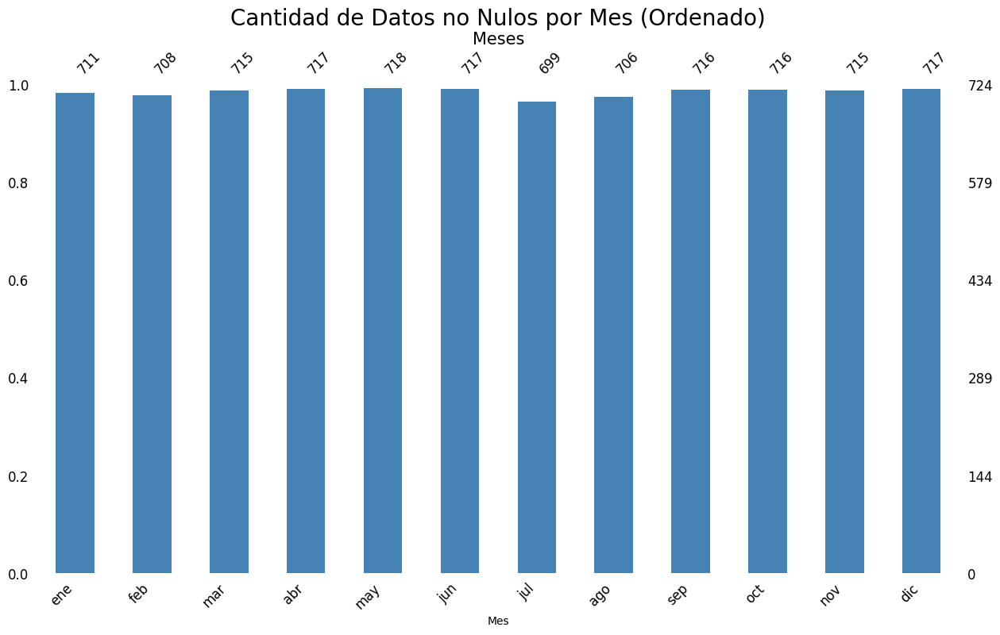

In [14]:
# En esta sección se crea un gráfico de barras que muestra la cantidad de datos no nulos por mes para cada variable en el DataFrame enriquecido.
# Se utiliza la función pivot_table de pandas para reorganizar los datos y luego se usa missingno para visualizar la cantidad de datos no nulos.
# El gráfico resultante permite identificar rápidamente los meses con más o menos datos disponibles para cada variable en las estaciones meteorológicas.

df_pivoted = df_enriquecido.pivot_table(
    index=['Estación', 'Variable'],
    columns='Mes',
    values='Valor'
)
msno.bar(df_pivoted, fontsize=12, figsize=(15, 8), color='steelblue')
plt.title('Cantidad de Datos no Nulos por Mes (Ordenado)', fontsize=20)
plt.xlabel('Meses', fontsize=15)
plt.ylabel('Observaciones no nulas', fontsize=15)
plt.show()


<Axes: >

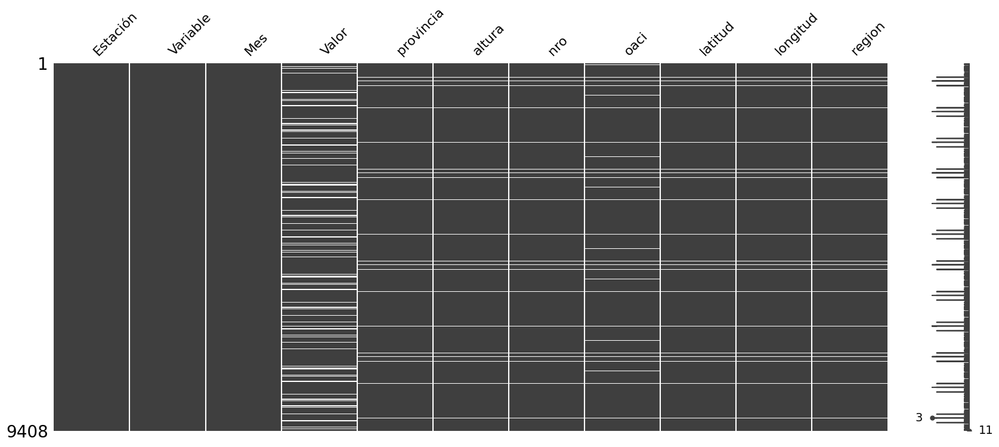

In [17]:
# Otra forma de visualizar la cantidad de datos no nulos por mes para cada variable en el DataFrame enriquecido es utilizando un gráfico de matriz de missingno.
msno.matrix(df_enriquecido , figsize=(20,8))

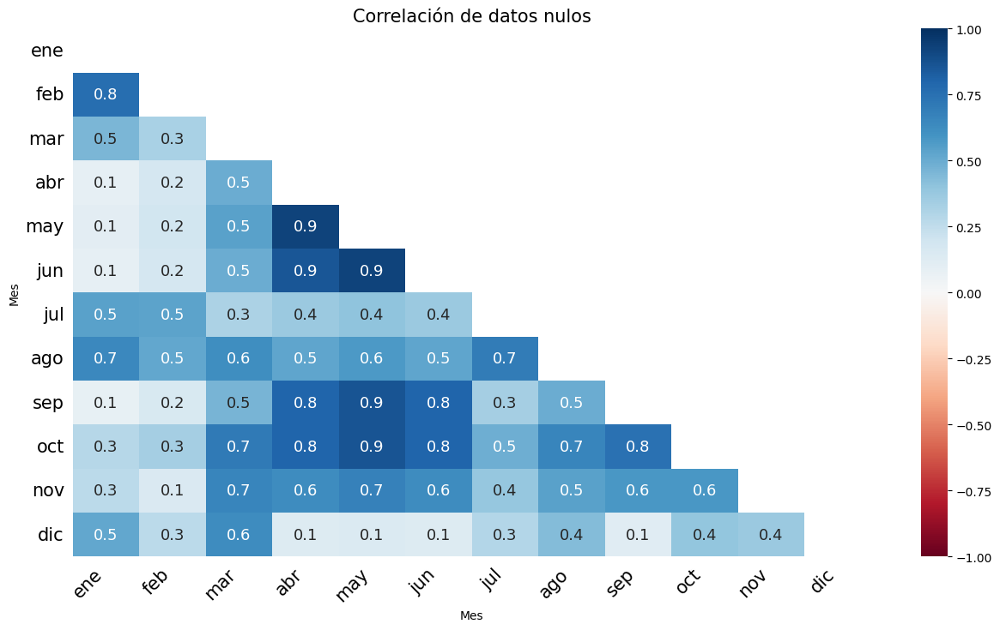

In [19]:
# Correlación de datos nulos
# En esta sección se crea un gráfico de calor que muestra la correlación entre los datos nulos en el DataFrame enriquecido.
# Se utiliza la función heatmap de missingno para visualizar
msno.heatmap(df_pivoted, fontsize=15, figsize=(15,8))
plt.title("Correlación de datos nulos", fontsize=15)
plt.show()

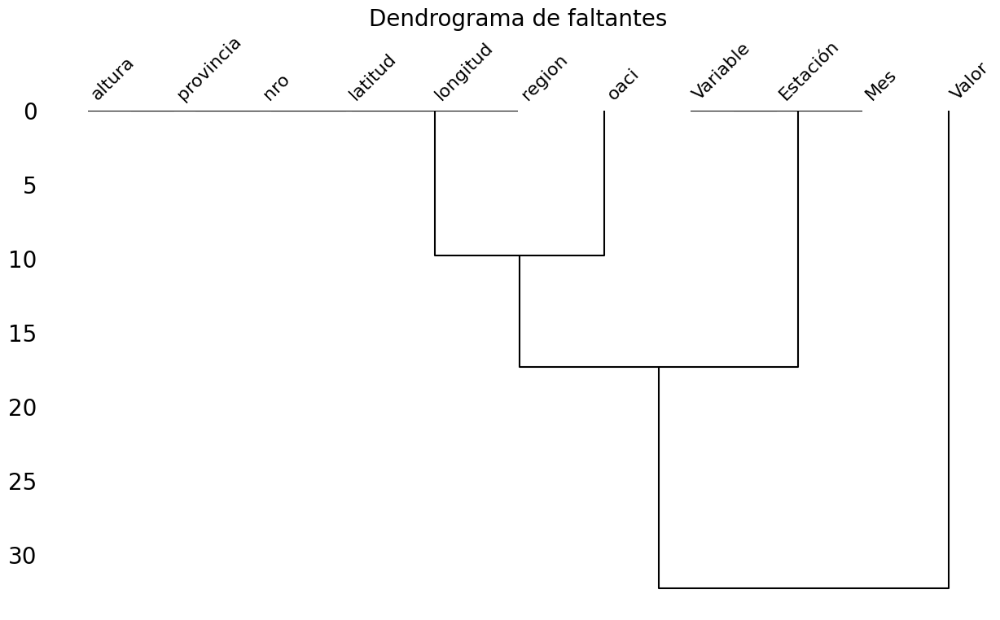

In [ ]:
#Se utiliza un dendrograma para visualizar la estructura de los datos nulos en el DataFrame enriquecido.
# El dendrograma permite identificar patrones en la distribución de los datos faltantes y agrupar las variables que tienen un comportamiento similar en cuanto a la presencia de datos nulos.
msno.dendrogram(df_enriquecido, figsize=(15,8))
plt.title('Dendrograma de faltantes', fontsize=20)
plt.show()

In [ ]:
# En esta sección se define una función para calcular el porcentaje de valores nulos por grupo en el DataFrame enriquecido agrupado por variables.
# Esto sirve para identificar qué grupos tienen una mayor proporción de datos faltantes en una columna específica.
# Lo que no da una idea si los nulos estan realacionados con algun grupo en particular, por ejemplo, si hay más nulos en una estación específica o en un mes específico.
# Lo que sirver para identificar patrones de datos faltantes en el DataFrame enriquecido y el tipo de valores nulos que se presentan.

def nulos_por_grupo(df, grupo_cols, target_col):
    agrupar_nulos = (
        df.groupby(grupo_cols, observed=True)[target_col]
        .apply(lambda x: x.isnull().mean() * 100)
        .reset_index(name=f'porcentaje_nulos_{target_col}')
    )
    return agrupar_nulos

# Ejemplos de análisis para 'Valor' (re-generamos para tener los DataFrames)
nulos_valor_por_estacion = nulos_por_grupo(df_enriquecido, 'Estación', 'Valor')
nulos_valor_por_variable = nulos_por_grupo(df_enriquecido, 'Variable', 'Valor')
nulos_valor_por_provincia = nulos_por_grupo(df_enriquecido, 'provincia', 'Valor')
nulos_valor_por_estacion_variable = nulos_por_grupo(df_enriquecido, ['Estación', 'Variable'], 'Valor')

# --- Cómo ordenar de mayor a menor ---

print("--- Nulos en 'Valor' por Estación (Ordenado de mayor a menor) ---")
nulos_age_por_estacion_ordenado = nulos_valor_por_estacion.sort_values(
    by='porcentaje_nulos_Valor',
    ascending=False
)
print(nulos_age_por_estacion_ordenado, "\n")


print("--- Nulos en 'Valor' por Variable (Ordenado de mayor a menor) ---")
nulos_valor_por_variable_ordenado = nulos_valor_por_variable.sort_values(
    by='porcentaje_nulos_Valor',
    ascending=False
)
print(nulos_valor_por_variable_ordenado, "\n")


print("--- Nulos en 'Valor' por provincia (Ordenado de mayor a menor) ---")
nulos_valor_por_provincia_ordenado = nulos_valor_por_provincia.sort_values(
    by='porcentaje_nulos_Valor',
    ascending=False
)
print(nulos_valor_por_provincia_ordenado, "\n")


print("--- Nulos en 'Valor' por Estación y Variable (Ordenado de mayor a menor) ---")
nulos_valor_por_estacion_variable_ordenado = nulos_valor_por_estacion_variable.sort_values(
    by='porcentaje_nulos_Valor',
    ascending=False
)
print(nulos_valor_por_estacion_variable_ordenado, "\n")

--- Nulos en 'Valor' por Estación (Ordenado de mayor a menor) ---
               Estación  porcentaje_nulos_Valor
4      base_belgrano_ii               50.000000
7         base_marambio               47.916667
55                obera               47.916667
6        base_esperanza               46.875000
9       base_san_martin               46.875000
..                  ...                     ...
85     sauce_viejo_aero                0.000000
83      santa_rosa_aero                0.000000
91         tucuman_aero                0.000000
96   villa_dolores_aero                0.000000
97  villa_reynolds_aero                0.000000

[98 rows x 2 columns] 

--- Nulos en 'Valor' por Variable (Ordenado de mayor a menor) ---
                               Variable  porcentaje_nulos_Valor
7                  velocidad_viento_kmh               39.795918
0  frecuencia_dias_precipitacion_gt_1mm                9.778912
3                      precipitacion_mm                9.778912
1          


# Tipos de datos faltantes

### 1. MAR (Missing at Random)
* **Qué es:** la falta del dato se explica por otra variable que sí podemos observar.
* **Ejemplo:** la **velocidad del viento** falta por completo en la estación **Orán Aero**, probablemente porque esa estación no tenía el equipamiento necesario. La ausencia depende de la variable `Estación`.

### 2. MNAR (Missing Not at Random)
* **Qué es:** la falta del dato es causada por el propio valor que no se pudo medir.
* **Ejemplo:** un termómetro que se congela y deja de reportar datos solo cuando la temperatura es extremadamente baja. La ausencia depende del valor extremo que no se registró.

### 3. MCAR (Missing Completely at Random)
* **Qué es:** la ausencia es puramente accidental y no tiene relación con ninguna variable.
* **Ejemplo:** un error humano al anotar un único dato al azar. Es poco probable que explique los patrones sistemáticos de tus datos.

---

# Interpretación detallada de los nulos por grupos

El orden de los resultados por porcentaje de nulos ofrece una visión clara y rápida de dónde se concentran los valores faltantes en la columna `Valor`. A continuación, se analiza cada agrupación.

---

## Nulos en 'Valor' por estación


### Análisis
Se observa una clara concentración de nulos en las **estaciones antárticas** (`Base Belgrano II`, `Base Marambio`, `Base Esperanza`, `Base San Martín`) y `Obera`, con porcentajes de nulos extremadamente altos (entre 46.8% y 50%). Esto sugiere problemas crónicos de recolección o transmisión de datos debido a su ubicación remota o condiciones extremas. En contraste, muchas estaciones presentan un 0% de nulos.

### Implicación
Los datos **no son MCAR** (Missing Completely At Random). La ausencia de datos en `Valor` está fuertemente condicionada por la `Estación`. Es más probable que sean **MNAR** (Missing Not At Random), porque las fallas en los equipos se relacionan directamente con las condiciones extremas que se intentan medir.

---

## Nulos en 'Valor' por variable


### Análisis
Esta tabla es muy reveladora. La variable **`velocidad_viento_kmh` se destaca de forma drástica con casi un 40% de nulos**. Las variables de precipitación también tienen un porcentaje notablemente alto (casi 10%), mientras que las de temperatura y nubosidad presentan muy pocos nulos.

### Implicación
Nuevamente, los datos **no son MCAR**. La probabilidad de un valor nulo en `Valor` depende fuertemente de la `Variable` que se mide. Este es un fuerte indicio de **MAR**, donde la ausencia se explica por el tipo de medición. Por ejemplo, los anemómetros (medidores de viento) podrían ser más propensos a fallar que otros sensores.

---

## Nulos en 'Valor' por provincia


### Análisis
La provincia de **Antártida** es, con diferencia, la que presenta la mayor proporción de nulos (casi 45%), lo cual es consistente con el análisis por estación. Le siguen **Chaco** y **Misiones**. Por otro lado, un gran número de provincias no tienen ningún valor nulo.

### Implicación
Esto confirma que los datos **no son MCAR**. La `provincia` de origen es un factor muy importante que explica la presencia de nulos.

---

## Nulos en 'Valor' por estación y variable

### Análisis
Esta tabla ofrece la prueba más contundente. Vemos que combinaciones específicas de `Estación` y `Variable` tienen un **100% de nulos**.

### Implicación
Definitivamente, los datos **no son MCAR**. La ausencia es **sistemática** y depende de la combinación de *dónde* (`Estación`) y *qué* (`Variable`) se mide. Esto es un caso claro de **MAR** e incluso podría tener componentes de **MNAR**, si la falta de registro se debe a que la medición es imposible de obtener en ciertas condiciones.

---

## Conclusión general

Con base en todos los análisis, podemos afirmar con alta confianza que los datos faltantes en la columna `Valor` **no son MCAR**. La distribución de los nulos es altamente dependiente de la `Estación` y de la `Variable`.

Esto indica que el mecanismo de pérdida es **MAR (Missing At Random)**, ya que la probabilidad de que un valor falte se relaciona de forma sistemática con otra información que sí tenemos en el conjunto de datos.


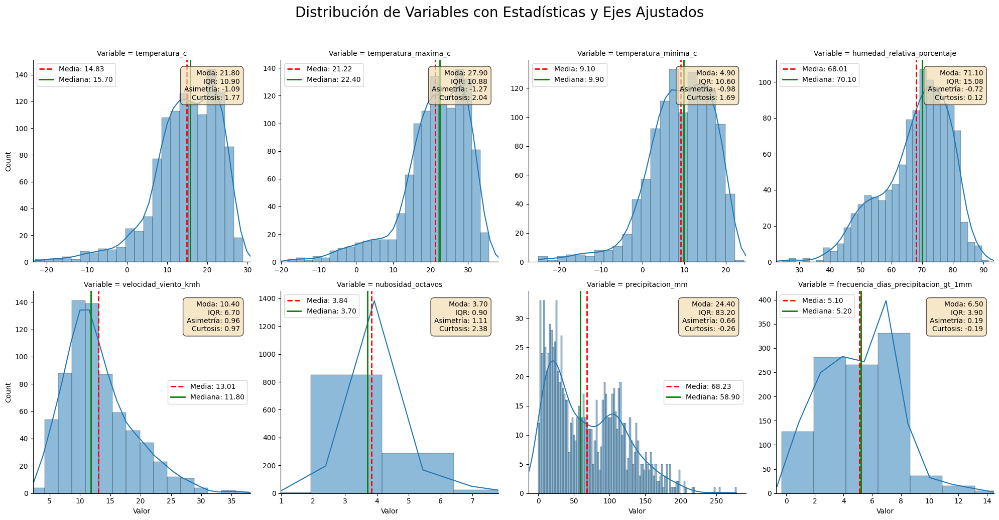

In [23]:
estadisticas_generales = df_enriquecido.groupby('Variable').agg(
    media=('Valor', 'mean'),
    mediana=('Valor', 'median'),
    moda=('Valor', mode),
    iqr=('Valor', iqr),
    asimetria_pearson=('Valor', pd.Series.skew),
    curtosis_fisher=('Valor', pd.Series.kurt),
    minimo=('Valor', 'min'),
    maximo=('Valor', 'max') 
)

g = sns.displot(
    data=df_enriquecido,
    x='Valor',
    col='Variable',
    col_wrap=4,
    kind='hist',
    kde=True,
    facet_kws={'sharey': False, 'sharex': False}
)

for ax in g.axes.flat:
    titulo = ax.get_title()
    nombre_variable = titulo.split(' = ')[1]
    stats_variable = estadisticas_generales.loc[nombre_variable]

    if not stats_variable.empty:
        min_val = stats_variable['minimo']
        max_val = stats_variable['maximo']
        padding = (max_val - min_val) * 0.05
        ax.set_xlim(min_val - padding, max_val + padding)
        
        media = stats_variable['media']
        mediana = stats_variable['mediana']
        moda = stats_variable['moda']
        r_iqr = stats_variable['iqr']
        asim = stats_variable['asimetria_pearson']
        curt = stats_variable['curtosis_fisher']
        
        ax.axvline(media, color='red', linestyle='--', linewidth=2, label=f'Media: {media:.2f}')
        ax.axvline(mediana, color='green', linestyle='-', linewidth=2, label=f'Mediana: {mediana:.2f}')
        
        texto_stats = (
            f"Moda: {moda:.2f}\n"
            f"IQR: {r_iqr:.2f}\n"
            f"Asimetría: {asim:.2f}\n"
            f"Curtosis: {curt:.2f}"
        )
        
        ax.text(0.95, 0.95, texto_stats,
                transform=ax.transAxes,
                fontsize=10,
                verticalalignment='top',
                horizontalalignment='right',
                bbox=dict(boxstyle='round,pad=0.5', fc='wheat', alpha=0.7))
        
        ax.legend()

g.fig.suptitle('Distribución de Variables con Estadísticas y Ejes Ajustados', y=1.03, fontsize=20)
g.tight_layout()
plt.show()

--- Estadísticas para la provincia de: MENDOZA ---
                                          media  mediana  moda     iqr  asimetria_pearson  curtosis_fisher  minimo  maximo
Variable                                                                                                                  
frecuencia_dias_precipitacion_gt_1mm   2.933333     2.95   2.8   1.800           0.066931        -0.632993     0.6     5.4
humedad_relativa_porcentaje           56.086667    54.10  53.8  13.350           0.007384        -1.014701    40.0    70.4
nubosidad_octavos                      2.993333     2.95   2.7   0.500           0.495182        -0.135989     2.3     4.0
precipitacion_mm                      24.185000    23.85   3.1  20.650           0.339670        -0.806592     3.1    54.2
temperatura_c                         15.586667    15.95   7.4  10.725          -0.056774        -1.272642     3.8    25.9
temperatura_maxima_c                  23.191667    23.45  15.3  10.650          -0.05797

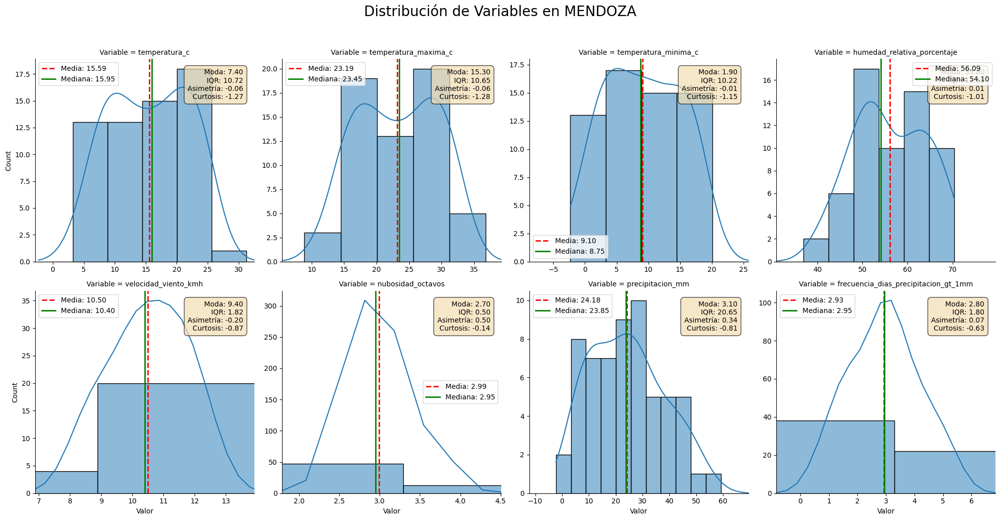

In [24]:
provincia_seleccionada = 'MENDOZA'  # Cambiar esto por la provincia que quieras analizar
df_provincia = df_enriquecido[df_enriquecido['provincia'] == provincia_seleccionada]

estadisticas_provincia = df_provincia.groupby('Variable').agg(
    media=('Valor', 'mean'),
    mediana=('Valor', 'median'),
    moda=('Valor', mode),
    iqr=('Valor', iqr),
    asimetria_pearson=('Valor', pd.Series.skew),
    curtosis_fisher=('Valor', pd.Series.kurt),
    minimo=('Valor', 'min'),
    maximo=('Valor', 'max')
)

print(f"--- Estadísticas para la provincia de: {provincia_seleccionada} ---")
print(estadisticas_provincia)


g = sns.displot(
    data=df_provincia,
    x='Valor',
    col='Variable',
    col_wrap=4,
    kind='hist',
    kde=True,
    facet_kws={'sharey': False, 'sharex': False}
)

for ax in g.axes.flat:
    titulo = ax.get_title()
    nombre_variable = titulo.split(' = ')[1]

    stats_variable = estadisticas_provincia.loc[nombre_variable]

    if not stats_variable.empty:
        min_val = stats_variable['minimo']
        max_val = stats_variable['maximo']
        padding = (max_val - min_val) * 0.30
        if padding == 0: padding = 1 
        ax.set_xlim(min_val - padding, max_val + padding)
        
        media = stats_variable['media']
        mediana = stats_variable['mediana']
        moda = stats_variable['moda']
        r_iqr = stats_variable['iqr']
        asim = stats_variable['asimetria_pearson']
        curt = stats_variable['curtosis_fisher']
        
        ax.axvline(media, color='red', linestyle='--', linewidth=2, label=f'Media: {media:.2f}')
        ax.axvline(mediana, color='green', linestyle='-', linewidth=2, label=f'Mediana: {mediana:.2f}')
        
        texto_stats = (
            f"Moda: {moda:.2f}\n"
            f"IQR: {r_iqr:.2f}\n"
            f"Asimetría: {asim:.2f}\n"
            f"Curtosis: {curt:.2f}"
        )
        
        ax.text(0.95, 0.95, texto_stats,
                transform=ax.transAxes,
                fontsize=10,
                verticalalignment='top',
                horizontalalignment='right',
                bbox=dict(boxstyle='round,pad=0.5', fc='wheat', alpha=0.7))
        
        ax.legend()

g.fig.suptitle(f'Distribución de Variables en {provincia_seleccionada}', y=1.03, fontsize=20)
g.tight_layout()
plt.show()


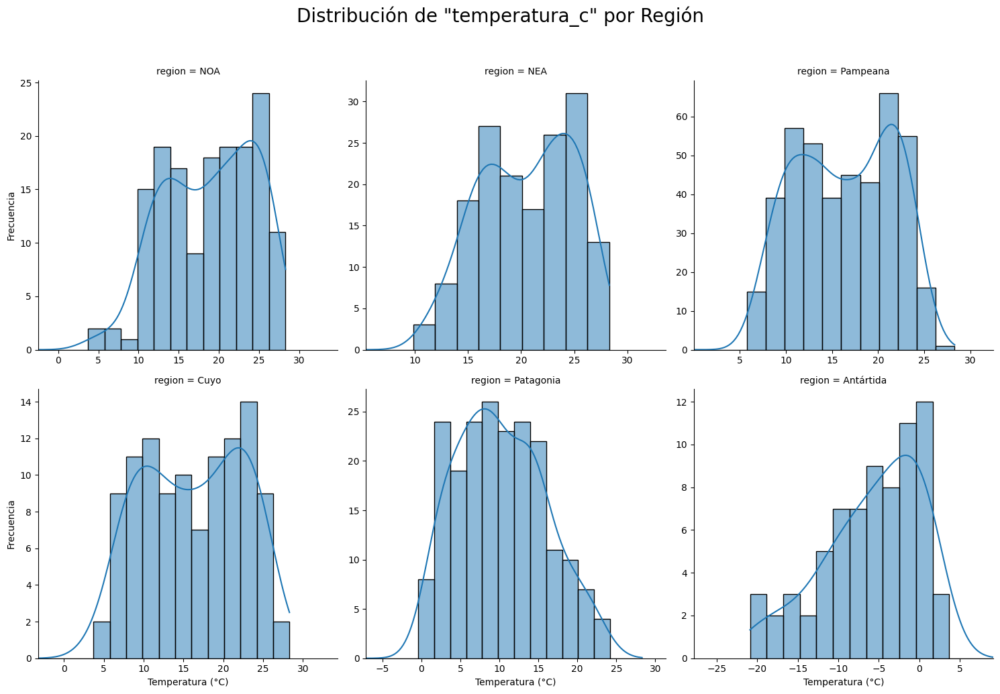

In [25]:
# 1. Filtrar para una sola variable de interés
variable_a_analizar = 'temperatura_c'
df_filtrado_region = df_enriquecido[df_enriquecido['Variable'] == variable_a_analizar].copy()

# 2. Calcular los rangos (mínimo y máximo) para cada región
rangos_por_region = df_filtrado_region.groupby('region')['Valor'].agg(['min', 'max'])

# 3. Crear el gráfico de distribución con ejes independientes
g = sns.displot(
    data=df_filtrado_region,
    x='Valor',
    col='region',
    col_wrap=3,
    kind='hist',
    kde=True,
    facet_kws={'sharey': False, 'sharex': False} # Ejes X independientes
)

# 4. Iterar sobre cada eje para ajustar la escala dinámicamente
for ax in g.axes.flat:
    titulo = ax.get_title()
    nombre_region = titulo.split(' = ')[1]

    if nombre_region in rangos_por_region.index:
        min_val = rangos_por_region.loc[nombre_region, 'min']
        max_val = rangos_por_region.loc[nombre_region, 'max']
        
        padding = (max_val - min_val) * 0.3
        
        ax.set_xlim(min_val - padding, max_val + padding)

# 5. Ajustar títulos y mostrar
g.fig.suptitle(f'Distribución de "{variable_a_analizar}" por Región', y=1.03, fontsize=20)
g.set_axis_labels("Temperatura (°C)", "Frecuencia")
g.fig.tight_layout()
plt.show()

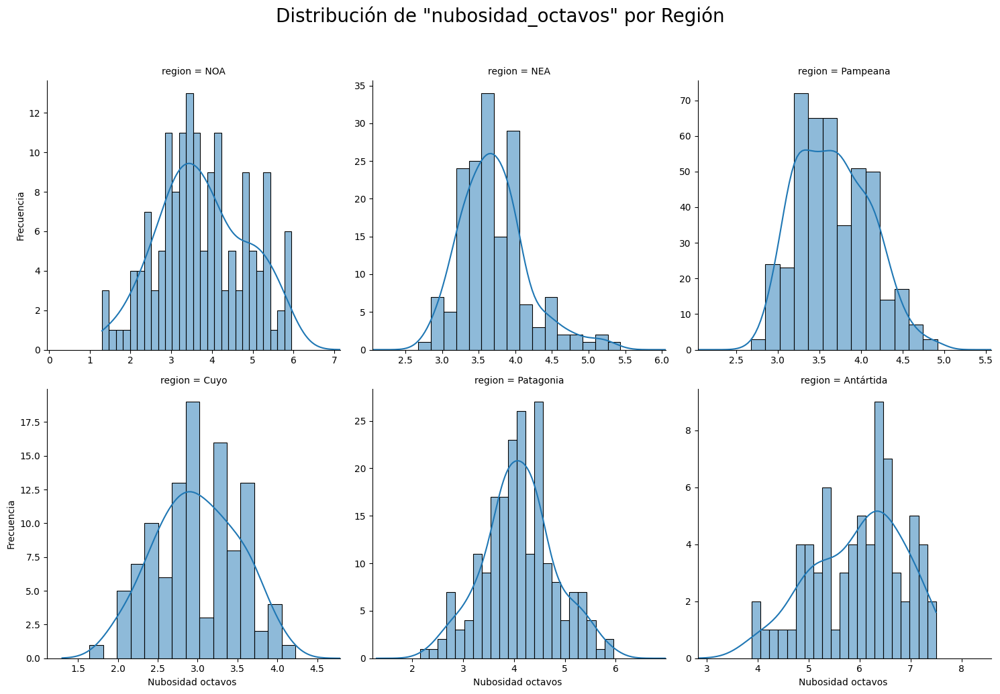

In [26]:
# 1. Filtrar para una sola variable de interés
variable_a_analizar = 'nubosidad_octavos'
df_filtrado_region = df_enriquecido[df_enriquecido['Variable'] == variable_a_analizar].copy()

# 2. Calcular los rangos (mínimo y máximo) para cada región
rangos_por_region = df_filtrado_region.groupby('region')['Valor'].agg(['min', 'max'])

# 3. Crear el gráfico de distribución con ejes independientes
g = sns.displot(
    data=df_filtrado_region,
    x='Valor',
    col='region',
    col_wrap=3,
    kind='hist',
    kde=True,
    facet_kws={'sharey': False, 'sharex': False} # Ejes X independientes
)

# 4. Iterar sobre cada eje para ajustar la escala dinámicamente
for ax in g.axes.flat:
    titulo = ax.get_title()
    nombre_region = titulo.split(' = ')[1]

    if nombre_region in rangos_por_region.index:
        min_val = rangos_por_region.loc[nombre_region, 'min']
        max_val = rangos_por_region.loc[nombre_region, 'max']
        
        padding = (max_val - min_val) * 0.3
        
        ax.set_xlim(min_val - padding, max_val + padding)

# 5. Ajustar títulos y mostrar
g.fig.suptitle(f'Distribución de "{variable_a_analizar}" por Región', y=1.03, fontsize=20)
g.set_axis_labels("Nubosidad octavos ", "Frecuencia")
g.fig.tight_layout()
plt.show()

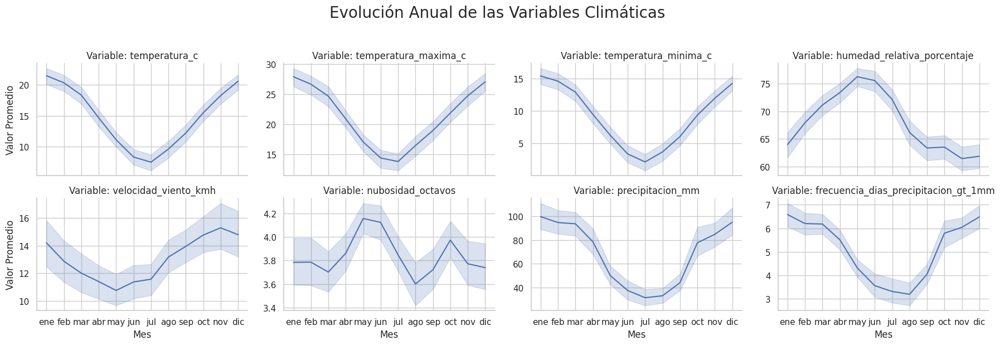

In [27]:
sns.set_theme(style="whitegrid")

g = sns.relplot(
    data=df_enriquecido,
    x='Mes',
    y='Valor',
    col='Variable',
    kind='line',
    col_wrap=4,
    height=3,
    aspect=1.5,
    facet_kws={'sharey': False, 'sharex': True}
)

g.fig.suptitle('Evolución Anual de las Variables Climáticas', y=1.03, fontsize=20)
g.set_titles("Variable: {col_name}")
g.set_axis_labels("Mes", "Valor Promedio")
plt.tight_layout()
plt.show()

## Descripción General de las Distribuciones de Variables Climáticas

### 1. Temperatura ($temperatura\_c$)

* **Evolución Anual (General):** Sigue un patrón estacional claro, con valores promedio bajos en invierno (julio) y altos en verano (enero-febrero). La banda sombreada indica una variabilidad considerable a lo largo del año.
* **Distribución General:** La distribución general de la temperatura tiende a ser bimodal o presenta una ligera asimetría, con una cola más larga hacia valores más bajos. La media se sitúa alrededor de 14.83 °C y la mediana en 15.70 °C, sugiriendo una ligera asimetría negativa. El rango intercuartílico (IQR) es de 10.98, indicando una dispersión moderada. La curtosis de 1.77 sugiere colas más ligeras que una distribución normal.
* **Distribución en Mendoza:** En Mendoza, la distribución de la temperatura ($temperatura\_c$) se centra alrededor de una media de 15.59 °C y una mediana de 15.95 °C. Presenta un IQR de 10.72 y una curtosis de -1.27, lo que indica una distribución más aplanada (platicúrtica) y posiblemente bimodal o con dos picos, uno alrededor de 10-15°C y otro cerca de 20-25°C. La asimetría es de -0.06, lo que sugiere una distribución casi simétrica o ligeramente sesgada a la izquierda.
* **Distribución por Región:** La distribución de temperatura varía significativamente por región.
    * **NOA, NEA, Pampeana y Cuyo:** Muestran distribuciones que parecen bimodales o con un rango amplio de temperaturas, reflejando las variaciones estacionales. Las temperaturas promedio son más cálidas en estas regiones.
    * **Patagonia:** Presenta un rango de temperaturas más bajas y una distribución más concentrada en valores fríos, aunque con cierta variabilidad.
    * **Antártida:** Exhibe las temperaturas más bajas y una distribución notablemente sesgada hacia valores negativos, con un rango de temperatura mucho más frío en comparación con las demás regiones.

### 2. Temperatura Máxima ($temperatura\_maxima\_c$)

* **Evolución Anual (General):** Al igual que la temperatura promedio, la temperatura máxima muestra una clara estacionalidad, alcanzando sus picos en los meses de verano y sus mínimos en invierno.
* **Distribución General:** La distribución general de la temperatura máxima tiene una media de 21.22 °C y una mediana de 22.40 °C. El IQR es de 13.68, lo que indica una dispersión considerable. La asimetría de -0.08 sugiere una distribución casi simétrica. La curtosis de -0.94 indica que la distribución es más aplanada (platicúrtica) que una normal.
* **Distribución en Mendoza:** Para Mendoza, la temperatura máxima ($temperatura\_maxima\_c$) tiene una media de 23.19 °C y una mediana de 23.45 °C. El IQR es de 13.29, y la asimetría de -0.28 indica un ligero sesgo hacia valores más bajos. La curtosis de -1.20 sugiere una distribución más aplanada que la normal.

### 3. Temperatura Mínima ($temperatura\_minima\_c$)

* **Evolución Anual (General):** La temperatura mínima también sigue un patrón estacional, con los valores más bajos en invierno y los más altos en verano.
* **Distribución General:** La distribución general de la temperatura mínima muestra una media de 9.30 °C y una mediana de 9.90 °C. El IQR es de 10.60, indicando una dispersión similar a la temperatura máxima. La asimetría es de -0.08, sugiriendo una distribución casi simétrica. La curtosis de -1.69 indica que es más aplanada que una distribución normal.
* **Distribución en Mendoza:** La temperatura mínima ($temperatura\_minima\_c$) en Mendoza presenta una media de 8.94 °C y una mediana de 8.75 °C. Con un IQR de 10.22 y una asimetría de -0.01, la distribución es casi simétrica. La curtosis de -1.15 la hace más aplanada que una distribución normal.

### 4. Humedad Relativa ($humedad\_relativa\_porcentaje$)

* **Evolución Anual (General):** La humedad relativa muestra una tendencia estacional inversa a la temperatura, con valores más altos en los meses más fríos y más bajos en los meses más cálidos.
* **Distribución General:** La distribución general de la humedad relativa es multimodal o tiene una forma irregular. La media se encuentra en 68.01 % y la mediana en 70.10 %. El IQR de 13.08 indica una dispersión moderada. La asimetría de -0.22 sugiere un ligero sesgo hacia valores más altos de humedad. La curtosis de 0.12 indica una forma similar a una normal o ligeramente más puntiaguda.
* **Distribución en Mendoza:** En Mendoza, la humedad relativa ($humedad\_relativa\_porcentaje$) tiene una media de 56.09 % y una mediana de 54.10 %. El IQR es de 10.98 y la asimetría de -1.01, lo que indica un sesgo significativo hacia valores más altos de humedad. La curtosis de -1.01 sugiere una distribución más aplanada.

### 5. Velocidad del Viento ($velocidad\_viento\_kmh$)

* **Evolución Anual (General):** La velocidad del viento presenta cierta estacionalidad, con valores ligeramente más altos en primavera-verano y más bajos en invierno.
* **Distribución General:** La distribución general de la velocidad del viento parece tener una cola larga hacia valores más altos, indicando la ocurrencia de vientos fuertes ocasionales. La media es de 10.40 km/h y la mediana de 11.85 km/h. El IQR es de 6.94 y la asimetría de 0.96, confirmando un sesgo positivo (hacia la derecha). La curtosis de 0.97 indica colas más pesadas que una normal.
* **Distribución en Mendoza:** En Mendoza, la velocidad del viento ($velocidad\_viento\_kmh$) tiene una media de 10.50 km/h y una mediana de 10.40 km/h. El IQR es de 3.80, lo que sugiere una menor dispersión en comparación con la distribución general. La asimetría de 1.02 y una curtosis de 0.87 confirman un sesgo positivo y colas más pesadas.

### 6. Nubosidad ($nubosidad\_octavos$)

* **Evolución Anual (General):** La nubosidad muestra fluctuaciones a lo largo del año, con valores ligeramente más altos en los meses de invierno y primavera.
* **Distribución General:** La distribución general de la nubosidad es marcadamente asimétrica, concentrándose en valores bajos (poca nubosidad) y con una cola que se extiende hacia valores más altos (mayor nubosidad). La media es de 3.70 octavos y la mediana de 3.84 octavos. El IQR de 1.90 y la asimetría de 0.70 reflejan este sesgo positivo. La curtosis de 3.38 indica una distribución con un pico más agudo y colas más pesadas que una normal.
* **Distribución en Mendoza:** La nubosidad ($nubosidad\_octavos$) en Mendoza tiene una media de 2.99 octavos y una mediana de 3.00 octavos, lo que sugiere cielos generalmente menos nublados que en el promedio general. El IQR es de 0.50, lo que indica una distribución más concentrada. La asimetría de 0.14 y una curtosis de -1.04 sugieren una distribución más simétrica y aplanada en comparación con la distribución general.

### 7. Precipitación ($precipitacion\_mm$)

* **Evolución Anual (General):** La precipitación es altamente estacional, con los mayores volúmenes concentrados en los meses de verano (especialmente de diciembre a marzo) y mínimos en invierno.
* **Distribución General:** La distribución general de la precipitación está fuertemente sesgada hacia cero, con una gran cantidad de días sin precipitación o con muy poca, y una larga cola hacia valores más altos que representan eventos de lluvia intensos. La media es de 24.40 mm y la mediana de 68.22 mm. El IQR de 83.90 y la asimetría de 1.50 confirman un fuerte sesgo positivo. La curtosis de 0.26 indica colas más pesadas que una normal.
* **Distribución en Mendoza:** La precipitación ($precipitacion\_mm$) en Mendoza tiene una media de 24.18 mm y una mediana de 23.85 mm. El IQR de 60.90 y la asimetría de 0.81 indican un sesgo positivo, aunque posiblemente menos pronunciado que en la distribución general, reflejando el clima más árido de la región. La curtosis de -0.21 sugiere una distribución ligeramente más aplanada.

### 8. Frecuencia de Días con Precipitación > 1mm ($frecuencia\_dias\_precipitacion\_gt\_1mm$)

* **Evolución Anual (General):** La frecuencia de días con precipitación sigue un patrón estacional similar a la precipitación total, siendo más alta en los meses de verano y más baja en invierno.
* **Distribución General:** La distribución general de la frecuencia de días con precipitación > 1mm también está sesgada hacia valores bajos, indicando que los días con precipitación significativa son menos frecuentes. La media es de 5.10 días y la mediana de 5.20 días. El IQR de 1.90 y la asimetría de 0.19 sugieren un ligero sesgo positivo. La curtosis de -0.10 indica una forma similar a una distribución normal.
* **Distribución en Mendoza:** La frecuencia de días con precipitación > 1mm ($frecuencia\_dias\_precipitacion\_gt\_1mm$) en Mendoza tiene una media de 2.93 días y una mediana de 2.80 días. El IQR es de 0.83, lo que sugiere una menor variabilidad. La asimetría de 0.77 y una curtosis de 0.33 indican un sesgo positivo y colas ligeramente más pesadas, lo que es consistente con una región con menor frecuencia de lluvias significativas.

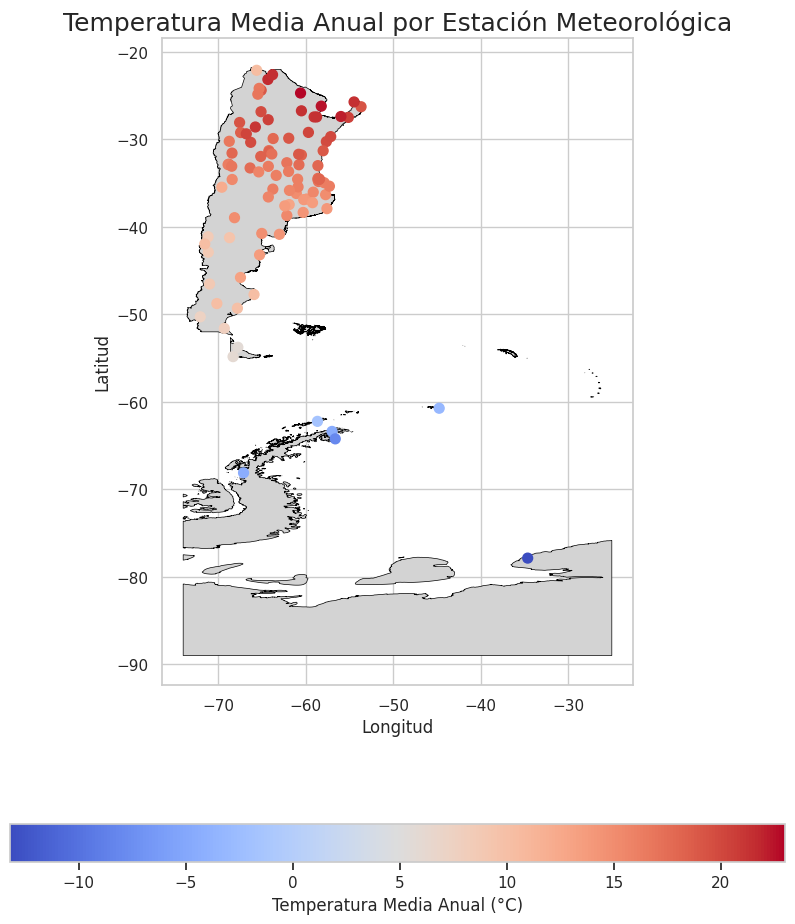

In [28]:

gdf_estaciones = geopandas.GeoDataFrame(
    df_bases, 
    geometry=geopandas.points_from_xy(df_bases.longitud, df_bases.latitud),
    crs="EPSG:4326"
)

#  2. Preparar los Datos a Visualizar 
df_temperatura_media = df_enriquecido[df_enriquecido['Variable'] == 'temperatura_c'].groupby('Estación')['Valor'].mean().reset_index()
df_temperatura_media.rename(columns={'Valor': 'temp_media_anual'}, inplace=True)
#  3. Unir Datos  
gdf_final_para_mapa = pd.merge(
    gdf_estaciones,
    df_temperatura_media,
    on='Estación',
    how='inner'
)

#  4. Dibujar el Mapa 
ruta_al_mapa = "datos/pais/paisPolygon.shp"  # <-- CAMBIÁ ESTA RUTA
argentina_mapa = geopandas.read_file(ruta_al_mapa)


# Creamos la figura y el eje del gráfico
fig, ax = plt.subplots(1, 1, figsize=(10, 12))

# Dibujamos el mapa de provincias como base
argentina_mapa.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.5)

# Superponemos los puntos de las estaciones
gdf_final_para_mapa.plot(
    column='temp_media_anual', 
    ax=ax, 
    legend=True,
    cmap='coolwarm',
    markersize=50,
    legend_kwds={'label': "Temperatura Media Anual (°C)", 'orientation': "horizontal"}
)

# Configuramos el título y los ejes
ax.set_title('Temperatura Media Anual por Estación Meteorológica', fontsize=18)
ax.set_xlabel('Longitud')
ax.set_ylabel('Latitud')
ax.set_aspect('equal')
plt.show()

Columnas disponibles en el mapa final: Index(['gid', 'entidad', 'fna', 'gna', 'nam', 'in1', 'fdc', 'sag', 'geometry', 'provincia_limpia', 'provincia', 'temp_media_provincial'], dtype='object')


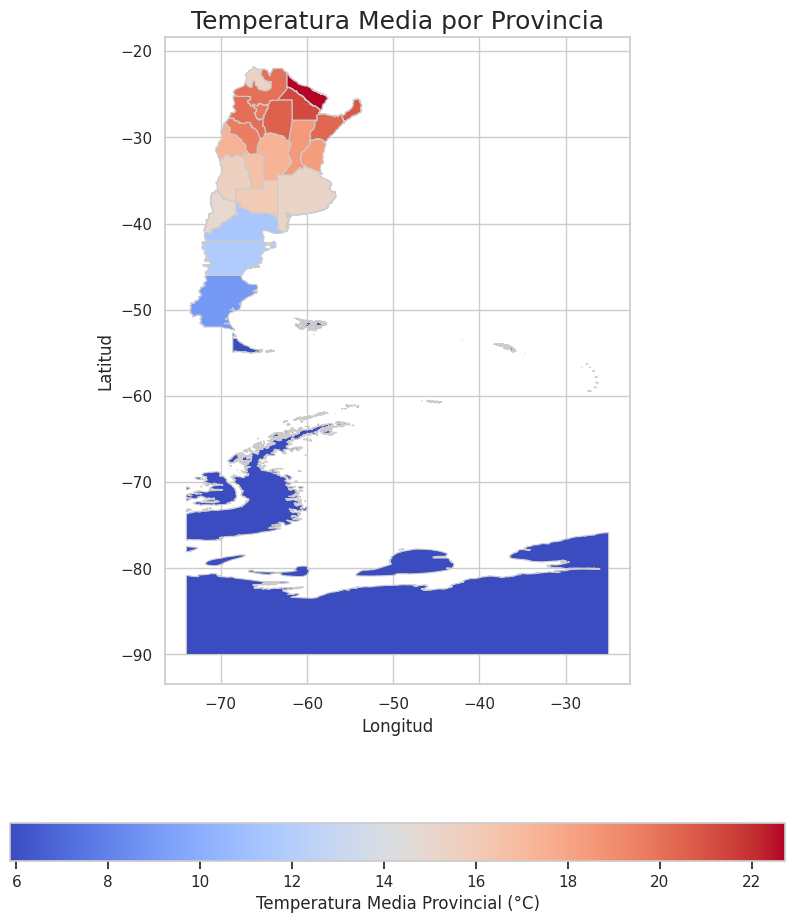

In [29]:
# a) Calcular la temperatura media por provincia
df_temp_provincia = df_enriquecido[df_enriquecido['Variable'] == 'temperatura_c'].groupby('provincia')['Valor'].mean().reset_index()

# b) Renombrar la columna 'Valor' a su nombre final
df_temp_provincia.rename(columns={'Valor': 'temp_media_provincial'}, inplace=True)

# c) Limpiar los nombres de las provincias para la unión
df_temp_provincia['provincia_limpia'] = df_temp_provincia['provincia'].apply(limpiar_texto)

mapa_correcciones = {
    'tierra_del_fueg': 'tierra_del_fuego_antartida_e_islas_del_atlantico_sur',
    'santiago_del_es': 'santiago_del_estero',
    'capital_federal': 'ciudad_autonoma_de_buenos_aires'
}
df_temp_provincia['provincia_limpia'] = df_temp_provincia['provincia_limpia'].replace(mapa_correcciones)


#  2. PREPARAR DATOS DEL MAPA 

ruta_mapa_provincias = "datos/provincia/provinciaPolygon.shp"
mapa_provincias = geopandas.read_file(ruta_mapa_provincias)


mapa_provincias['provincia_limpia'] = mapa_provincias['nam'].apply(limpiar_texto)


#  3. UNIR LOS DATAFRAMES 

mapa_final = pd.merge(
    mapa_provincias,
    df_temp_provincia,
    on='provincia_limpia',
    how='left'
)


#  4. DIBUJAR EL MAPA 

print("Columnas disponibles en el mapa final:", mapa_final.columns)

fig, ax = plt.subplots(1, 1, figsize=(10, 12))

mapa_final.plot(
    column='temp_media_provincial',
    ax=ax,
    legend=True,
    cmap='coolwarm',
    linewidth=0.8,
    edgecolor='0.8',
    missing_kwds={
        "color": "lightgrey",
        "edgecolor": "red",
        "hatch": "///",
        "label": "Sin datos",
    },
    legend_kwds={'label': "Temperatura Media Provincial (°C)", 'orientation': "horizontal"}
)

ax.set_title('Temperatura Media por Provincia', fontsize=18)
ax.set_xlabel('Longitud')
ax.set_ylabel('Latitud')
ax.set_aspect('equal')
plt.show()

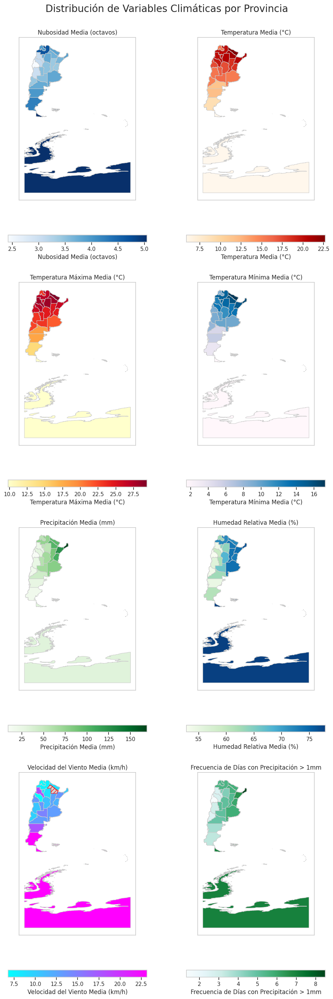

In [ ]:



#  1. PREPARAR DATOS DE NUBOSIDAD 
df_nubo_provincia = df_enriquecido[df_enriquecido['Variable'] == 'nubosidad_octavos'].groupby('provincia')['Valor'].mean().reset_index()
df_nubo_provincia.rename(columns={'Valor': 'nubo_media_provincial'}, inplace=True)
df_nubo_provincia['provincia_limpia'] = df_nubo_provincia['provincia'].apply(limpiar_texto)
mapa_correcciones = {
    'tierra_del_fueg': 'tierra_del_fuego_antartida_e_islas_del_atlantico_sur',
    'santiago_del_es': 'santiago_del_estero',
    'capital_federal': 'ciudad_autonoma_de_buenos_aires'
}
df_nubo_provincia['provincia_limpia'] = df_nubo_provincia['provincia_limpia'].replace(mapa_correcciones)

#  2. PREPARAR DATOS DEL MAPA 
ruta_mapa_provincias = "datos/provincia/provinciaPolygon.shp"
mapa_provincias = geopandas.read_file(ruta_mapa_provincias)
mapa_provincias['provincia_limpia'] = mapa_provincias['nam'].apply(limpiar_texto)

#  3. DICCIONARIO DE VARIABLES A PLOTEAR Y SUS PROPIEDADES 
variables_a_plotear = {
    'nubosidad_octavos': {
        'nombre_columna': 'nubo_media_provincial',
        'titulo': 'Nubosidad Media (octavos)',
        'cmap': 'Blues'
    },
      'temperatura_c': { 
        'nombre_columna': 'temp_media_provincial',
        'titulo': 'Temperatura Media (°C)',
        'cmap': 'OrRd'
    },
    'temperatura_maxima_c': {
        'nombre_columna': 'temp_max_media_provincial',
        'titulo': 'Temperatura Máxima Media (°C)',
        'cmap': 'YlOrRd'
    },
    'temperatura_minima_c': {
        'nombre_columna': 'temp_min_media_provincial',
        'titulo': 'Temperatura Mínima Media (°C)',
        'cmap': 'PuBu'
    },
    'precipitacion_mm': {
        'nombre_columna': 'precip_media_provincial',
        'titulo': 'Precipitación Media (mm)',
        'cmap': 'Greens'
    },
    'humedad_relativa_porcentaje': {
        'nombre_columna': 'humedad_media_provincial',
        'titulo': 'Humedad Relativa Media (%)',
        'cmap': 'GnBu'
    },
    'velocidad_viento_kmh': {
        'nombre_columna': 'viento_media_provincial',
        'titulo': 'Velocidad del Viento Media (km/h)',
        'cmap': 'cool'
    },
    'frecuencia_dias_precipitacion_gt_1mm': {
        'nombre_columna': 'frec_precip_media_provincial',
        'titulo': 'Frecuencia de Días con Precipitación > 1mm',
        'cmap': 'BuGn'
    }
}

#  4. CREAR EL SUBPLOT DE MAPAS 
n_variables = len(variables_a_plotear)
ncols = 2
nrows = (n_variables + ncols - 1) // ncols 

fig, axes = plt.subplots(nrows, ncols, figsize=(ncols * 6, nrows * 7)) # Ajusta el tamaño de la figura
axes = axes.flatten() 

for i, (variable_original, props) in enumerate(variables_a_plotear.items()):
    ax = axes[i]

    # Prepara los datos para la variable actual
    df_variable_provincia = df_enriquecido[df_enriquecido['Variable'] == variable_original].groupby('provincia')['Valor'].mean().reset_index()
    df_variable_provincia.rename(columns={'Valor': props['nombre_columna']}, inplace=True)
    df_variable_provincia['provincia_limpia'] = df_variable_provincia['provincia'].apply(limpiar_texto)
    df_variable_provincia['provincia_limpia'] = df_variable_provincia['provincia_limpia'].replace(mapa_correcciones)

    # Une los dataframes
    mapa_final_variable = pd.merge(
        mapa_provincias,
        df_variable_provincia,
        on='provincia_limpia',
        how='left'
    )

    # Dibuja el mapa
    mapa_final_variable.plot(
        column=props['nombre_columna'],
        ax=ax,
        legend=True,
        cmap=props['cmap'],
        linewidth=0.8,
        edgecolor='0.8',
        missing_kwds={
            "color": "lightgrey",
            "edgecolor": "red",
            "hatch": "///",
            "label": "Sin datos",
        },
        legend_kwds={'label': props['titulo'], 'orientation': "horizontal", 'shrink': 0.6} # Shrink para reducir el tamaño de la leyenda
    )

    ax.set_title(props['titulo'], fontsize=12)
    ax.set_xticks([]) 
    ax.set_yticks([]) 
    ax.set_aspect('equal')


for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout() # Ajusta el layout para evitar solapamientos
plt.suptitle('Distribución de Variables Climáticas por Provincia', fontsize=20, y=1.02) # Título general
plt.show()

In [31]:
#--- 1. Estadísticas Generales por Variable ---
print("--- 1. Estadísticas Generales por Variable ---")
estadisticas_generales = df_enriquecido.groupby('Variable').agg(
    conteo=('Valor', 'count'),
    media=('Valor', 'mean'),
    desvio_est=('Valor', 'std'),
    varianza=('Valor', 'var'),
    mediana=('Valor', 'median'),
    minimo=('Valor', 'min'),
    maximo=('Valor', 'max'),
    asimetria_pearson=('Valor', pd.Series.skew),
    curtosis_fisher=('Valor', pd.Series.kurt)
)
print(estadisticas_generales)

print("\n--- Moda por Variable ---")
moda_general = df_enriquecido.groupby('Variable')['Valor'].apply(lambda x: x.mode().iloc[0] if not x.mode().empty else np.nan)
print(moda_general)


# --- 2. Estadísticas por Región y Variable ---
print("\n" + "="*80)
print("--- 2. Estadísticas por Región y Variable ---")
estadisticas_por_region = df_enriquecido.groupby(['region', 'Variable']).agg(
    conteo=('Valor', 'count'),
    media=('Valor', 'mean'),
    desvio_est=('Valor', 'std'),
    varianza=('Valor', 'var'),
    mediana=('Valor', 'median'),
    minimo=('Valor', 'min'),
    maximo=('Valor', 'max'),
    asimetria_pearson=('Valor', pd.Series.skew),
    curtosis_fisher=('Valor', pd.Series.kurt)
)
print(estadisticas_por_region)

--- 1. Estadísticas Generales por Variable ---
                                      conteo      media  desvio_est     varianza  mediana  minimo  maximo  asimetria_pearson  curtosis_fisher
Variable                                                                                                                                     
frecuencia_dias_precipitacion_gt_1mm    1061   5.097455    2.536586     6.434267      5.2     0.0    13.8           0.185539        -0.186138
humedad_relativa_porcentaje             1110  68.005405   11.027475   121.605201     70.1    25.7    90.2          -0.719815         0.118628
nubosidad_octavos                       1166   3.840137    0.888284     0.789049      3.7     1.3     7.5           1.109340         2.384159
precipitacion_mm                        1061  68.234873   51.674519  2670.255915     58.9     0.0   277.9           0.663766        -0.262990
temperatura_c                           1167  14.834190    8.178787    66.892561     15.7   -20.9    

## Outlaiers

/home/rodrigo/Desktop/Maestria/EDA_meteorologica/eda/lib/python3.12/site-packages/seaborn/axisgrid.py:718: UserWarning: Using the boxplot function without specifying `order` is likely to produce an incorrect plot.
  warnings.warn(warning)


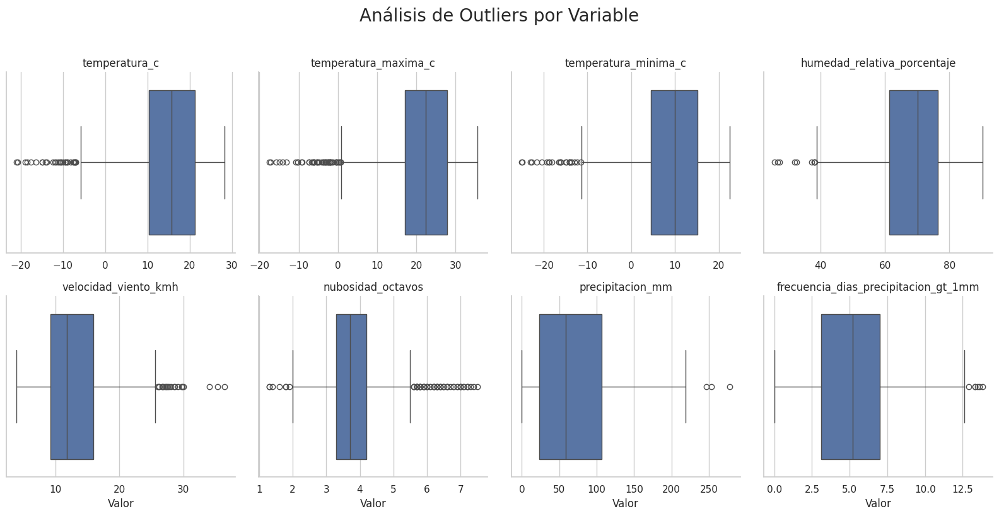

In [32]:
sns.set_theme(style="whitegrid")

g = sns.FacetGrid(
    df_enriquecido, 
    col="Variable", 
    col_wrap=4, 
    sharey=False, 
    sharex=False, 
    height=4
)

g.map(sns.boxplot, "Valor")

g.set_axis_labels("Valor", "")
g.set_titles("{col_name}")
g.fig.suptitle("Análisis de Outliers por Variable", y=1.02, fontsize=20)
plt.tight_layout()
plt.show()

In [33]:
Q1 = df_enriquecido.groupby('Variable')['Valor'].quantile(0.25)
Q3 = df_enriquecido.groupby('Variable')['Valor'].quantile(0.75)
IQR = Q3 - Q1
limite_inferior = Q1 - 1.5 * IQR
limite_superior = Q3 + 1.5 * IQR

limites = pd.DataFrame({'lim_inf': limite_inferior, 'lim_sup': limite_superior})
print("--- Límites para detección de outliers por Variable ---")
print(limites)

df_con_limites = pd.merge(df_enriquecido, limites, on='Variable', how='left')

outliers_generales = df_con_limites[
    (df_con_limites['Valor'] < df_con_limites['lim_inf']) | 
    (df_con_limites['Valor'] > df_con_limites['lim_sup'])
]

conteo_de_outliers = outliers_generales['Variable'].value_counts()

total_por_variable = df_enriquecido['Variable'].value_counts()

resumen_outliers = pd.DataFrame({
    'total_registros': total_por_variable,
    'cantidad_outliers': conteo_de_outliers
}).fillna(0)

resumen_outliers['porcentaje_outliers'] = (resumen_outliers['cantidad_outliers'] / resumen_outliers['total_registros']) * 100

print("\n--- Resumen Porcentual de Outliers por Variable ---")
print(resumen_outliers)

--- Límites para detección de outliers por Variable ---
                                       lim_inf   lim_sup
Variable                                                
frecuencia_dias_precipitacion_gt_1mm   -2.7500   12.8500
humedad_relativa_porcentaje            38.7125   99.0125
nubosidad_octavos                       1.9500    5.5500
precipitacion_mm                     -101.5000  231.3000
temperatura_c                          -6.0500   37.5500
temperatura_maxima_c                    0.7125   44.2125
temperatura_minima_c                  -11.4000   31.0000
velocidad_viento_kmh                   -0.8500   25.9500

--- Resumen Porcentual de Outliers por Variable ---
                                      total_registros  cantidad_outliers  porcentaje_outliers
Variable                                                                                     
frecuencia_dias_precipitacion_gt_1mm             1176                  6             0.510204
humedad_relativa_porcentaje            


--- Regiones encontradas: NOA, NEA, Pampeana, Cuyo, nan, Patagonia, Antártida ---


/home/rodrigo/Desktop/Maestria/EDA_meteorologica/eda/lib/python3.12/site-packages/seaborn/axisgrid.py:718: UserWarning: Using the boxplot function without specifying `order` is likely to produce an incorrect plot.
  warnings.warn(warning)
/home/rodrigo/Desktop/Maestria/EDA_meteorologica/eda/lib/python3.12/site-packages/seaborn/axisgrid.py:854: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  func(*plot_args, **plot_kwargs)
/home/rodrigo/Desktop/Maestria/EDA_meteorologica/eda/lib/python3.12/site-packages/seaborn/axisgrid.py:854: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  func(*plot_args, **plot_kwargs)
/home/rodrigo/Desktop/Maestria/EDA_meteorologica/eda/lib/python3.12/site-packages/seaborn/axisgrid.py:854: Future

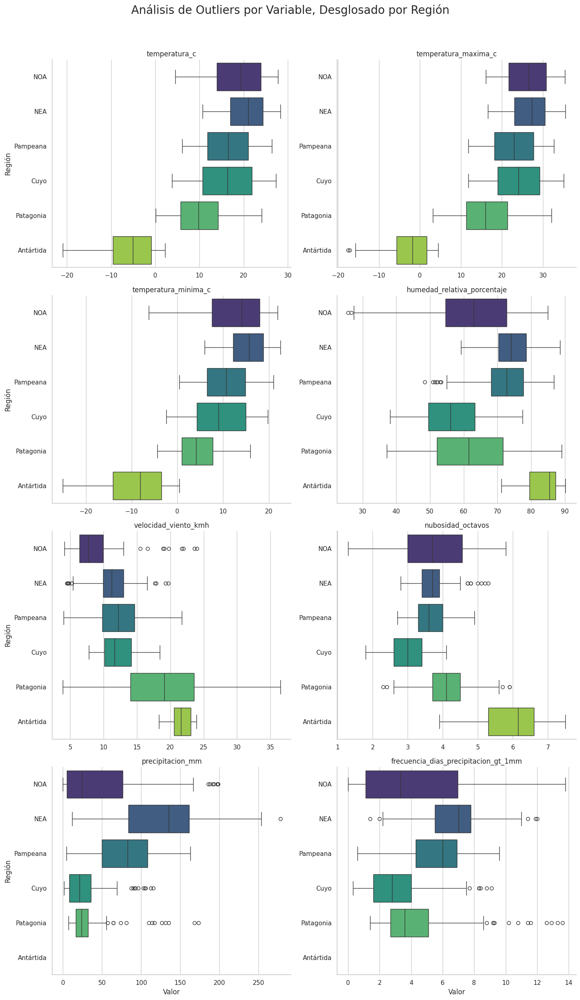

In [34]:
sns.set_theme(style="whitegrid")
regiones= df_enriquecido['region'].astype(str).unique()
print(f"\n--- Regiones encontradas: {', '.join(regiones)} ---")
g = sns.FacetGrid(
    df_enriquecido, 
    col="Variable", 
    col_wrap=2,  
    sharex=False, 
    sharey=False, 
    height=6,   
    aspect=1.2
)


g.map(sns.boxplot, 'Valor', 'region', palette='viridis')
g.set_axis_labels("Valor", "Región")
g.set_titles("{col_name}")
g.fig.suptitle("Análisis de Outliers por Variable, Desglosado por Región", y=1.02, fontsize=20)
plt.tight_layout()
plt.show()

In [35]:
# Calculamos los límites agrupando por región Y variable
Q1_region = df_enriquecido.groupby(['region', 'Variable'])['Valor'].quantile(0.25)
Q3_region = df_enriquecido.groupby(['region', 'Variable'])['Valor'].quantile(0.75)
IQR_region = Q3_region - Q1_region

# Calculamos los límites inferior y superior
lim_inf_region = Q1_region - 1.5 * IQR_region
lim_sup_region = Q3_region + 1.5 * IQR_region 

# Creamos un DataFrame con los límites
limites_region = pd.DataFrame({'lim_inf': lim_inf_region, 'lim_sup': lim_sup_region}).reset_index()
limites_region.head()
# Unimos los límites al DataFrame original
df_con_limites_region = pd.merge(df_enriquecido, limites_region, on=['region', 'Variable'], how='left')

# Filtramos los outliers usando los límites corregidos
outliers_region = df_con_limites_region[
    (df_con_limites_region['Valor'] < df_con_limites_region['lim_inf']) | 
    (df_con_limites_region['Valor'] > df_con_limites_region['lim_sup'])
]

conteo_outliers_region = outliers_region.groupby(['region', 'Variable']).size()
total_por_region = df_enriquecido.groupby(['region', 'Variable']).size()

resumen_outliers_region = pd.DataFrame({
    'total_registros': total_por_region,
    'cantidad_outliers': conteo_outliers_region
}).fillna(0)

resumen_outliers_region['porcentaje_outliers'] = \
    (resumen_outliers_region['cantidad_outliers'] / resumen_outliers_region['total_registros']) * 100

print("\n--- Resumen Porcentual de Outliers por Región ---")
print(resumen_outliers_region)


--- Resumen Porcentual de Outliers por Región ---
                                                total_registros  cantidad_outliers  porcentaje_outliers
region    Variable                                                                                     
Antártida frecuencia_dias_precipitacion_gt_1mm               72                0.0             0.000000
          humedad_relativa_porcentaje                        72                0.0             0.000000
          nubosidad_octavos                                  72                0.0             0.000000
          precipitacion_mm                                   72                0.0             0.000000
          temperatura_c                                      72                0.0             0.000000
          temperatura_maxima_c                               72                2.0             2.777778
          temperatura_minima_c                               72                0.0             0.000000
          vel

## 1. Límites de Detección

A continuación, se presentan los límites calculados para cada variable:

--- Límites para detección de outliers por Variable ---

| Variable                               | lim_inf | lim_sup |
|----------------------------------------|---------|---------|
| frecuencia_dias_precipitacion_gt_1mm  | -2.7500 | 12.8500 |
| humedad_relativa_porcentaje            | 38.7125 | 99.0125 |
| nubosidad_octavos                      | 1.9500  | 5.5500  |
| precipitacion_mm                       | -101.5000 | 231.3000 |
| temperatura_c                          | -6.0500 | 37.5500 |
| temperatura_maxima_c                   | 0.7125  | 44.2125 |
| temperatura_minima_c                   | -11.4000 | 31.0000 |
| velocidad_viento_kmh                   | -0.8500 | 25.9500 |

## 2. Análisis General de Outliers por Variable

**Observaciones:**

* **`nubosidad_octavos`** presenta el mayor porcentaje de outliers (5.87%), sugiriendo variaciones considerables en la cobertura nubosa.
* Las variables de temperatura (`temperatura_maxima_c`, `temperatura_c`, `temperatura_minima_c`) también muestran una cantidad notable de outliers, indicando registros de temperaturas inusualmente altas o bajas.
* **`precipitacion_mm`** tiene el menor porcentaje de outliers (0.26%), lo cual es esperable, ya que las precipitaciones extremadamente altas son eventos menos frecuentes.

## 3. Análisis de Outliers Desglosado por Región

### Diferencias Clave en los Outliers entre Regiones:

Las regiones presentan patrones distintivos en la aparición de outliers, lo que subraya la diversidad climática del país:

* **Antártida:** Destaca por la casi total ausencia de outliers, con la excepción de `temperatura_maxima_c`. Esto sugiere una menor variabilidad en sus condiciones climáticas en comparación con otras regiones.
* **Cuyo:** Muestra una alta concentración de outliers en variables relacionadas con la precipitación (`frecuencia_dias_precipitacion_gt_1mm` y `precipitacion_mm`), lo que podría indicar eventos de lluvias intensas o infrecuentes. No presenta outliers en temperatura ni viento. Esto se podria explicar por las tormentas de verano tipicas de esta region.
* **NEA y NOA:** Ambas regiones del norte exhiben outliers significativos en `velocidad_viento_kmh` y `precipitacion_mm`, además de `nubosidad_octavos` en el NEA.
* **Pampeana:** Se caracteriza por tener un bajo número de outliers en general, con solo `humedad_relativa_porcentaje` mostrando una proporción notable. Esto podría indicar una mayor estabilidad en sus patrones climáticos.
* **Patagonia:** Presenta un número considerable de outliers en `frecuencia_dias_precipitacion_gt_1mm` y `precipitacion_mm`, lo cual es coherente con su clima variable que puede incluir eventos de precipitación extremos. También se observan outliers en `nubosidad_octavos`.

***
## Planteamiento de un problema de machine learning supervisado: predicción del potencial solar relativo

### Descripción del problema: regresión para estimar irradiancia solar

El problema se define como una tarea de **regresión**. El objetivo es entrenar un modelo de machine learning que sea capaz de predecir el valor de un **índice relativo de irradiancia solar**, que hemos denominado `GHI_Proxy`.

El modelo aprenderá la relación entre un conjunto de variables predictoras (características meteorológicas y geográficas) y esta variable objetivo construida. En esencia, el modelo no predecirá una medida física directa en kWh/m², sino un valor numérico continuo que representa el potencial solar relativo. La utilidad de este enfoque es la capacidad de **clasificar y comparar** diferentes lugares y meses según su idoneidad para la generación de energía solar.

### Definición de la variable objetivo: `GHI_Proxy`

Dado que el conjunto de datos carece de una medida directa de irradiancia solar (como la Irradiancia Global Horizontal o GHI), se ha diseñado una **variable objetivo proxy** para superar esta limitación.

### Hipótesis para la construcción de la variable objetivo

La construcción de este proxy se basa en la siguiente hipótesis física: la **amplitud térmica diurna** (la diferencia entre la temperatura máxima y mínima) es un fuerte indicador de la cantidad de energía solar que incide sobre la superficie.

* Días Despejados: Una alta radiación solar provoca un gran calentamiento durante el día y un enfriamiento significativo durante la noche, resultando en una **gran amplitud térmica**.
* Días Nublados: La cobertura de nubes bloquea la radiación solar entrante (limitando la temperatura máxima) y retiene el calor saliente (elevando la temperatura mínima), lo que conduce a una **pequeña amplitud térmica**.

La nubosidad, por lo tanto, actúa como el principal factor que atenúa la energía solar recibida.

### Formulación de la variable

Basado en esta hipótesis, la variable objetivo `GHI_Proxy` se formula de la siguiente manera:

$$GHI\_Proxy = (temperatura\_maxima\_c - temperatura\_minima\_c) \times (1 - k \times nubosidad\_octavos)$$

Donde:
* `(temperatura_maxima_degc - temperatura_minima_degc)`: Representa la **amplitud térmica**, el motor principal del proxy.
* `nubosidad_total_octavos`: Es la variable que **atenúa directamente** el efecto de la amplitud térmica.
* `k`: Es una constante de escalamiento para ajustar el impacto de la nubosidad. Se propone un valor inicial de **k = 1/8**, asumiendo una relación lineal simple.

In [36]:
# Se convierte el DataFrame largo a formato ancho
df_wide = (
    df_enriquecido
    .pivot_table(
        index=["Estación", "Mes"], 
        columns="Variable",
        values="Valor"
    )
    .reset_index()
)
df_wide.columns.name = None

df_meta = (
    df_enriquecido
    .drop_duplicates(subset=["Estación"])
    .set_index("Estación")
    [["provincia", "region", "latitud", "longitud", "altura", "oaci", "nro"]]
)

df_wide = df_wide.merge(df_meta, on="Estación", how="left")

# Se calcula la variable objetivo GHI_Proxy
k = 1 / 8  # Constante de atenuación por nubosidad

df_wide["GHI_Proxy"] = (
    (df_wide["temperatura_maxima_c"] - df_wide["temperatura_minima_c"])
    * (1 - k * df_wide["nubosidad_octavos"])
)

/tmp/ipykernel_6908/3742613665.py:4: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  .pivot_table(


--- 1. Distribución General de GHI_Proxy ---


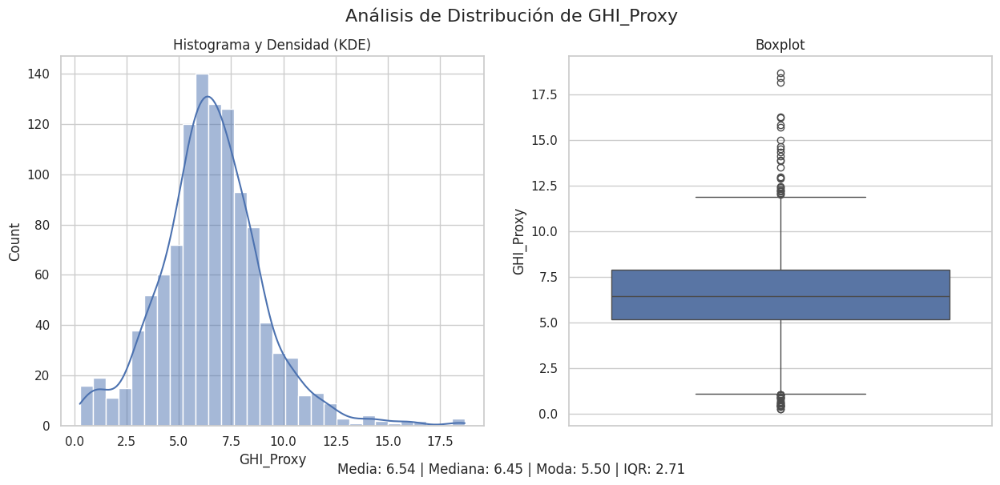



--- 2. Análisis Estadístico y Gráfico por Mes ---


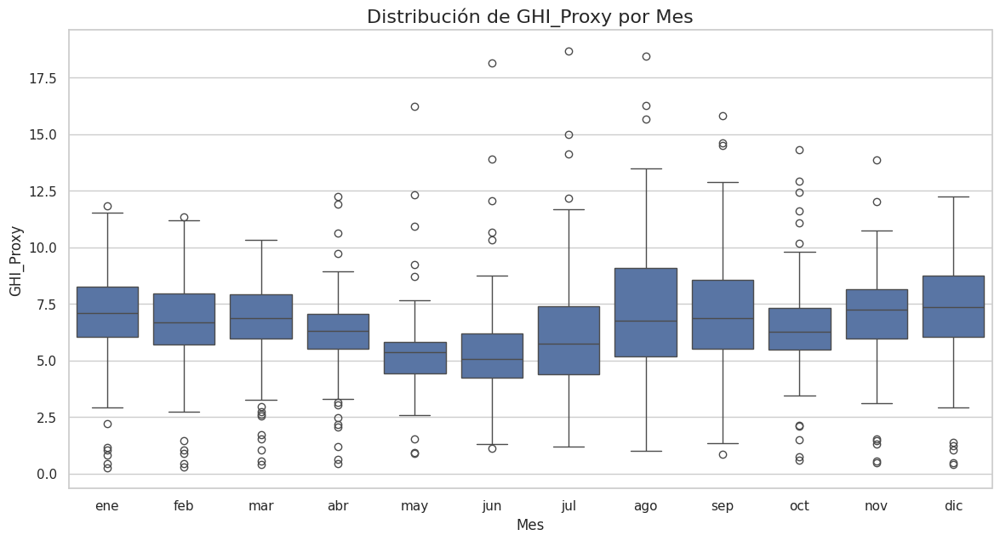



--- 3. Análisis Detallado por Región Geográfica ---


/tmp/ipykernel_6908/1507471838.py:47: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='region', y='GHI_Proxy', data=df_wide, order=median_order, palette='plasma')


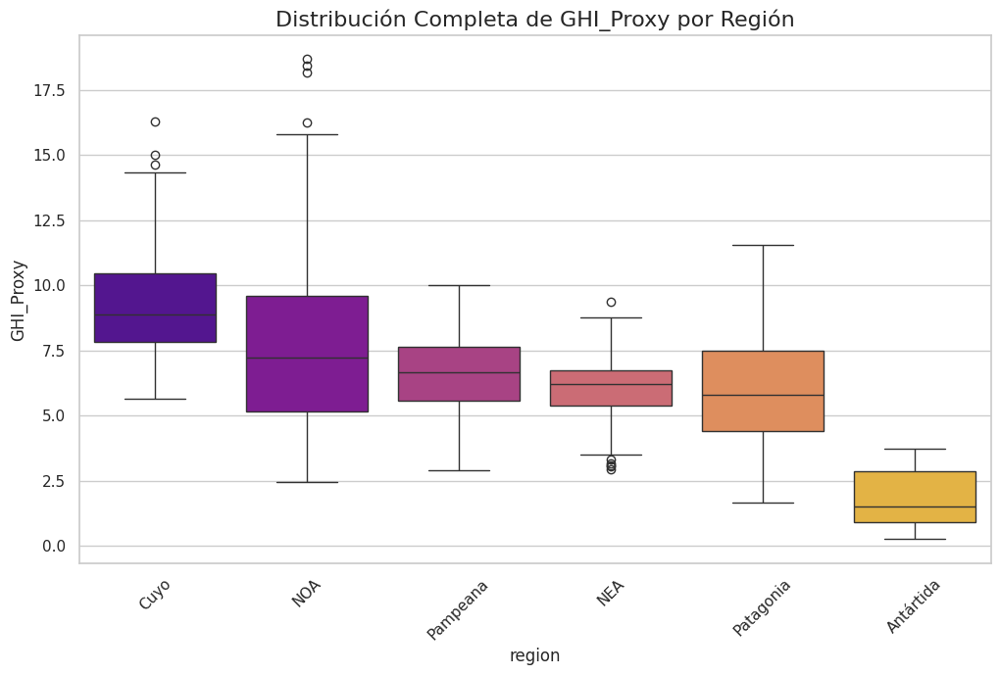



--- 4. Histogramas de GHI_Proxy para Cada Región ---


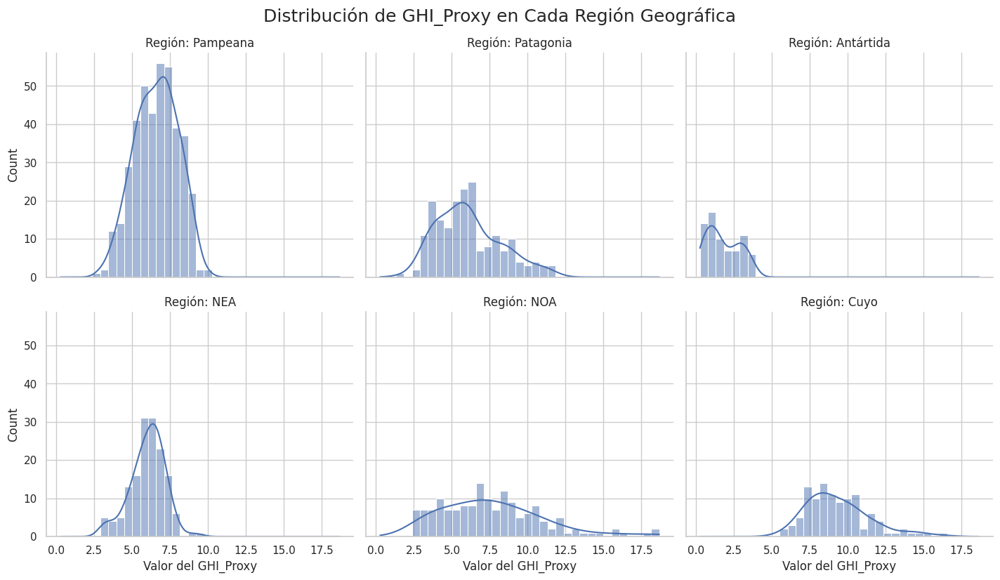

In [37]:
def iqr(x):
    return x.quantile(0.75) - x.quantile(0.25)

sns.set_style("whitegrid")
plt.rcParams['figure.figsize'] = (14, 7)

# --- ANÁLISIS 1: VISUALIZACIÓN DE LA DISTRIBUCIÓN CON ESTADÍSTICAS ---
print("--- 1. Distribución General de GHI_Proxy ---")

# Calculamos las estadísticas
ghi_mean = df_wide['GHI_Proxy'].mean()
ghi_median = df_wide['GHI_Proxy'].median()
ghi_mode = df_wide['GHI_Proxy'].mode()[0]
ghi_iqr = iqr(df_wide['GHI_Proxy'])

# Creamos la figura y los ejes
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
fig.suptitle('Análisis de Distribución de GHI_Proxy', fontsize=16)

# Histograma y Boxplot
sns.histplot(df_wide['GHI_Proxy'], kde=True, bins=30, ax=ax1)
ax1.set_title('Histograma y Densidad (KDE)')
sns.boxplot(y=df_wide['GHI_Proxy'], ax=ax2)
ax2.set_title('Boxplot')

# Añadimos el texto con las estadísticas
stats_text = f'Media: {ghi_mean:.2f} | Mediana: {ghi_median:.2f} | Moda: {ghi_mode:.2f} | IQR: {ghi_iqr:.2f}'
fig.text(0.5, 0.01, stats_text, ha='center', fontsize=12)
plt.show()

# --- ANÁLISIS 2: COMPORTAMIENTO ESTACIONAL (POR MES) ---
print("\n\n--- 2. Análisis Estadístico y Gráfico por Mes ---")
meses_ordenados = ['ene', 'feb', 'mar', 'abr', 'may', 'jun', 'jul', 'ago', 'sep', 'oct', 'nov', 'dic']
df_wide['Mes'] = df_wide['Mes'].astype(CategoricalDtype(categories=meses_ordenados, ordered=True))

plt.figure(figsize=(14, 7))
sns.boxplot(x='Mes', y='GHI_Proxy', data=df_wide)
plt.title('Distribución de GHI_Proxy por Mes', fontsize=16)
plt.show()

# --- ANÁLISIS 3: POTENCIAL SOLAR POR REGIÓN ---
print("\n\n--- 3. Análisis Detallado por Región Geográfica ---")
median_order = df_wide.groupby('region')['GHI_Proxy'].median().sort_values(ascending=False).index

# Boxplot para ver la distribución completa por región
plt.figure(figsize=(12, 7))
sns.boxplot(x='region', y='GHI_Proxy', data=df_wide, order=median_order, palette='plasma')
plt.title('Distribución Completa de GHI_Proxy por Región', fontsize=16)
plt.xticks(rotation=45)
plt.show()

# --- ANÁLISIS 4: HISTOGRAMAS POR REGIÓN ---
print("\n\n--- 4. Histogramas de GHI_Proxy para Cada Región ---")

g = sns.displot(
    data=df_wide,
    x="GHI_Proxy",
    col="region",
    col_wrap=3,  
    kde=True,
    height=4,
    aspect=1.2
)
g.fig.suptitle('Distribución de GHI_Proxy en Cada Región Geográfica', y=1.03, fontsize=18)
g.set_titles("Región: {col_name}")
g.set_xlabels("Valor del GHI_Proxy")
plt.show()

Columnas disponibles en el mapa final para GHI_Proxy: Index(['gid', 'entidad', 'fna', 'gna', 'nam', 'in1', 'fdc', 'sag', 'geometry', 'provincia_limpia', 'provincia', 'ghi_media_provincial'], dtype='object')


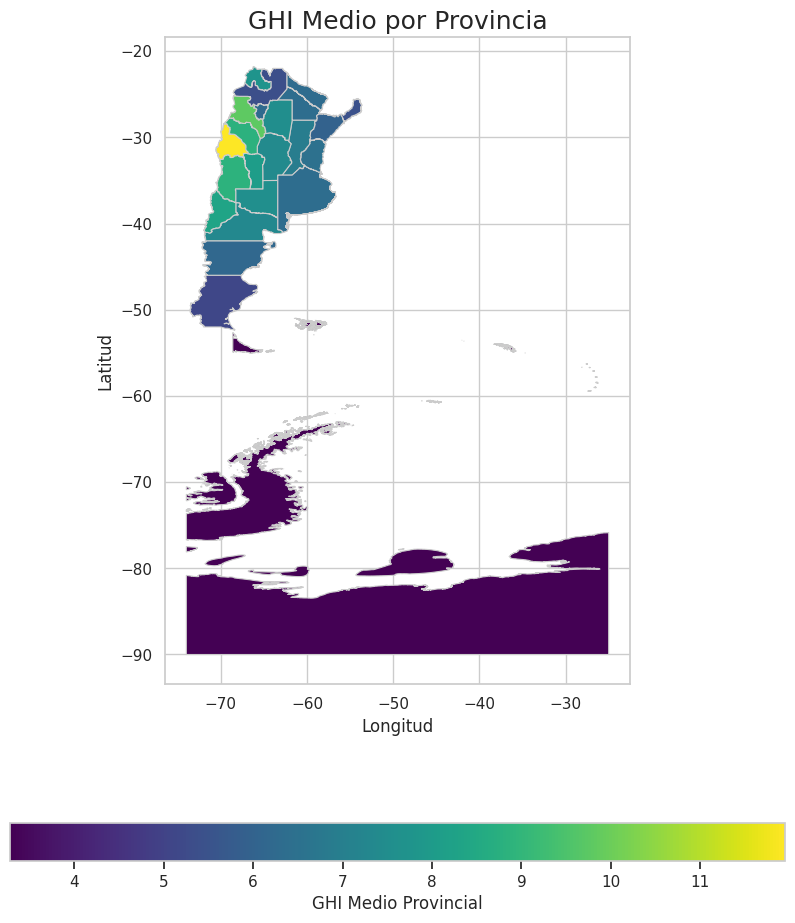

In [38]:
# --- 1. PREPARAR DATOS DE GHI_Proxy POR PROVINCIA ---

# a) Calcular la GHI_Proxy media por provincia
df_ghi_provincia = df_wide.groupby('provincia')['GHI_Proxy'].mean().reset_index()

# b) Renombrar la columna a su nombre final
df_ghi_provincia.rename(columns={'GHI_Proxy': 'ghi_media_provincial'}, inplace=True)

# c) Limpiar los nombres de las provincias para la unión
df_ghi_provincia['provincia_limpia'] = df_ghi_provincia['provincia'].apply(limpiar_texto)

mapa_correcciones = {
    'tierra_del_fueg': 'tierra_del_fuego_antartida_e_islas_del_atlantico_sur',
    'santiago_del_es': 'santiago_del_estero',
    'capital_federal': 'ciudad_autonoma_de_buenos_aires'
}
df_ghi_provincia['provincia_limpia'] = df_ghi_provincia['provincia_limpia'].replace(mapa_correcciones)

# --- 2. PREPARAR DATOS DEL MAPA ---

ruta_mapa_provincias = "datos/provincia/provinciaPolygon.shp"
mapa_provincias = geopandas.read_file(ruta_mapa_provincias)

mapa_provincias['provincia_limpia'] = mapa_provincias['nam'].apply(limpiar_texto)

# --- 3. UNIR LOS DATAFRAMES ---

mapa_final_ghi = pd.merge(
    mapa_provincias,
    df_ghi_provincia,
    on='provincia_limpia',
    how='left'
)

# --- 4. DIBUJAR EL MAPA ---

print("Columnas disponibles en el mapa final para GHI_Proxy:", mapa_final_ghi.columns)

fig, ax = plt.subplots(1, 1, figsize=(10, 12))

mapa_final_ghi.plot(
    column='ghi_media_provincial',
    ax=ax,
    legend=True,
    cmap='viridis', # 'viridis' or 'plasma' are good choices for GHI
    linewidth=0.8,
    edgecolor='0.8',
    missing_kwds={
        "color": "lightgrey",
        "edgecolor": "red",
        "hatch": "///",
        "label": "Sin datos",
    },
    
    legend_kwds={'label': "GHI Medio Provincial", 'orientation': "horizontal"}
)

ax.set_title('GHI Medio por Provincia', fontsize=18)
ax.set_xlabel('Longitud')
ax.set_ylabel('Latitud')
ax.set_aspect('equal')
plt.show()

df_wide.drop(columns=['GHI_Proxy'], inplace=True)
df_wide.to_csv('datos/dataset.csv', index=False)


# Análisis de la distribución de GHI_Proxy - DEPRECADO

## 1. Distribución general de GHI_Proxy

* **Histograma y Densidad (KDE):** La distribución de `GHI_Proxy` muestra una forma unimodal, con una cola ligeramente asimétrica hacia valores altos. La mayor concentración de datos se encuentra alrededor de 5-8.
* **Mediana, Moda e IQR:**
    * **Mediana:** 6.54
    * **Moda:** 5.50
    * **Rango Intercuartílico (IQR):** 2.71 
* **Boxplot:** El boxplot confirma la presencia de algunos valores atípicos en ambos extremos, particularmente en los valores altos, lo cual es esperable para una medida que busca reflejar la irradiancia solar. La caja principal es relativamente compacta, lo que sugiere que la mayoría de los datos se agrupan alrededor de la mediana.

## 2. Distribución de GHI_Proxy por región geográfica

* **Pampeana:** Muestra una distribución concentrada con una alta frecuencia de valores alrededor de 6-8, lo cual indica un potencial solar consistente en esta región.
* **Patagonia:** La distribución es más dispersa y bimodal, con picos alrededor de 5 y 10. Esto podría sugerir variabilidad en las condiciones de nubosidad o la presencia de diferentes patrones climáticos dentro de la región.
* **Antártida:** Presenta valores de `GHI_Proxy` significativamente bajos y una distribución estrecha, lo cual es coherente con las condiciones de baja irradiancia solar en esa región.
* **NEA (Noreste Argentino):** Similar a la Pampeana, con una concentración de valores entre 5 y 8, aunque con una ligera cola hacia valores bajos.
* **NOA (Noroeste Argentino):** Muestra una distribución con una moda alta, lo que podría indicar un mayor potencial solar promedio, aunque también presenta una cola hacia valores bajos.
* **Cuyo:** Esta región exhibe valores de `GHI_Proxy` consistentemente altos y una distribución relativamente estrecha, lo que sugiere un alto potencial solar y menor variabilidad, en línea con su clima árido y mayor cantidad de días despejados.

## 3. Comparación completa de GHI_Proxy por región

* **Regiones con mayor potencial solar (mediana alta):**
    * **Cuyo:** Claramente se destaca con la mediana más alta y un rango intercuartílico elevado, lo que confirma su alto potencial solar.
    * **NOA:** También presenta una mediana alta, aunque con mayor dispersión que Cuyo y presencia de outliers.
* **Regiones con potencial solar moderado:**
    * **Pampeana, NEA, Patagonia:** Estas regiones muestran medianas similares y rangos intercuartílicos que se solapan, lo que indica un potencial solar intermedio y con variaciones según la región.
* **Región con menor potencial solar:**
    * **Antártida:** Confirma los valores muy bajos de `GHI_Proxy`, como se esperaba.
* **Dispersión y Outliers:** Se observa una mayor dispersión (cajas grandes) y presencia de outliers en regiones como Cuyo y NOA, lo que sugiere una mayor variabilidad en los días más o menos soleados.

## 4. Distribución de GHI_Proxy por mes


* **Variación estacional:** Se observa una clara variación estacional en el `GHI_Proxy`. Los meses de **primavera y verano** (octubre, noviembre, diciembre, enero, febrero, marzo) tienden a presentar medianas altas y una mayor dispersión, lo cual es consistente con una mayor irradiancia solar durante estas estaciones en el hemisferio sur.
* **Meses de invierno:** Los meses de **invierno** (mayo, junio, julio) muestran medianas bajas y, en algunos casos, menor dispersión, lo que refleja el menor potencial solar debido a la menor altura del sol y, potencialmente, mayor nubosidad.
* **Meses de transición:** Abril, agosto y septiembre actúan como meses de transición, con medianas que se sitúan entre los valores de invierno y verano.
* **Outliers:** La presencia de outliers en todos los meses indica que, incluso en meses con menor potencial general, pueden existir días con `GHI_Proxy` excepcionalmente altos, y viceversa.

**ATENCION ESTA VARIABLE TARGET YA NO ES CALCULADA SINO OBTENIDA MEDIANTE API**

---
# Parte 2: Proceso de transformacion de datos temporales a datos tabulares

Dada la naturaleza temporal del dataset en su formato actual, habiando secuencialidad en los datos de cada variable de cada estacion por cada mes, es conveniente hacer uso de esto para poder inputar ciertas de las entradas de ciertas columnas con tecnicas de interpolacion, interpolando cada variable con los valores de los meses anteriores y posteriores de cada estacion con datos faltantes. Por otro lado es importante destacar, que en caso de que sea posible inputar sin interpolacion, como casos faltantes de coordenadas geograficas o nombres de provincia, regio, etc. sera inputado con el valor verdadero usando fuentes externas.

In [39]:
# Mapa para cubrir datos faltantes cateogricos y de coordenadas geograficas. Fue conformado a partir de datos externos e investigacion.
corrections_map = {
    'aeroparque_aero': ['CAPITAL FEDERAL', 'GBA', -34.57, -58.42, 6, 87582, 'SABE'],
    'azul_aero': ['BUENOS AIRES', 'PAMPEANA', -36.83, -59.88, 147, 87641, 'SAZA'],
    'bahia_blanca_aero': ['BUENOS AIRES', 'PAMPEANA', -38.72, -62.17, 83, 87750, 'SAZB'],
    'bariloche_aero': ['RIO NEGRO', 'PATAGONICA', -41.15, -71.17, 835, 87765, 'SAZS'],
    'base_belgrano_ii': ['ANTARTIDA', 'ANTARTIDA', -77.87, -34.63, 256, 89034, None],
    'base_carlini_ex_jubany': ['ANTARTIDA', 'ANTARTIDA', -62.23, -58.67, 11, 89053, 'SAYJ'],
    'base_esperanza': ['ANTARTIDA', 'ANTARTIDA', -63.40, -57.00, 24, 89034, 'SAYE'],
    'base_marambio': ['ANTARTIDA', 'ANTARTIDA', -64.23, -56.63, 198, 89033, 'SAWB'],
    'base_orcadas': ['ANTARTIDA', 'ANTARTIDA', -60.73, -44.73, 12, 88963, 'SAYO'],
    'base_san_martin': ['ANTARTIDA', 'ANTARTIDA', -68.13, -67.10, 7, 89066, 'SAYM'],
    'bernardo_de_irigoyen_aero': ['MISIONES', 'NEA', -26.28, -53.67, 815, 87103, 'SATI'],
    'bolivar_aero': ['BUENOS AIRES', 'PAMPEANA', -36.18, -61.07, 94, 87634, 'SAZI'],
    'buenos_aires_observatorio': ['CAPITAL FEDERAL', 'GBA', -34.58, -58.48, 25, 87576, None],
    'catamarca_aero': ['CATAMARCA', 'NOA', -28.60, -65.75, 464, 87217, 'SANC'],
    'ceres_aero': ['SANTA FE', 'PAMPEANA', -29.88, -61.93, 88, 87349, 'SANW'],
    'chamical_aero': ['LA RIOJA', 'NOA', -30.35, -66.30, 461, 87311, 'SACT'],
    'chilecito_aero': ['LA RIOJA', 'NOA', -29.22, -67.45, 947, 87213, 'SANO'],
    'comodoro_rivadavia_aero': ['CHUBUT', 'PATAGONICA', -45.80, -67.47, 46, 87860, 'SAVC'],
    'concordia_aero': ['ENTRE RIOS', 'NEA', -31.30, -58.00, 38, 87480, 'SAAC'],
    'cordoba_aero': ['CORDOBA', 'CENTRO', -31.30, -64.22, 495, 87344, 'SACO'],
    'cordoba_observatorio': ['CORDOBA', 'CENTRO', -31.42, -64.20, 425, 87345, None],
    'coronel_pringles_aero': ['BUENOS AIRES', 'PAMPEANA', -38.00, -61.33, 247, 87751, 'SAZP'],
    'coronel_suarez_aero': ['BUENOS AIRES', 'PAMPEANA', -37.45, -61.88, 233, 87644, 'SAZC'],
    'corrientes_aero': ['CORRIENTES', 'NEA', -27.45, -58.77, 62, 87166, 'SARC'],
    'dolores_aero': ['BUENOS AIRES', 'PAMPEANA', -36.32, -57.72, 9, 87679, 'SAZD'],
    'el_bolson_aero': ['RIO NEGRO', 'PATAGONICA', -41.95, -71.53, 337, 87774, 'SAVB'],
    'el_calafate_aero': ['SANTA CRUZ', 'PATAGONICA', -50.28, -72.08, 204, 87896, 'SAWC'],
    'el_palomar_aero': ['BUENOS AIRES', 'GBA', -34.60, -58.62, 12, 87572, 'SADP'],
    'el_trebol': ['SANTA FE', 'PAMPEANA', -32.20, -61.72, 96, 87447, None],
    'esquel_aero': ['CHUBUT', 'PATAGONICA', -42.90, -71.15, 797, 87803, 'SAVE'],
    'ezeiza_aero': ['BUENOS AIRES', 'GBA', -34.82, -58.55, 20, 87571, 'SAEZ'],
    'formosa_aero': ['FORMOSA', 'NEA', -26.22, -58.22, 60, 87162, 'SARF'],
    'general_pico_aero': ['LA PAMPA', 'PAMPEANA', -35.68, -63.77, 145, 87623, 'SAZG'],
    'gobernador_gregores_aero': ['SANTA CRUZ', 'PATAGONICA', -48.78, -70.17, 358, 87880, 'SAWR'],
    'gualeguaychu_aero': ['ENTRE RIOS', 'NEA', -33.17, -58.62, 23, 87580, 'SAAG'],
    'iguazu_aero': ['MISIONES', 'NEA', -25.73, -54.48, 270, 87097, 'SARI'],
    'jachal': ['SAN JUAN', 'CUYANA', -30.23, -68.73, 1175, 87314, None],
    'jujuy_aero': ['JUJUY', 'NOA', -24.38, -65.10, 907, 87046, 'SASJ'],
    'jujuy_u_n': ['JUJUY', 'NOA', -24.18, -65.33, 1302, 87047, None],
    'junin_aero': ['BUENOS AIRES', 'PAMPEANA', -34.55, -60.93, 81, 87544, 'SAAJ'],
    'la_plata_aero': ['BUENOS AIRES', 'GBA', -34.97, -57.90, 23, 87593, 'SADL'],
    'la_quiaca_observatorio': ['JUJUY', 'NOA', -22.10, -65.60, 3459, 87007, 'SASQ'],
    'la_rioja_aero': ['LA RIOJA', 'NOA', -29.38, -66.80, 429, 87211, 'SANL'],
    'laboulaye_aero': ['CORDOBA', 'CENTRO', -34.13, -63.37, 137, 87534, 'SAOL'],
    'las_flores': ['BUENOS AIRES', 'PAMPEANA', -36.03, -59.13, 36, 87640, None],
    'las_lomitas': ['FORMOSA', 'NEA', -24.70, -60.60, 130, 87078, None],
    'malargue_aero': ['MENDOZA', 'CUYANA', -35.48, -69.58, 1425, 87506, 'SAMM'],
    'maquinchao': ['RIO NEGRO', 'PATAGONICA', -41.25, -68.70, 888, 87770, None],
    'mar_del_plata_aero': ['BUENOS AIRES', 'PAMPEANA', -37.93, -57.58, 21, 87692, 'SAZM'],
    'marcos_juarez_aero': ['CORDOBA', 'CENTRO', -32.68, -62.15, 114, 87448, 'SAOM'],
    'mendoza_aero': ['MENDOZA', 'CUYANA', -32.85, -68.80, 704, 87418, 'SAME'],
    'mendoza_observatorio': ['MENDOZA', 'CUYANA', -32.89, -68.87, 827, 87420, None],
    'monte_caseros_aero': ['CORRIENTES', 'NEA', -30.27, -57.63, 54, 87393, 'SARM'],
    'neuquen_aero': ['NEUQUEN', 'PATAGONICA', -38.95, -68.13, 271, 87715, 'SAZN'],
    'nueve_de_julio': ['BUENOS AIRES', 'PAMPEANA', -35.43, -60.88, 76, 87642, None],
    'obera': ['MISIONES', 'NEA', -27.48, -55.13, 303, 87178, None],
    'olavarria_aero': ['BUENOS AIRES', 'PAMPEANA', -36.88, -60.22, 166, 87645, 'SAZF'],
    'oran_aero': ['SALTA', 'NOA', -23.15, -64.33, 357, 87042, 'SASO'],
    'parana_aero': ['ENTRE RIOS', 'NEA', -31.78, -60.48, 78, 87481, 'SAAP'],
    'paso_de_los_libres_aero': ['CORRIENTES', 'NEA', -29.68, -57.15, 70, 87289, 'SARL'],
    'pehuajo_aero': ['BUENOS AIRES', 'PAMPEANA', -35.83, -61.87, 87, 87632, 'SAZP'],
    'perito_moreno_aero': ['SANTA CRUZ', 'PATAGONICA', -46.53, -70.98, 429, 87834, 'SAWP'],
    'pigue_aero': ['BUENOS AIRES', 'PAMPEANA', -37.60, -62.38, 304, 87752, 'SAZE'],
    'pilar_observatorio': ['CORDOBA', 'CENTRO', -31.67, -63.88, 338, 87347, None],
    'posadas_aero': ['MISIONES', 'NEA', -27.38, -55.97, 125, 87173, 'SARP'],
    'presidencia_roque_saenz_pena_aero': ['CHACO', 'NEA', -26.75, -60.48, 93, 87155, 'SARS'],
    'puerto_deseado_aero': ['SANTA CRUZ', 'PATAGONICA', -47.73, -65.90, 80, 87870, 'SAWD'],
    'punta_indio_ba': ['BUENOS AIRES', 'PAMPEANA', -35.35, -57.30, 22, 87600, 'SAPI'],
    'reconquista_aero': ['SANTA FE', 'PAMPEANA', -29.20, -59.70, 53, 87270, 'SATR'],
    'resistencia_aero': ['CHACO', 'NEA', -27.43, -59.05, 52, 87163, 'SARE'],
    'rio_cuarto_aero': ['CORDOBA', 'CENTRO', -33.10, -64.28, 421, 87444, 'SAOC'],
    'rio_gallegos_aero': ['SANTA CRUZ', 'PATAGONICA', -51.62, -69.30, 19, 87925, 'SAWG'],
    'rio_grande_ba': ['TIERRA DEL FUEGO', 'PATAGONICA', -53.78, -67.77, 22, 87934, 'SAWE'],
    'rosario_aero': ['SANTA FE', 'PAMPEANA', -32.90, -60.78, 25, 87486, 'SAAR'],
    'salta_aero': ['SALTA', 'NOA', -24.85, -65.48, 1221, 87121, 'SASA'],
    'san_antonio_oeste_aero': ['RIO NEGRO', 'PATAGONICA', -40.75, -65.33, 20, 87784, 'SAVN'],
    'san_fernando_aero': ['BUENOS AIRES', 'GBA', -34.45, -58.58, 5, 87580, 'SADF'],
    'san_juan_aero': ['SAN JUAN', 'CUYANA', -31.57, -68.42, 598, 87405, 'SANU'],
    'san_julian_aero': ['SANTA CRUZ', 'PATAGONICA', -49.30, -67.80, 62, 87892, 'SAWJ'],
    'san_luis_aero': ['SAN LUIS', 'CUYANA', -33.27, -66.35, 713, 87528, 'SAOU'],
    'san_martin_mza': ['MENDOZA', 'CUYANA', -33.07, -68.47, 653, 87412, 'SAMI'],
    'san_miguel': ['BUENOS AIRES', 'GBA', -34.54, -58.71, 28, 87570, None],
    'san_rafael_aero': ['MENDOZA', 'CUYANA', -34.58, -68.40, 748, 87503, 'SAMR'],
    'santa_rosa_aero': ['LA PAMPA', 'PAMPEANA', -36.60, -64.28, 191, 87625, 'SAZR'],
    'santiago_del_estero_aero': ['SANTIAGO DEL ESTERO', 'NOA', -27.75, -64.30, 199, 87222, 'SANE'],
    'sauce_viejo_aero': ['SANTA FE', 'PAMPEANA', -31.70, -60.80, 18, 87470, 'SAAV'],
    'tandil_aero': ['BUENOS AIRES', 'PAMPEANA', -37.23, -59.23, 175, 87648, 'SAZT'],
    'tartagal_aero': ['SALTA', 'NOA', -22.62, -63.80, 450, 87034, 'SAST'],
    'tinogasta': ['CATAMARCA', 'NOA', -28.07, -67.57, 1201, 87203, None],
    'trelew_aero': ['CHUBUT', 'PATAGONICA', -43.22, -65.28, 43, 87828, 'SAVT'],
    'tres_arroyos': ['BUENOS AIRES', 'PAMPEANA', -38.37, -60.28, 115, 87754, 'SAZH'],
    'tucuman_aero': ['TUCUMAN', 'NOA', -26.83, -65.12, 450, 87129, 'SANT'],
    'ushuaia_aero': ['TIERRA DEL FUEGO', 'PATAGONICA', -54.83, -68.30, 57, 87938, 'SAWH'],
    'venado_tuerto_aero': ['SANTA FE', 'PAMPEANA', -33.68, -61.97, 112, 87535, 'SAZV'],
    'viedma_aero': ['RIO NEGRO', 'PATAGONICA', -40.87, -63.00, 7, 87791, 'SAVV'],
    'villa_de_maria_del_rio_seco': ['CORDOBA', 'CENTRO', -29.90, -63.73, 341, 87332, None],
    'villa_dolores_aero': ['CORDOBA', 'CENTRO', -31.95, -65.15, 566, 87425, 'SAOD'],
    'villa_reynolds_aero': ['SAN LUIS', 'CUYANA', -33.72, -65.37, 486, 87536, 'SAOR']
}

**Importante**: Se ira guardando en cada estapa el .csv correspondiente ya que ciertas etapas requieren mucho tiempo de procesamiento

### Imputación del dataset en formato largo - 1

In [87]:
#Prime criterio de imputación: primero se imputará para completar valores faltantes en las series de tiempo. Esto se hará para corregir sesgos en la medias posteriormente calculadas
# Lectura de dataset
df = pd.read_csv('datos/dataset.csv')
df.rename(columns={'Estación': 'estacion', 'Mes': 'mes', 'temperatura_c': 'temperatura'}, inplace=True)

# 1. PREPARACIÓN DE DATOS
df['mes'] = pd.Categorical(df['mes'], categories=['ene', 'feb', 'mar', 'abr', 'may', 'jun', 'jul', 'ago', 'sep', 'oct', 'nov', 'dic'], ordered=True)
df['mes'] = df['mes'].cat.codes + 1
df['mes'] = df['mes'].astype(int)

print("-" * 50)
missing_before = df.isnull().sum()
missing_before = missing_before[missing_before > 0]
print("Cantidad de valores faltantes por columna (ANTES):")
print(missing_before)
print("-" * 50)

# Dropear columna con exceso de nulos
COLUMN_TO_DROP = 'velocidad_viento_kmh'
if COLUMN_TO_DROP in df.columns:
    print(f"Eliminando la columna '{COLUMN_TO_DROP}'.")
    df.drop(columns=[COLUMN_TO_DROP], inplace=True)

# 2. ORDENAR LOS DATOS
# Se debe ordenar por estación y luego por mes para que la secuencia temporal sea correcta.
df.sort_values(by=['estacion', 'mes'], inplace=True)

# 3. IMPUTACIÓN POR INTERPOLACIÓN AGRUPADA
print("Iniciando imputación por interpolación agrupada por estación...")
cols_to_impute = df.select_dtypes(include=np.number).columns.drop(['mes', 'nro'], errors='ignore')

# Se agrupa por estación y luego aplicar la interpolación a cada grupo
df[cols_to_impute] = df.groupby('estacion')[cols_to_impute].transform(
    lambda x: x.interpolate(method='linear', limit_direction='both', axis=0)
)
# - method='linear': Rellena los valores de forma equidistante entre los puntos conocidos.
# - limit_direction='both': Asegura rellenar nulos al principio y al final de la serie (ej. si falta enero o diciembre).
# - axis=0: Interpola a lo largo de las filas (meses).

# 4. VERIFICACIÓN FINAL
print("\n--- ANÁLISIS DESPUÉS DE LA IMPUTACIÓN ---")
missing_after = df.isnull().sum()
missing_after = missing_after[missing_after > 0]

if missing_after.empty:
    print("✅ ¡Éxito! Todos los valores numéricos han sido imputados.")
else:
    print(f"ADVERTENCIA: Aún quedan valores faltantes en columnas no numéricas o estaciones sin datos:")
    print(missing_after)
print("-" * 50)


# Guardar dataset sanitizado e imputado
df.to_csv('datos/dataset_par_cleaned.csv', index=False)

--------------------------------------------------
Cantidad de valores faltantes por columna (ANTES):
frecuencia_dias_precipitacion_gt_1mm    110
humedad_relativa_porcentaje              61
nubosidad_octavos                         5
precipitacion_mm                        110
temperatura                               4
temperatura_maxima_c                     13
temperatura_minima_c                     47
velocidad_viento_kmh                    463
provincia                                36
region                                   36
latitud                                  36
longitud                                 36
altura                                   36
oaci                                     48
nro                                      36
dtype: int64
--------------------------------------------------
Eliminando la columna 'velocidad_viento_kmh'.
Iniciando imputación por interpolación agrupada por estación...

--- ANÁLISIS DESPUÉS DE LA IMPUTACIÓN ---
ADVERTENCIA: Aún qued

In [ ]:
# Imputación de segundo nivel: vecino más cercano. devido a que la interpolación no es suficiente para cubrir todos los nulos, se utilizará el método de vecino más cercano para
# completar los valores que directamente no se pueden interpolar, como por ejemplo las precipitaciones o la humedad relativa, que no tienen datos en todos los meses de todas las estaciones.
# Por lo que se decidio usar los vecinos más cercanos (geograficos) para completar los valores faltantes en las series temporales de las variables seleccionadas.


df = pd.read_csv('datos/dataset_par_cleaned.csv')

vars_con_nulos = [
    'frecuencia_dias_precipitacion_gt_1mm',
    'humedad_relativa_porcentaje',
    'precipitacion_mm',
    'temperatura_maxima_c',
    'temperatura_minima_c'
]

print("--- IMPUTACIÓN DE SEGUNDO NIVEL: VECINO MÁS CERCANO ---")

# --- PROCESO DE IMPUTACIÓN ---
for var in vars_con_nulos:
    if df[var].isnull().sum() == 0:
        print(f"\n✅ Variable '{var}' no tiene nulos. Omitiendo.")
        continue

    print(f"\n🔄 Procesando variable: '{var}'")

    # 1. Identificar estaciones 'donantes' y 'receptoras'
    
    # --- INICIO DE LA CORRECCIÓN ---
    # Un 'donante' debe tener datos de la variable Y coordenadas válidas.
    condicion_donante = df[var].notnull() & df['latitud'].notnull() & df['longitud'].notnull()
    estaciones_con_datos = df[condicion_donante]['estacion'].unique()
    # --- FIN DE LA CORRECIÓN ---
    
    estaciones_sin_datos = df[df[var].isnull()]['estacion'].unique()

    # Si no hay donantes, no se puede continuar para esta variable
    if len(estaciones_con_datos) == 0:
        print(f"⚠️ No se encontraron estaciones donantes con coordenadas válidas para '{var}'. Omitiendo.")
        continue

    # DataFrames de referencia con una sola fila por estación
    df_donantes = df[df['estacion'].isin(estaciones_con_datos)].drop_duplicates(subset='estacion')
    df_receptoras = df[df['estacion'].isin(estaciones_sin_datos)].drop_duplicates(subset='estacion')

    coords_donantes = df_donantes[['latitud', 'longitud']].values
    coords_receptoras = df_receptoras[['latitud', 'longitud']].values

    # 2. Encontrar el vecino más cercano
    nbrs = NearestNeighbors(n_neighbors=1, algorithm='ball_tree').fit(coords_donantes)
    distancias, indices = nbrs.kneighbors(coords_receptoras)

    # 3. Imputar y verificar distancias
    print("\n--- Tabla de Verificación de Distancias ---")
    print(f"{'Estación Receptora':<30} | {'Vecino Donante':<30} | {'Distancia (grados)':<20}")
    print("-" * 85)

    for i, nombre_receptora in enumerate(estaciones_sin_datos):
        indice_donante = indices[i][0]
        nombre_donante = df_donantes.iloc[indice_donante]['estacion']
        distancia = distancias[i][0]

        print(f"{nombre_receptora:<30} | {nombre_donante:<30} | {distancia:<20.4f}")

        serie_donante = df[df['estacion'] == nombre_donante][var].values
        df.loc[df['estacion'] == nombre_receptora, var] = serie_donante

# --- VERIFICACIÓN FINAL ---
print("\n\n--- ANÁLISIS FINAL DESPUÉS DE LA IMPUTACIÓN POR VECINOS ---")
nulos_finales = df[vars_con_nulos].isnull().sum()
nulos_finales = nulos_finales[nulos_finales > 0]

if nulos_finales.empty:
    print("✅ ¡Éxito! Todos los valores de las series temporales han sido imputados.")
else:
    print(f"ADVERTENCIA: Aún quedan valores faltantes:")
    print(nulos_finales)
print("-" * 60)
df.to_csv('datos/dataset_cleaned.csv', index=False)

--- IMPUTACIÓN DE SEGUNDO NIVEL: VECINO MÁS CERCANO ---

🔄 Procesando variable: 'frecuencia_dias_precipitacion_gt_1mm'

--- Tabla de Verificación de Distancias ---
Estación Receptora             | Vecino Donante                 | Distancia (grados)  
-------------------------------------------------------------------------------------
base_belgrano_ii               | ushuaia_aero                   | 40.8057             
base_carlini_ex_jubany         | ushuaia_aero                   | 12.1607             
base_esperanza                 | ushuaia_aero                   | 14.1834             
base_marambio                  | ushuaia_aero                   | 14.9953             
base_orcadas                   | rio_grande_ba                  | 24.0479             
base_san_martin                | ushuaia_aero                   | 13.3374             
perito_moreno_aero             | gobernador_gregores_aero       | 2.3837              
puerto_deseado_aero            | san_julian_aero      

---
### Augmentacion del dataset en formato largo - 2

Archivo de coordenadas encontrado. Cargando puntos desde 'datos/nuevas_coordenadas_augmentacion_dataset.csv'...
Se cargaron 1306 puntos pre-calculados.
Mapa de chequeo guardado como 'graficos/mapa_chequeo_puntos_a_obtener.png'
Se asignó provincia y región a 1304 puntos.


Obteniendo datos en paralelo:  21%|██        | 271/1304 [11:22<54:10,  3.15s/it]  


Error procesando punto (-71.5, -72.0): 502 Server Error: Bad Gateway for url: https://power.larc.nasa.gov/api/temporal/daily/point?parameters=T2M,T2M_MAX,T2M_MIN,RH2M,PRECTOTCORR,CLOUD_AMT_DAY&community=RE&longitude=-72.0&latitude=-71.5&start=20010101&end=20201231&format=JSON


Obteniendo datos en paralelo: 100%|██████████| 1304/1304 [51:45<00:00,  2.38s/it] 




¡PROCESO DE AUMENTACIÓN COMPLETO!
Dataset original tenía 1171 filas.
Se añadieron 15636 filas nuevas.
El dataset final aumentado tiene 16807 filas y se ha guardado como 'datos/dataset_cleaned_aumentado.csv'


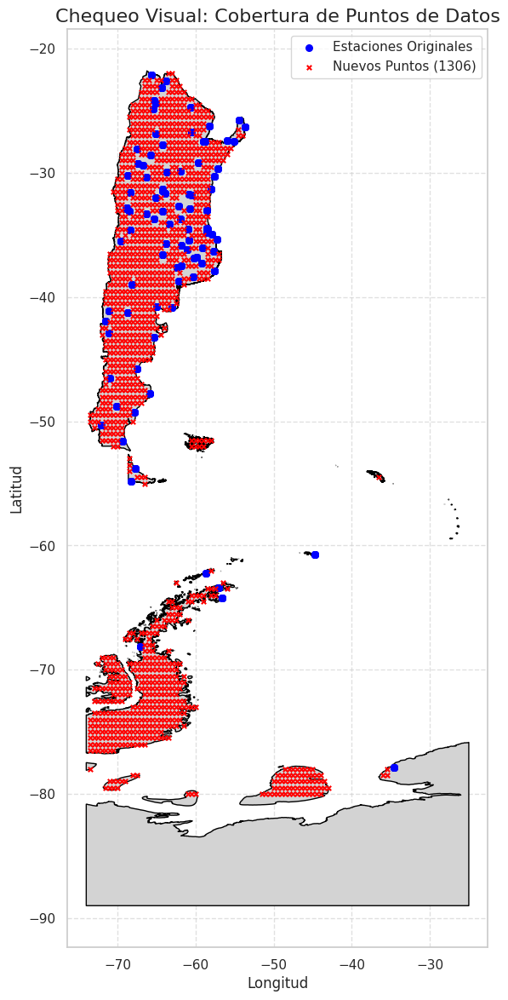

In [ ]:
# Archivo de cache para no recalcular la mascara y nueva grilla de puntos geograficos
coords_cache_file = 'datos/nuevas_coordenadas_augmentacion_dataset.csv'
original_dataset_file = 'datos/dataset_cleaned.csv'
# Archivo de forma de cada provincia en formato .shp
provincias_shapefile = 'datos/provincia/provinciaPolygon.shp'
# Output de nuevo dataset aumentado
output_augmented_file = 'datos/dataset_cleaned_aumentado.csv'
final_points_to_fetch = []

if os.path.exists(coords_cache_file):
    print(f"Archivo de coordenadas encontrado. Cargando puntos desde '{coords_cache_file}'...")
    df_points = pd.read_csv(coords_cache_file)
    final_points_to_fetch = df_points.to_dict('records')
    # Archivo de forma de mapa argentina - contiene el poligono de los limites internaciones 
    argentina_map = geopandas.read_file("datos/pais/paisPolygon.shp")
    df_actual = pd.read_csv(original_dataset_file)
    # Extraigo las coordenas de las estaciones del dataset original lat,long en forma de lista de objectos del tipo Point
    existing_coords = [Point(lon, lat) for lon, lat in zip(df_actual['longitud'], df_actual['latitud'])]
    print(f"Se cargaron {len(final_points_to_fetch)} puntos pre-calculados.")
else:
    print(f"No se encontró el archivo '{coords_cache_file}'. Se procederá a calcular los puntos...")
    try:
        argentina_map = geopandas.read_file("datos/pais/paisPolygon.shp")
        df_actual = pd.read_csv(original_dataset_file)
        existing_coords = [Point(lon, lat) for lon, lat in zip(df_actual['longitud'], df_actual['latitud'])]
        print(f"Shapefile y {len(existing_coords)} estaciones existentes cargados.")
    except Exception as e:
        print(f"Error cargando archivos iniciales: {e}")
        exit()

    # Se define una grilla rectangular que abarca a todo el territorio Argentino
    arg_boundaries = {'lat_range': (-80, -21), 'lon_range': (-74, -35)}
    # Discretizacion de la grilla de puntos geograficos (en grados)
    resolution = 0.25
    # Construccion de la grilla usando iteradores (es un reactangulo basicamente)
    full_grid = list(itertools.product(np.arange(arg_boundaries['lat_range'][0], arg_boundaries['lat_range'][1], resolution),
                                         np.arange(arg_boundaries['lon_range'][0], arg_boundaries['lon_range'][1], resolution)))

    points_within_argentina = []
    # Obtengo el poligonos de coordenadas que conformas las fronteras de Argentina
    argentina_polygon = argentina_map.unary_union
    # Proceso de filtrado, dejo solo las coordenas que se encuentras dentro del poligono y las guardo en una lista de diccionarios
    gdf_points = geopandas.GeoDataFrame(
        [{'latitud': lat, 'longitud': lon} for lat, lon in full_grid],
        geometry=[Point(lon, lat) for lat, lon in full_grid],
        crs="EPSG:4326"
    )
    gdf_arg = geopandas.GeoDataFrame(geometry=[argentina_polygon], crs="EPSG:4326")

    points_within_argentina = geopandas.sjoin(gdf_points, gdf_arg, how="inner")
    points_within_argentina = points_within_argentina.drop(columns='index_right').to_dict('records')


    print(f"Se identificaron {len(points_within_argentina)} puntos dentro del contorno.")

    # Valor para poder filtar las nuevas coordenas que podrian solaparse con las estaciones del dataset original, valores a modificar para tener mas o menos resolucion
    distance_threshold = 0.5 
    for point_info in tqdm(points_within_argentina, desc="Excluyendo zonas ya cubiertas"):
        new_point = Point(point_info['longitud'], point_info['latitud'])
        if not any(new_point.distance(ep) * 111 < distance_threshold * 111 for ep in existing_coords):
            final_points_to_fetch.append(point_info)
    
    print(f"Cálculo finalizado. Se determinaron {len(final_points_to_fetch)} nuevos puntos.")
    
    # Se guardan los nuevos puntos geograficos en archivo cache para cargar desde alli si es necesario
    if final_points_to_fetch:
        df_to_save = pd.DataFrame(final_points_to_fetch)
        df_to_save.to_csv(coords_cache_file, index=False)
        print(f"Los nuevos puntos se han guardado en '{coords_cache_file}' para uso futuro.")

if not final_points_to_fetch:
    print("No hay puntos para procesar. Terminando el script.")
    exit()

# Sanity check: Visualizacion grafica de los nuevos puntos a incoporar    
if final_points_to_fetch:
    
    df_nuevos_check = pd.DataFrame(final_points_to_fetch)
    
    fig, ax = plt.subplots(1, 1, figsize=(10, 14))

    argentina_map.plot(ax=ax, color='lightgray', edgecolor='black')

    # Se carga los puntos ya existentes haciendo uso de la libreria de geopandas, como cirulos rellenos azules
    gdf_original = geopandas.GeoDataFrame(geometry=existing_coords, crs="EPSG:4326")
    gdf_original.plot(ax=ax, marker='o', color='blue', markersize=30, label='Estaciones Originales')

    # Se grafican los nuevos puntos obtenidos con cruces rojas
    geometry_nuevos = [Point(xy) for xy in zip(df_nuevos_check['longitud'], df_nuevos_check['latitud'])]
    gdf_nuevos = geopandas.GeoDataFrame(df_nuevos_check, geometry=geometry_nuevos, crs="EPSG:4326")
    gdf_nuevos.plot(ax=ax, marker='x', color='red', markersize=15, label=f'Nuevos Puntos ({len(final_points_to_fetch)})')
    
    plt.title('Chequeo Visual: Cobertura de Puntos de Datos', fontsize=16)
    plt.xlabel('Longitud')
    plt.ylabel('Latitud')
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.legend()
    
    check_map_filename = 'graficos/mapa_chequeo_puntos_a_obtener.png'
    plt.savefig(check_map_filename, dpi=150, bbox_inches='tight')
    print(f"Mapa de chequeo guardado como '{check_map_filename}'")
    
else:
    print("No hay nuevos puntos para visualizar.")

# Inputacion de datos geograficos de cada nuevo punto a incorporar, tales como Provincia, Region, etc.
try:
    provincias_map = geopandas.read_file(provincias_shapefile)
    # Mapa auxiliar para mapear provincia a region
    mapa_regiones = {
        'JUJUY': 'NOA', 'SALTA': 'NOA', 'TUCUMÁN': 'NOA', 'SANTIAGO DEL ESTERO': 'NOA',
        'CATAMARCA': 'NOA', 'LA RIOJA': 'NOA', 'FORMOSA': 'NEA', 'MISIONES': 'NEA',
        'CHACO': 'NEA', 'CORRIENTES': 'NEA', 'ENTRE RÍOS': 'NEA', 'SAN JUAN': 'Cuyo',
        'MENDOZA': 'Cuyo', 'SAN LUIS': 'Cuyo', 'CÓRDOBA': 'Pampeana', 'SANTA FE': 'Pampeana',
        'LA PAMPA': 'Pampeana', 'BUENOS AIRES': 'Pampeana', 
        'CIUDAD AUTÓNOMA DE BUENOS AIRES': 'Pampeana', 'NEUQUÉN': 'Patagonia', 
        'RÍO NEGRO': 'Patagonia', 'CHUBUT': 'Patagonia', 'SANTA CRUZ': 'Patagonia', 
        'TIERRA DEL FUEGO, ANTÁRTIDA E ISLAS DEL ATLÁNTICO SUR': 'Patagonia'
    }
    
    # Se genera la columna region mapeando de provincia a region para cada punto
    provincias_map['region'] = provincias_map['nam'].str.upper().map(mapa_regiones).fillna('Indeterminada')
    
    gdf_nuevos = geopandas.GeoDataFrame(
        pd.DataFrame(final_points_to_fetch),
        geometry=[Point(p['longitud'], p['latitud']) for p in final_points_to_fetch],
        crs="EPSG:4326"
    )
    # Se unifica el dataframe con solo las coordenadas geograficas y el dataset con las provincias y regiones, haciendo un Join Inner (como en SQL) - geometry en comun se le agrean las otras dos columnas
    puntos_con_provincia = geopandas.sjoin(gdf_nuevos, provincias_map[['nam', 'region', 'geometry']], how="inner")
    # normalizacion de los nombres de columnas
    final_points_to_fetch = puntos_con_provincia[['latitud', 'longitud', 'nam', 'region']].rename(columns={'nam': 'provincia'}).to_dict('records')
    print(f"Se asignó provincia y región a {len(final_points_to_fetch)} puntos.")
except Exception as e:
    print(f"Error en el procesamiento geoespacial: {e}")
    exit()

# Mapa con los parametros investigados para cada variable faltante asociada a cada coordenada. Se puede ver en: https://power.larc.nasa.gov/parameters/
# T2M: Temperatura a 2 m sobre la tierra
# T2M_MAX: Temperatura maxima
# T2M_MIN: Temperatura minima 
# RH2M: Humedad relativa en porcentaje
# PRECTOTCORR: Precipitaciones en mm 
# CLOUD_AMT_DAY: Nubosidad en portentaje de cielo cubierto -> Lo pasamos a octabos
parameters_to_get = {
    'temperatura': 'T2M',
    'temperatura_maxima_c': 'T2M_MAX',
    'temperatura_minima_c': 'T2M_MIN',
    'humedad_relativa_porcentaje': 'RH2M',
    'precipitacion_mm': 'PRECTOTCORR',
    'nubosidad_porcentaje': 'CLOUD_AMT_DAY'
}

def fetch_point_data(point, station_counter):
    lat = point['latitud']
    lon = point['longitud']
    api_url = (
        f"https://power.larc.nasa.gov/api/temporal/daily/point?parameters={','.join(parameters_to_get.values())}"
        f"&community=RE&longitude={lon}&latitude={lat}&start=20010101&end=20201231&format=JSON"
    )
    try:
        response = requests.get(api_url, timeout=60)
        response.raise_for_status()
        data = response.json()

        monthly_results = {}
        for var_name, param_code in parameters_to_get.items():
            param_data = data['properties']['parameter'][param_code]
            df_var = pd.DataFrame.from_dict(param_data, orient='index', columns=[var_name])
            df_var.index = pd.to_datetime(df_var.index, format='%Y%m%d')
            df_var.replace(-999, np.nan, inplace=True)
            monthly_results[var_name] = df_var.groupby(df_var.index.month)[var_name].mean()

        precip_data = data['properties']['parameter']['PRECTOTCORR']
        df_precip = pd.DataFrame.from_dict(precip_data, orient='index', columns=['precipitacion'])
        df_precip.index = pd.to_datetime(df_precip.index, format='%Y%m%d')
        df_precip.replace(-999, np.nan, inplace=True)
        df_precip['dia_lluvioso'] = (df_precip['precipitacion'] > 1).astype(int)
        counts_per_month_year = df_precip.groupby([df_precip.index.year, df_precip.index.month])['dia_lluvioso'].sum()
        avg_frequency_per_month = counts_per_month_year.groupby(level=1).mean()
        monthly_results['frecuencia_dias_precipitacion_gt_1mm'] = avg_frequency_per_month

        rows = []
        for month in range(1, 13):
            nubosidad_pct = monthly_results['nubosidad_porcentaje'].get(month)
            nubosidad_octavos = (nubosidad_pct / 100) * 8 if pd.notna(nubosidad_pct) else np.nan

            rows.append({
                'estacion': f'estacion_virtual_{station_counter}',
                'provincia': point['provincia'],
                'region': point['region'],
                'oaci': 'VIRTUAL',
                'mes': float(month),
                'latitud': lat,
                'longitud': lon,
                'altura': np.nan,
                'nro': np.nan,
                'frecuencia_dias_precipitacion_gt_1mm': monthly_results['frecuencia_dias_precipitacion_gt_1mm'].get(month),
                'humedad_relativa_porcentaje': monthly_results['humedad_relativa_porcentaje'].get(month),
                'nubosidad_octavos': nubosidad_octavos,
                'precipitacion_mm': monthly_results['precipitacion_mm'].get(month) * 30.4,
                'temperatura': monthly_results['temperatura'].get(month),
                'temperatura_maxima_c': monthly_results['temperatura_maxima_c'].get(month),
                'temperatura_minima_c': monthly_results['temperatura_minima_c'].get(month)
            })
        return rows

    except Exception as e:
        print(f"\nError procesando punto ({lat}, {lon}): {e}")
        return []

all_new_data = []
max_workers = 4
station_counter = 0

with ThreadPoolExecutor(max_workers=max_workers) as executor:
    futures = {executor.submit(fetch_point_data, point, idx): idx for idx, point in enumerate(final_points_to_fetch)}
    for future in tqdm(as_completed(futures), total=len(futures), desc="Obteniendo datos en paralelo"):
        result = future.result()
        if result:
            all_new_data.extend(result)

# Crear el DataFrame con los nuevos datos
df_nuevos_datos = pd.DataFrame(all_new_data)

# Cargar el dataset original y unirlo
df_original = pd.read_csv(original_dataset_file)
df_aumentado = pd.concat([df_original, df_nuevos_datos], ignore_index=True)

# Guardar el resultado final
df_aumentado.to_csv(output_augmented_file, index=False, float_format='%.4f')

print(f"\n\n¡PROCESO DE AUMENTACIÓN COMPLETO!")
print(f"Dataset original tenía {len(df_original)} filas.")
print(f"Se añadieron {len(df_nuevos_datos)} filas nuevas.")
print(f"El dataset final aumentado tiene {len(df_aumentado)} filas y se ha guardado como '{output_augmented_file}'")

### OpenMeteo: Incorporacion de la elevacion - 2.1

In [ ]:
#https://opentopomap.org/#marker=6/-31.447/-64.182




dataset_file = 'datos/dataset_cleaned_aumentado.csv'

# Cargar dataset
try:
    df = pd.read_csv(dataset_file)
    print(f"Dataset '{dataset_file}' cargado. Total de filas: {len(df)}")
except FileNotFoundError:
    print(f"Error: No se encontró el archivo '{dataset_file}'.")
    exit()

# Filtrar coordenadas sin altura
rows_with_null_altitude = df[df['altura'].isnull()]
unique_coords_to_fetch = rows_with_null_altitude[['latitud', 'longitud']].drop_duplicates().to_dict('records')

if not unique_coords_to_fetch:
    print("No hay valores de altura para completar. El dataset ya está completo.")
    exit()

print(f"Se han identificado {len(unique_coords_to_fetch)} coordenadas únicas sin datos de altura.")

# Función para obtener altura de un punto
def fetch_elevation(point):
    lat = point['latitud']
    lon = point['longitud']
    api_url = f"https://api.open-meteo.com/v1/elevation?latitude={lat}&longitude={lon}"
    
    try:
        response = requests.get(api_url, timeout=30)
        response.raise_for_status()
        data = response.json()
        elevation = data['elevation'][0]
        return (lat, lon), elevation
    except requests.exceptions.RequestException as e:
        print(f"\nError obteniendo altura para ({lat}, {lon}): {e}")
    except (KeyError, IndexError):
        print(f"\nRespuesta inesperada de la API para ({lat}, {lon})")
    return None

# Usar todos los CPUs disponibles
max_workers = 2
elevation_map = {}

# Ejecutar en paralelo
with ThreadPoolExecutor(max_workers=max_workers) as executor:
    futures = {executor.submit(fetch_elevation, point): point for point in unique_coords_to_fetch}
    for future in tqdm(as_completed(futures), total=len(futures), desc="Obteniendo altura en paralelo"):
        result = future.result()
        if result:
            coord, elevation = result
            elevation_map[coord] = elevation

print(f"Se obtuvo la altura para {len(elevation_map)} coordenadas.")

# Actualizar dataset si se obtuvieron resultados
if elevation_map:
    print("Rellenando los valores de altura faltantes en el dataset...")
    coord_tuples = list(zip(df['latitud'], df['longitud']))
    fill_values = pd.Series(coord_tuples, index=df.index).map(elevation_map)
    df['altura'].fillna(fill_values, inplace=True)
    df.to_csv(dataset_file, index=False, float_format='%.4f')

    print("\n¡Proceso completado!")
    print(f"La columna 'altura' ha sido actualizada y el archivo '{dataset_file}' ha sido guardado.")
    print(f"Número de valores de altura nulos restantes: {df['altura'].isnull().sum()}")
else:
    print("\nNo se pudo obtener ningún dato de altura. El archivo no ha sido modificado.")


Dataset 'datos/dataset_cleaned_aumentado.csv' cargado. Total de filas: 16807
Se han identificado 1304 coordenadas únicas sin datos de altura.


Obteniendo altura en paralelo:   0%|          | 1/1304 [00:01<26:42,  1.23s/it]


Error obteniendo altura para (nan, nan): 400 Client Error: Bad Request for url: https://api.open-meteo.com/v1/elevation?latitude=nan&longitude=nan


Obteniendo altura en paralelo:  26%|██▌       | 334/1304 [03:29<15:08,  1.07it/s]


Error obteniendo altura para (-70.5, -69.5): HTTPSConnectionPool(host='api.open-meteo.com', port=443): Read timed out. (read timeout=30)


Obteniendo altura en paralelo:  44%|████▍     | 576/1304 [06:22<1:43:31,  8.53s/it]


Error obteniendo altura para (-44.5, -66.5): HTTPSConnectionPool(host='api.open-meteo.com', port=443): Read timed out. (read timeout=30)


Obteniendo altura en paralelo:  44%|████▍     | 580/1304 [06:27<33:40,  2.79s/it]  


Error obteniendo altura para (-44.5, -65.5): HTTPSConnectionPool(host='api.open-meteo.com', port=443): Read timed out. (read timeout=30)


Obteniendo altura en paralelo:  75%|███████▌  | 983/1304 [10:37<05:45,  1.08s/it]


Error obteniendo altura para (-32.5, -65.0): HTTPSConnectionPool(host='api.open-meteo.com', port=443): Read timed out. (read timeout=30)


Obteniendo altura en paralelo:  98%|█████████▊| 1274/1304 [13:53<04:33,  9.12s/it]


Error obteniendo altura para (-24.0, -63.5): HTTPSConnectionPool(host='api.open-meteo.com', port=443): Read timed out. (read timeout=30)


Obteniendo altura en paralelo:  98%|█████████▊| 1276/1304 [13:54<02:14,  4.82s/it]


Error obteniendo altura para (-24.0, -62.5): HTTPSConnectionPool(host='api.open-meteo.com', port=443): Read timed out. (read timeout=30)


Obteniendo altura en paralelo:  99%|█████████▉| 1289/1304 [14:32<02:13,  8.91s/it]


Error obteniendo altura para (-23.5, -61.5): HTTPSConnectionPool(host='api.open-meteo.com', port=443): Read timed out. (read timeout=30)


Obteniendo altura en paralelo:  99%|█████████▉| 1290/1304 [14:33<01:30,  6.44s/it]


Error obteniendo altura para (-23.0, -66.5): HTTPSConnectionPool(host='api.open-meteo.com', port=443): Read timed out. (read timeout=30)


Obteniendo altura en paralelo: 100%|██████████| 1304/1304 [14:41<00:00,  1.48it/s]
/tmp/ipykernel_24060/2047843861.py:67: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['altura'].fillna(fill_values, inplace=True)


Se obtuvo la altura para 1295 coordenadas.
Rellenando los valores de altura faltantes en el dataset...

¡Proceso completado!
La columna 'altura' ha sido actualizada y el archivo 'datos/dataset_cleaned_aumentado.csv' ha sido guardado.
Número de valores de altura nulos restantes: 132


### Imputacion de alturas faltantes por cercania geografica - 2.2

In [94]:
def impute_height_with_knn(input_file, output_file, k=5, lat_col='latitud', lon_col='longitud', alt_col='altura'):
    """
    Imputa valores faltantes de altura en un archivo CSV usando el promedio de los k vecinos más cercanos.

    Args:
        input_file (str): Ruta al archivo CSV de entrada.
        output_file (str): Ruta donde se guardará el archivo CSV con los datos imputados.
        k (int): Número de vecinos a considerar para el promedio.
        lat_col (str): Nombre de la columna de latitud.
        lon_col (str): Nombre de la columna de longitud.
        alt_col (str): Nombre de la columna de altura/altitud.
    """
    try:
        df = pd.read_csv(input_file)
        print(f"Dataset cargado desde '{input_file}'. Total de filas: {len(df)}")
    except FileNotFoundError:
        print(f"❌ Error: El archivo '{input_file}' no fue encontrado.")
        return

    # Separar filas con altura conocida y desconocida
    df_known = df[df[alt_col].notnull()].copy()
    df_missing = df[df[alt_col].isnull()].copy()

    if df_missing.empty:
        print("✅ No hay valores de altura faltantes. No se necesita hacer nada.")
        return

    print(f"⏳ {len(df_missing)} filas con altura faltante. Imputando usando el promedio de {k} vecinos...")

    # Preparar coordenadas y alturas conocidas
    coords_known = df_known[[lat_col, lon_col]].values
    heights_known = df_known[alt_col].values
    coords_missing = df_missing[[lat_col, lon_col]].values

    # Ajustar el modelo NearestNeighbors para encontrar k vecinos
    nbrs = NearestNeighbors(n_neighbors=k, algorithm='ball_tree').fit(coords_known)
    distances, indices = nbrs.kneighbors(coords_missing)

    # Calcular el promedio de las alturas de los k vecinos para cada punto faltante
    imputed_heights = np.mean(heights_known[indices], axis=1)

    # Asignar las alturas imputadas al DataFrame original
    df.loc[df[alt_col].isnull(), alt_col] = imputed_heights

    # Guardar el dataset actualizado en un nuevo archivo
    df.to_csv(output_file, index=False, float_format='%.4f')
    print(f"✔️ ¡Proceso completado! Archivo actualizado guardado en: '{output_file}'")


---
## Transformacion de dataset tipo serie a tabular - 3

In [95]:
# Para transformar el dataset a un dataset tabular, recurrimos a la condensacion de los datos de cada estacion por cada mes a su promedio anual. Es decir pasamos de 12 filas por 
# estacion (orignal o aumentada) a una fila por estacion con los promedios anuales, como asi tambien nacen nuevas columnas para no perder informacion sobre la variabilidad y forma.

dataset_file = 'datos/dataset_cleaned_aumentado.csv'

df_final = pd.read_csv(dataset_file)

variables = [
    'frecuencia_dias_precipitacion_gt_1mm',
    'humedad_relativa_porcentaje',
    'nubosidad_octavos',
    'precipitacion_mm',
    'temperatura',
    'temperatura_maxima_c',
    'temperatura_minima_c',
]

# Se calcula estas estadisticas para cada variable por estacion
df_agregado = df_final.groupby('estacion')[variables].agg(
    ['mean', 'std', 'max', 'min', 'sum']
)

# Se generan las nuevas columnas
df_agregado.columns = ['_'.join(col).strip() for col in df_agregado.columns.values]

# Renombrado
for var in variables:
    # Rename
    df_agregado.rename(columns={
        f'{var}_mean': f'{var}_anual_media',
        f'{var}_std': f'{var}_anual_std',
        f'{var}_max': f'{var}_anual_max',
        f'{var}_min': f'{var}_anual_min',
        f'{var}_sum': f'{var}_anual_total'
    }, inplace=True)


    mean_col = f'{var}_anual_media'
    std_col = f'{var}_anual_std'
    cv_col = f'{var}_anual_cv'
    # Es es cociente enter la desviacion estandar y la media
    df_agregado[cv_col] = np.where(df_agregado[mean_col] != 0, df_agregado[std_col] / df_agregado[mean_col], 0)

    max_col = f'{var}_anual_max'
    min_col = f'{var}_anual_min'
    amplitude_col = f'{var}_anual_amplitud'
    df_agregado[amplitude_col] = df_agregado[max_col] - df_agregado[min_col]
    
info_estaciones = df_final.groupby('estacion').first()[['provincia', 'region', 'oaci', 'latitud', 'longitud', 'altura', 'nro']]

df_agregado = df_agregado.reset_index()

# Se hace el merge final concluyendo en un dataset tabular
df_tabular = pd.merge(info_estaciones, df_agregado, on='estacion', how='left')

cols_info = ['provincia', 'region', 'oaci', 'latitud', 'longitud', 'altura', 'nro']
cols_features = [col for col in df_tabular.columns if col not in cols_info and col != 'estacion']
df_tabular = df_tabular[['estacion'] + cols_info + sorted(cols_features)]

# Se guarda 
df_tabular.to_csv('datos/dataset_cleaned_tabular.csv', index=False)


---
# Ingeniería de Características Astronómicas a partir de Coordenadas Geográficas - 4

In [96]:
df = pd.read_csv('datos/dataset_cleaned_tabular.csv')

# Constante Solar y Radiación Extraterrestre
Gs = 1361.0 # W/m²

# - Solsticio de verano del hemisferio sur (dn ≈ 355, 21 de diciembre)
# - Solsticio de invierno del hemisferio sur (dn ≈ 172, 21 de junio)

dn_verano = 365
dn_invierno = 172

# Calcular la radiación extraterrestre para el solsticio de verano
df['G0_verano_W_m2'] = Gs * (1 + 0.033 * np.cos(2 * np.pi * dn_verano / 365))
# Calcular la radiación extraterrestre para el solsticio de invierno
df['G0_invierno_W_m2'] = Gs * (1 + 0.033 * np.cos(2 * np.pi * dn_invierno / 365))


# --- Ángulo de Declinación (δ) ---
delta_verano_rad = np.deg2rad(23.45 * np.sin(2 * np.pi * (dn_verano + 284) / 365))
delta_invierno_rad = np.deg2rad(23.45 * np.sin(2 * np.pi * (dn_invierno + 284) / 365))


df['declinacion_verano_grados'] = np.rad2deg(delta_verano_rad)
df['declinacion_invierno_grados'] = np.rad2deg(delta_invierno_rad)

latitud_rad = np.deg2rad(df['latitud'])

# Ecuación para el ángulo horario de la puesta de Sol (ωs)
cos_omega_s_verano = -np.tan(delta_verano_rad) * np.tan(latitud_rad)
cos_omega_s_invierno = -np.tan(delta_invierno_rad) * np.tan(latitud_rad)

omega_s_verano_rad = np.arccos(np.clip(cos_omega_s_verano, -1.0, 1.0))
omega_s_invierno_rad = np.arccos(np.clip(cos_omega_s_invierno, -1.0, 1.0))

omega_s_verano_deg = np.rad2deg(omega_s_verano_rad)
omega_s_invierno_deg = np.rad2deg(omega_s_invierno_rad)

df['duracion_dia_verano_horas'] = 2 * omega_s_verano_deg / 15
df['duracion_dia_invierno_horas'] = 2 * omega_s_invierno_deg / 15


# --- Ángulo Cenital Solar (θzs) al mediodía solar ---
# Al mediodía solar, el ángulo horario (ω) es 0, por lo que cos(ω) = 1.
# La ecuación se simplifica a: cos(θzs) = cos(δ)cos(ϕ) + sin(δ)sin(ϕ) = cos(ϕ - δ)
# Por lo tanto, θzs = |ϕ - δ|

df['angulo_cenital_mediodia_verano_grados'] = np.abs(df['latitud'] - np.rad2deg(delta_verano_rad))
df['angulo_cenital_mediodia_invierno_grados'] = np.abs(df['latitud'] - np.rad2deg(delta_invierno_rad))

output_filename = 'datos/dataset_cleaned_tabular_engineered.csv'
df.to_csv(output_filename, index=False, float_format='%.4f')



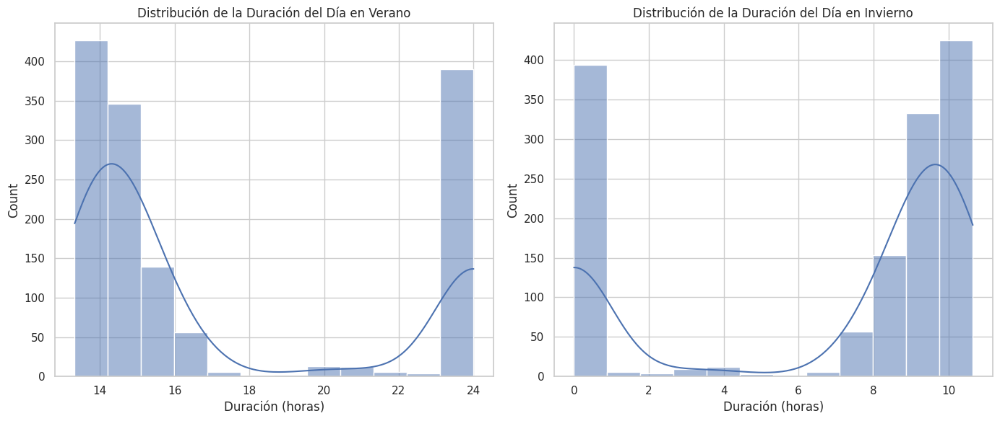

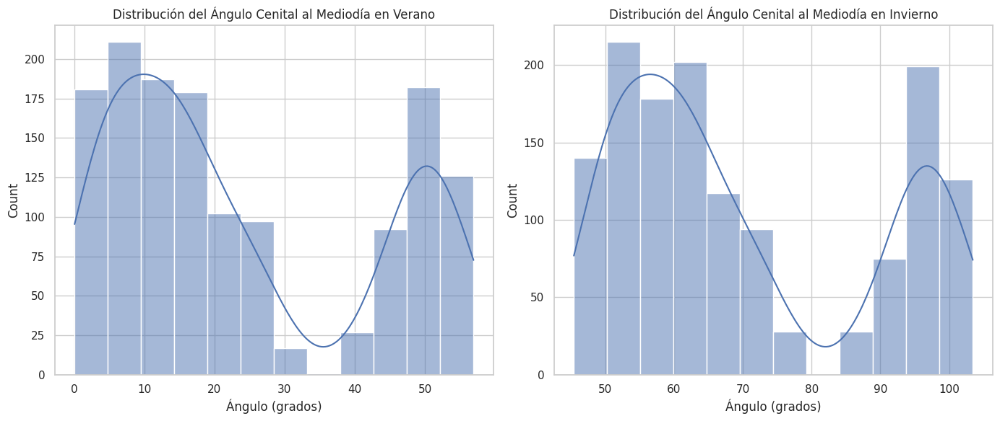

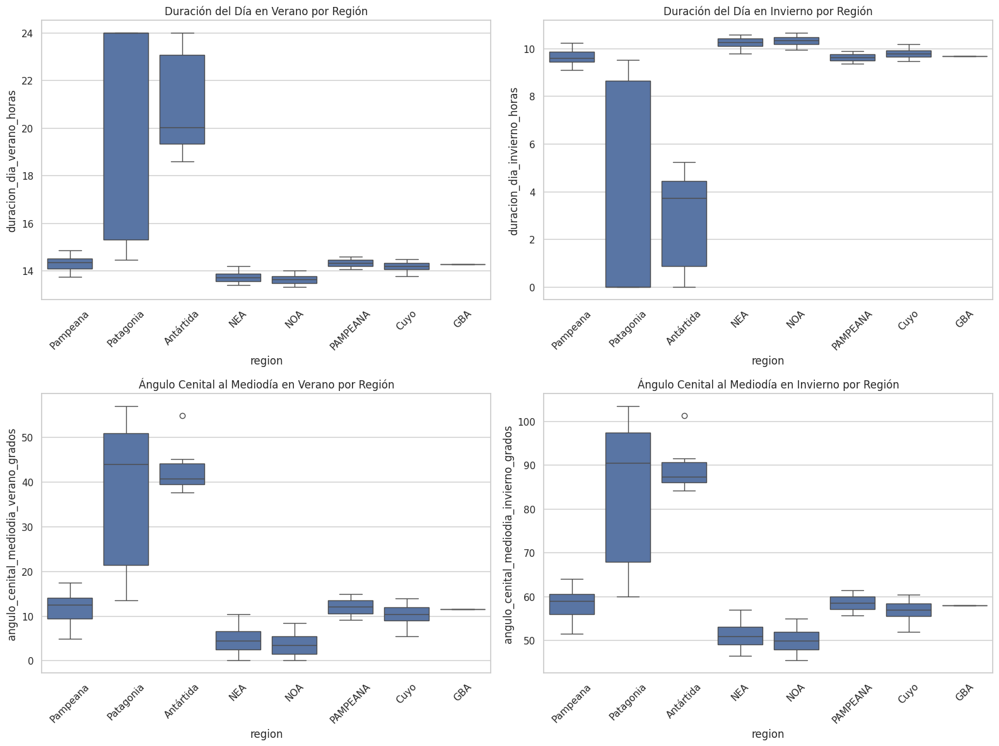

In [ ]:



df = pd.read_csv('datos/dataset_cleaned_tabular_engineered.csv')

# Configuración general de los gráficos
sns.set_theme(style="whitegrid")

# 1. Distribución de la Duración del Día en Verano e Invierno
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.histplot(df['duracion_dia_verano_horas'], kde=True)
plt.title('Distribución de la Duración del Día en Verano')
plt.xlabel('Duración (horas)')

plt.subplot(1, 2, 2)
sns.histplot(df['duracion_dia_invierno_horas'], kde=True)
plt.title('Distribución de la Duración del Día en Invierno')
plt.xlabel('Duración (horas)')

plt.tight_layout()
plt.show()

# 2. Distribución del Ángulo Cenital al Mediodía en Verano e Invierno
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.histplot(df['angulo_cenital_mediodia_verano_grados'], kde=True)
plt.title('Distribución del Ángulo Cenital al Mediodía en Verano')
plt.xlabel('Ángulo (grados)')

plt.subplot(1, 2, 2)
sns.histplot(df['angulo_cenital_mediodia_invierno_grados'], kde=True)
plt.title('Distribución del Ángulo Cenital al Mediodía en Invierno')
plt.xlabel('Ángulo (grados)')

plt.tight_layout()
plt.show()

# 4. Boxplots comparando las variables astronómicas por región
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

sns.boxplot(ax=axes[0, 0], x='region', y='duracion_dia_verano_horas', data=df)
axes[0, 0].set_title('Duración del Día en Verano por Región')
axes[0, 0].tick_params(axis='x', rotation=45)

sns.boxplot(ax=axes[0, 1], x='region', y='duracion_dia_invierno_horas', data=df)
axes[0, 1].set_title('Duración del Día en Invierno por Región')
axes[0, 1].tick_params(axis='x', rotation=45)

sns.boxplot(ax=axes[1, 0], x='region', y='angulo_cenital_mediodia_verano_grados', data=df)
axes[1, 0].set_title('Ángulo Cenital al Mediodía en Verano por Región')
axes[1, 0].tick_params(axis='x', rotation=45)

sns.boxplot(ax=axes[1, 1], x='region', y='angulo_cenital_mediodia_invierno_grados', data=df)
axes[1, 1].set_title('Ángulo Cenital al Mediodía en Invierno por Región')
axes[1, 1].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

Aqui es importante destacar observando los histogramas y diagramas de cajas la gran diversidad de datos que disponemos analizando el territoria Argentino. Esto debido a su gran extension geografica. Lo cual nos aporta un gran valor pudiendo conformar una dataset cuya representacion de la poblacion es representativa en terminos estadisticos. 

### Proceso de incorporacion de una variable target mas precisa y valiosa - 4.1
El proyecto Prediction Of Worldwide Energy Resources (POWER) de la NASA es la solución idónea para este desafío. Ofrece un conjunto de datos de acceso libre y gratuito, con parámetros solares y meteorológicos derivados de observaciones satelitales (como los del proyecto CERES) y modelos de asimilación.8 De manera crucial, POWER proporciona los parámetros exactos necesarios para este análisis: GHI, DNI y DHI, disponibles en series temporales horarias y diarias con una cobertura global que abarca varias décadas.


In [97]:
import pandas as pd
import numpy as np
import requests
from tqdm import tqdm
from concurrent.futures import ThreadPoolExecutor, as_completed

dataset_file = 'datos/dataset_cleaned_tabular_engineered.csv'

try:
    df_stations = pd.read_csv(dataset_file)
except FileNotFoundError:
    print(f"El archivo '{dataset_file}' no fue encontrado.")
    exit()

variables = {
    'ALLSKY_SFC_SW_DWN': 'ghi',
    'ALLSKY_SFC_SW_DIFF': 'dhi',
    'ALLSKY_SFC_SW_DNI': 'dni'
}

''' Esta esta es similar a la etapa de augmentacion del dataset introducida anteriormente. Ahora se consumen las variables:
        - ALLSKY_SFC_SW_DWN: irradiancia horizontal global (GHI, por sus siglas en inglés)
        - ALLSKY_SFC_SW_DIFF: irradiancia horizontal difusa (DHI, por sus siglas en inglés)
        - ALLSKY_SFC_SW_DNI: irradiancia normal directa (DNI, por sus siglas en inglés)
    El target inicialmente se definira como GHI pero, es posible que un futuro se contemple alguna combinacion mas valiosa entre estas variables. Por ejemplo DNI/GHI.
'''

# Función para procesar una estación y una variable
def fetch_monthly_average(station_row, nasa_variable, target_variable):
    lat = station_row['latitud']
    lon = station_row['longitud']
    station_name = station_row['estacion']

    api_url = (
        f"https://power.larc.nasa.gov/api/temporal/monthly/point"
        f"?parameters={nasa_variable}&community=SB&longitude={lon}"
        f"&latitude={lat}&start=1991&end=2020&format=JSON"
    )

    try:
        response = requests.get(api_url, timeout=30)
        response.raise_for_status()
        data = response.json()
        data_raw = data.get('properties', {}).get('parameter', {}).get(nasa_variable, {})
        if not data_raw:
            return station_name, [np.nan]*12  # Ningún dato disponible

        df = pd.DataFrame.from_dict(data_raw, orient='index', columns=[f'{target_variable}_mensual'])
        df.replace(-999, np.nan, inplace=True)
        df.reset_index(inplace=True)
        df.rename(columns={'index': 'fecha_str'}, inplace=True)
        df['fecha'] = pd.to_datetime(df['fecha_str'], format='%Y%m', errors='coerce')
        df.dropna(subset=['fecha'], inplace=True)
        df['mes'] = df['fecha'].dt.month
        monthly_avg = df.groupby('mes')[f'{target_variable}_mensual'].mean().to_dict()
        monthly_values = [monthly_avg.get(i, np.nan) for i in range(1, 13)]
        return station_name, monthly_values

    except requests.exceptions.RequestException as e:
        print(f"\nError en la solicitud para {station_name}, variable {target_variable}: {e}")
    except (KeyError, TypeError, AttributeError) as e:
        print(f"\nError procesando JSON para {station_name}, variable {target_variable}: {e}")

    return station_name, [np.nan]*12  # Fallback en caso de error

# Número de threads a usar (ajustar según ancho de banda y CPU)
max_workers = 6

for nasa_variable, target_variable in variables.items():
    print(f"\nProcesando variable {target_variable} en paralelo...")
    df_monthly_avg = pd.DataFrame(columns=['estacion'] + [f'{target_variable}_mensual_promedio_{i:02d}' for i in range(1, 13)])

    with ThreadPoolExecutor(max_workers=max_workers) as executor:
        futures = {
            executor.submit(fetch_monthly_average, row, nasa_variable, target_variable): idx
            for idx, row in df_stations.iterrows()
        }

        for future in tqdm(as_completed(futures), total=len(futures), desc=f"Obteniendo {target_variable}"):
            station_name, monthly_values = future.result()
            new_row = pd.Series([station_name] + monthly_values, index=df_monthly_avg.columns)
            df_monthly_avg = pd.concat([df_monthly_avg, new_row.to_frame().T], ignore_index=True)

    # Calcular promedio anual
    df_monthly_avg[target_variable] = df_monthly_avg[[f'{target_variable}_mensual_promedio_{i:02d}' for i in range(1, 13)]].mean(axis=1)
    df_final = df_monthly_avg[['estacion', target_variable]].copy()
    df_stations = pd.merge(df_stations, df_final, on='estacion', how='left')

# Guardar dataset final
df_stations.to_csv('datos/dataset_cleaned_tabular_engineered_with_target.csv', index=False)
print("\n¡Proceso completado y dataset guardado!")



Procesando variable ghi en paralelo...


Obteniendo ghi:   1%|▏         | 20/1401 [00:19<08:42,  2.64it/s] 


Error en la solicitud para coronel_pringles_aero, variable ghi: 422 Client Error:  for url: https://power.larc.nasa.gov/api/temporal/monthly/point?parameters=ALLSKY_SFC_SW_DWN&community=SB&longitude=nan&latitude=nan&start=1991&end=2020&format=JSON


Obteniendo ghi:   2%|▏         | 27/1401 [00:25<12:23,  1.85it/s]


Error en la solicitud para el_trebol, variable ghi: 422 Client Error:  for url: https://power.larc.nasa.gov/api/temporal/monthly/point?parameters=ALLSKY_SFC_SW_DWN&community=SB&longitude=nan&latitude=nan&start=1991&end=2020&format=JSON


Obteniendo ghi:  99%|█████████▊| 1382/1401 [18:35<00:11,  1.65it/s]


Error en la solicitud para san_miguel, variable ghi: 422 Client Error:  for url: https://power.larc.nasa.gov/api/temporal/monthly/point?parameters=ALLSKY_SFC_SW_DWN&community=SB&longitude=nan&latitude=nan&start=1991&end=2020&format=JSON


Obteniendo ghi: 100%|██████████| 1401/1401 [18:53<00:00,  1.24it/s]



Procesando variable dhi en paralelo...


Obteniendo dhi:   1%|▏         | 19/1401 [00:15<10:16,  2.24it/s] 


Error en la solicitud para coronel_pringles_aero, variable dhi: 422 Client Error:  for url: https://power.larc.nasa.gov/api/temporal/monthly/point?parameters=ALLSKY_SFC_SW_DIFF&community=SB&longitude=nan&latitude=nan&start=1991&end=2020&format=JSON


Obteniendo dhi:   2%|▏         | 25/1401 [00:21<13:35,  1.69it/s]


Error en la solicitud para el_trebol, variable dhi: 422 Client Error:  for url: https://power.larc.nasa.gov/api/temporal/monthly/point?parameters=ALLSKY_SFC_SW_DIFF&community=SB&longitude=nan&latitude=nan&start=1991&end=2020&format=JSON


Obteniendo dhi:  99%|█████████▊| 1380/1401 [19:17<00:15,  1.34it/s]


Error en la solicitud para san_miguel, variable dhi: 422 Client Error:  for url: https://power.larc.nasa.gov/api/temporal/monthly/point?parameters=ALLSKY_SFC_SW_DIFF&community=SB&longitude=nan&latitude=nan&start=1991&end=2020&format=JSON


Obteniendo dhi: 100%|██████████| 1401/1401 [19:33<00:00,  1.19it/s]



Procesando variable dni en paralelo...


Obteniendo dni:   1%|▏         | 18/1401 [00:14<11:19,  2.03it/s] 


Error en la solicitud para coronel_pringles_aero, variable dni: 422 Client Error:  for url: https://power.larc.nasa.gov/api/temporal/monthly/point?parameters=ALLSKY_SFC_SW_DNI&community=SB&longitude=nan&latitude=nan&start=1991&end=2020&format=JSON


Obteniendo dni:   2%|▏         | 26/1401 [00:19<10:10,  2.25it/s]


Error en la solicitud para el_trebol, variable dni: 422 Client Error:  for url: https://power.larc.nasa.gov/api/temporal/monthly/point?parameters=ALLSKY_SFC_SW_DNI&community=SB&longitude=nan&latitude=nan&start=1991&end=2020&format=JSON


Obteniendo dni:  99%|█████████▊| 1382/1401 [17:10<00:09,  2.03it/s]


Error en la solicitud para san_miguel, variable dni: 422 Client Error:  for url: https://power.larc.nasa.gov/api/temporal/monthly/point?parameters=ALLSKY_SFC_SW_DNI&community=SB&longitude=nan&latitude=nan&start=1991&end=2020&format=JSON


Obteniendo dni: 100%|██████████| 1401/1401 [17:24<00:00,  1.34it/s]


¡Proceso completado y dataset guardado!


### Visualizacion del mapa de GHI y diagramas de dispercion 4.2

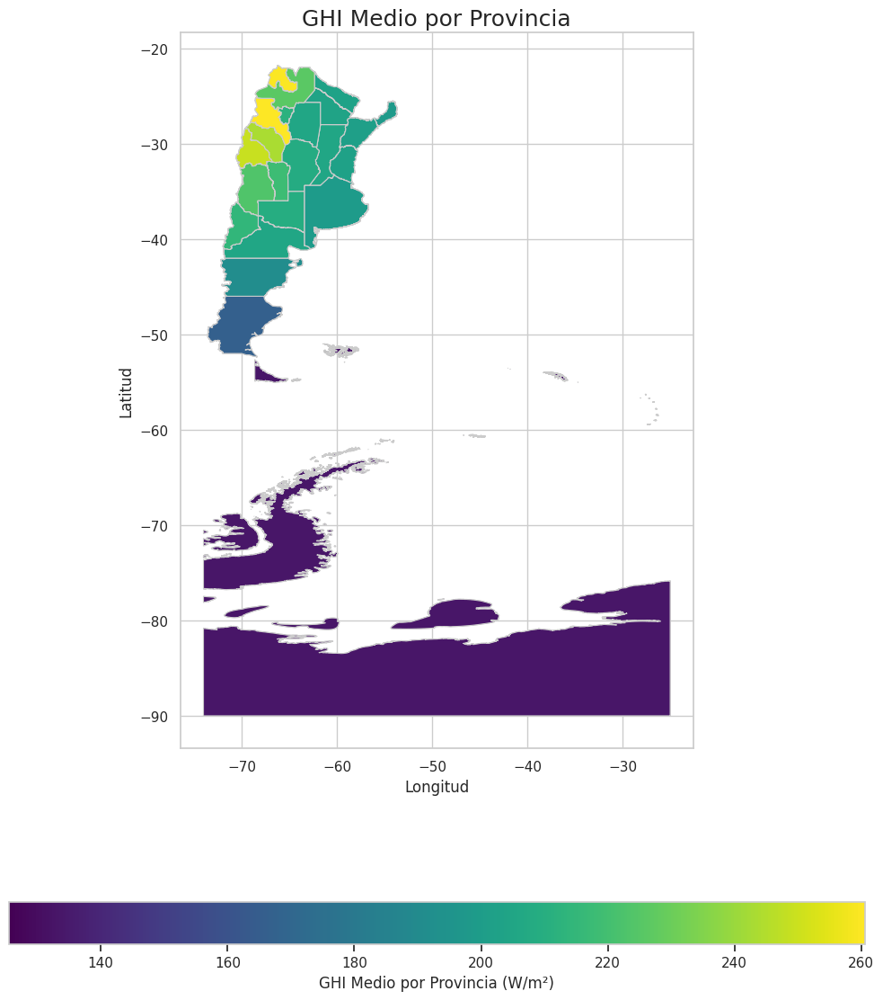

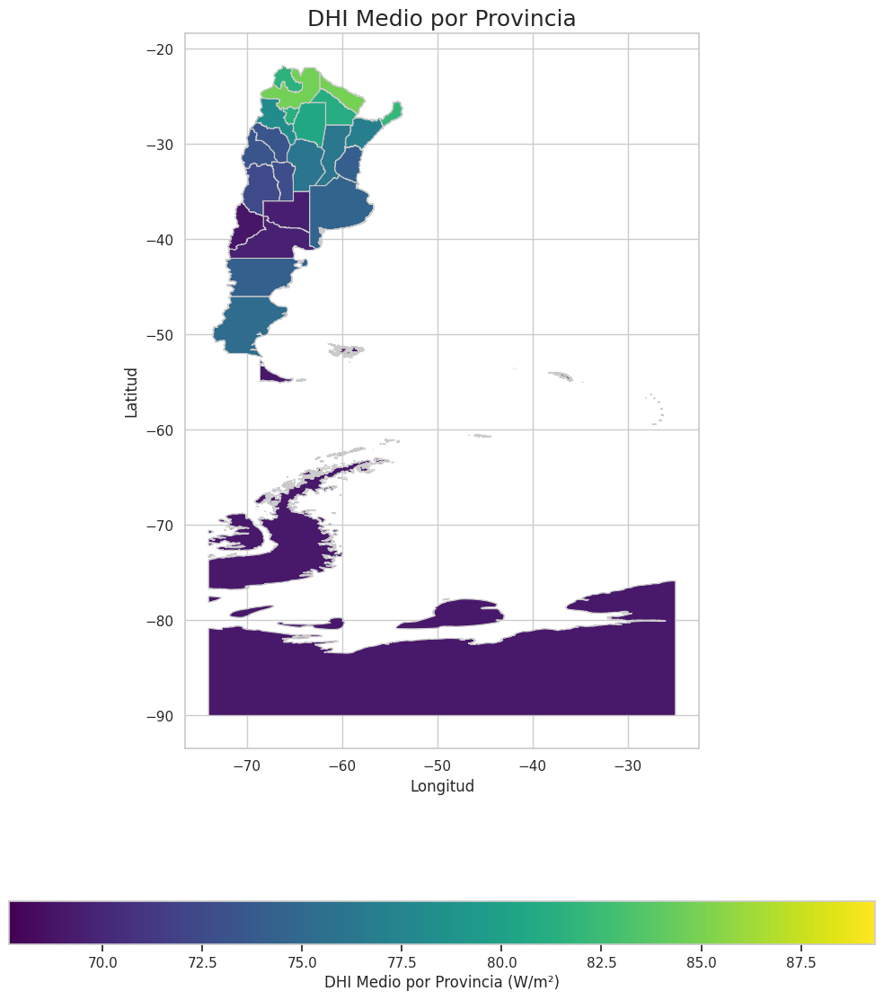

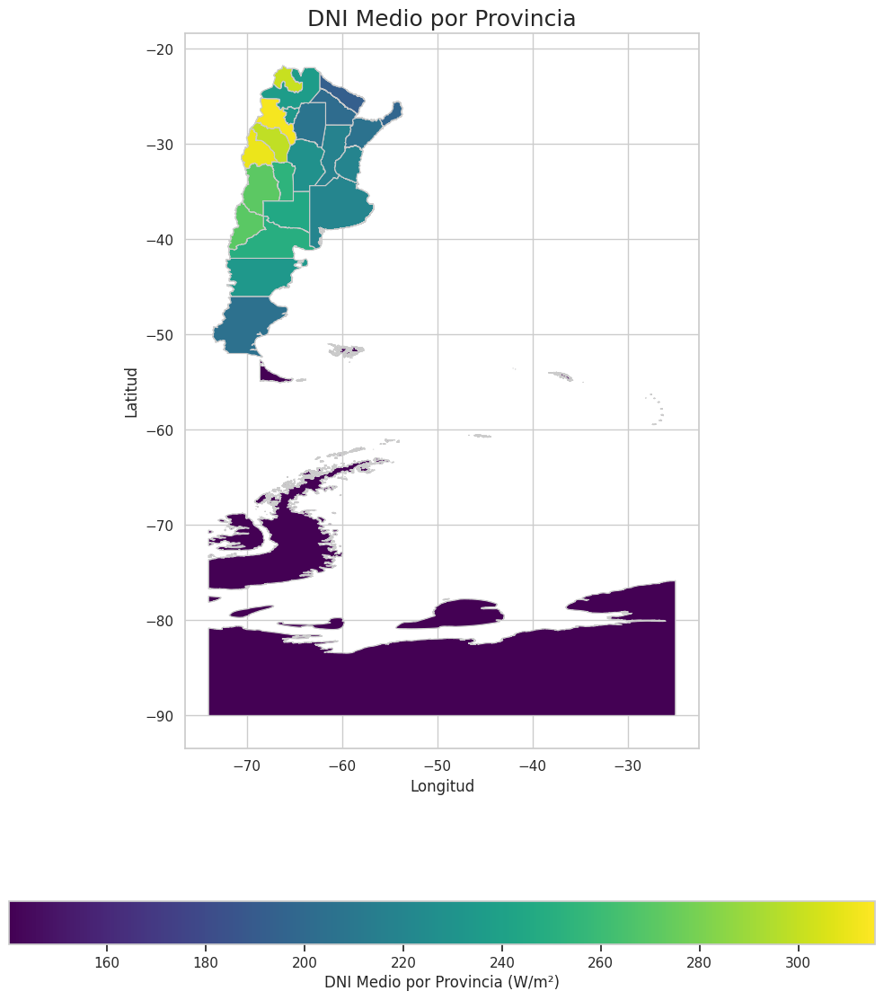

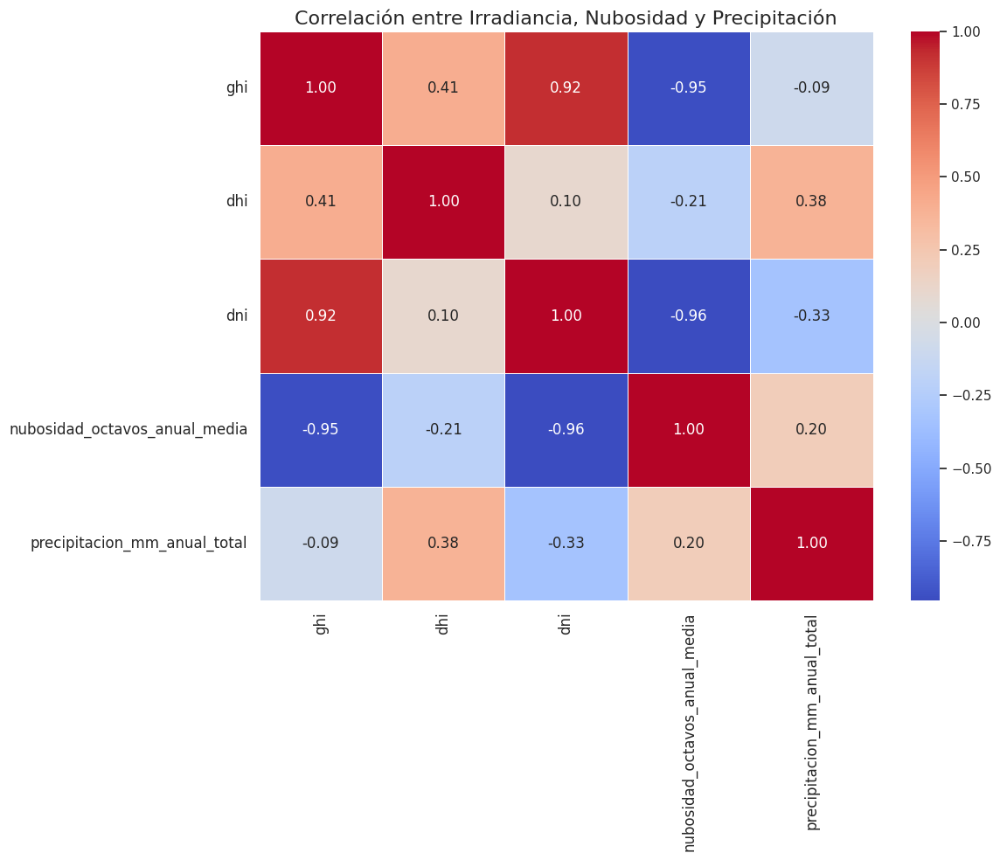

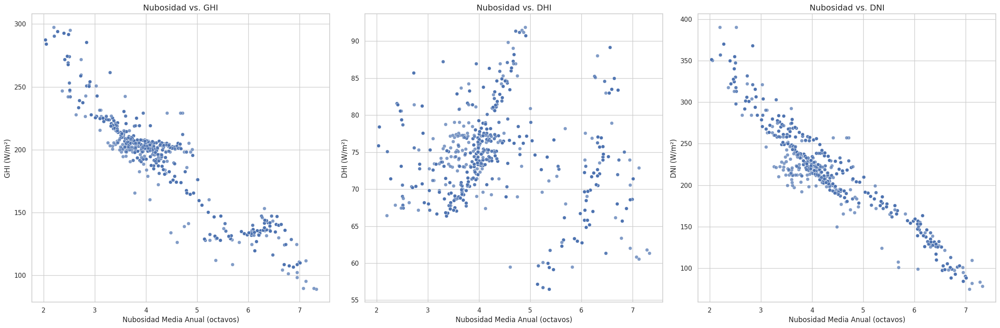

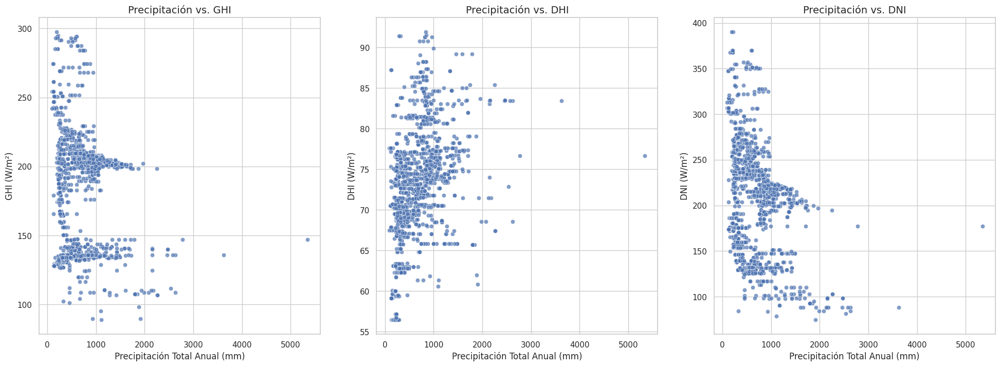

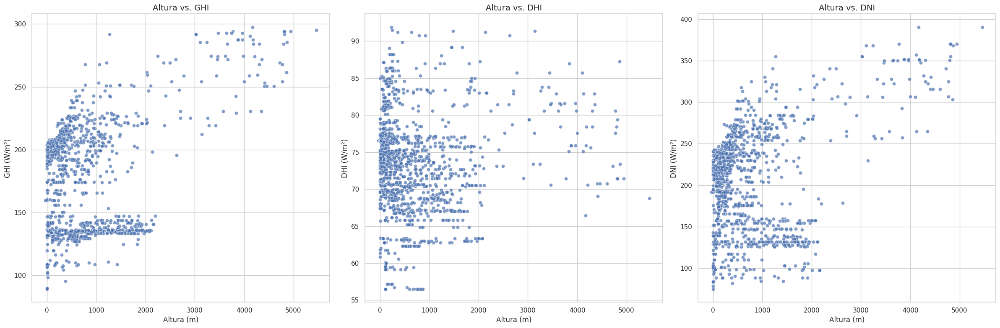

In [112]:
import pandas as pd
import geopandas
import matplotlib.pyplot as plt
import seaborn as sns
from unidecode import unidecode
import re

def limpiar_texto(texto):
    if not isinstance(texto, str):
        return texto
    limpio = unidecode(texto)
    limpio = re.sub(r'[\s-]+', '_', limpio)
    limpio = re.sub(r'[^\w]', '', limpio)
    return limpio.lower()


try:
    df_stations = pd.read_csv('datos/dataset_cleaned_tabular_engineered_with_target.csv')
except FileNotFoundError:
    print("El archivo 'dataset_cleaned_tabular_engineered_with_target.csv' no fue encontrado.")
    exit()

sns.set_theme(style="whitegrid")

#  Mapa de GHI medio por provincia 
def plot_ghi_map(df, target_variable='ghi', cmap='viridis', title='GHI Medio por Provincia'):
    """
    Plots a choropleth map of average GHI by province.

    Args:
        df (pd.DataFrame): DataFrame containing the data.
        target_variable (str): Column name for the target variable (ghi, dhi, dni).
        cmap (str): Colormap for the plot.
        title (str): Title of the plot.
    """
    # Calcular el GHI medio por provincia
    df_ghi_provincia = df.groupby('provincia')[target_variable].mean().reset_index()

    # Renombrar la columna a su nombre final
    df_ghi_provincia.rename(columns={target_variable: 'target_media_provincial'}, inplace=True)

    # Limpiar los nombres de las provincias para la unión
    df_ghi_provincia['provincia_limpia'] = df_ghi_provincia['provincia'].apply(limpiar_texto)

    mapa_correcciones = {
        'tierra_del_fueg': 'tierra_del_fuego_antartida_e_islas_del_atlantico_sur',
        'santiago_del_es': 'santiago_del_estero',
        'capital_federal': 'ciudad_autonoma_de_buenos_aires'
    }
    df_ghi_provincia['provincia_limpia'] = df_ghi_provincia['provincia_limpia'].replace(mapa_correcciones)

    # Preparar los datos del mapa
    ruta_mapa_provincias = "datos/provincia/provinciaPolygon.shp"
    mapa_provincias = geopandas.read_file(ruta_mapa_provincias)

    mapa_provincias['provincia_limpia'] = mapa_provincias['nam'].apply(limpiar_texto)

    # Unir dataframes 
    mapa_final_ghi = pd.merge(
        mapa_provincias,
        df_ghi_provincia,
        on='provincia_limpia',
        how='left'
    )

    #  Dibujar mapa final 
    fig, ax = plt.subplots(1, 1, figsize=(10, 12))

    mapa_final_ghi.plot(
        column='target_media_provincial',
        ax=ax,
        legend=True,
        cmap=cmap,
        linewidth=0.8,
        edgecolor='0.8',
        missing_kwds={
            "color": "lightgrey",
            "edgecolor": "red",
            "hatch": "///",
            "label": "Sin datos",
        },
        legend_kwds={'label': f"{title} (W/m²)", 'orientation': "horizontal"}
    )

    ax.set_title(title, fontsize=18)
    ax.set_xlabel('Longitud')
    ax.set_ylabel('Latitud')
    ax.set_aspect('equal')
    plt.tight_layout()
    plt.savefig(f'graficos/{title.replace(" ", "_")}.png', dpi=300)
    plt.show()

plot_ghi_map(df_stations, target_variable='ghi', cmap='viridis', title='GHI Medio por Provincia')
plot_ghi_map(df_stations, target_variable='dhi', cmap='viridis', title='DHI Medio por Provincia')
plot_ghi_map(df_stations, target_variable='dni', cmap='viridis', title='DNI Medio por Provincia')

#  Correlación entre Irradiancia, Nubosidad y Precipitación - Sospecha de alta corralacion, que se confirma con esta matriz de correlacion
plt.figure(figsize=(12, 10))
correlation_matrix = df_stations[[
    'ghi', 'dhi', 'dni', 'nubosidad_octavos_anual_media', 'precipitacion_mm_anual_total'
]].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=.5, fmt=".2f")
plt.title('Correlación entre Irradiancia, Nubosidad y Precipitación', fontsize=16)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.savefig('graficos/correlacion_irradiancia_clima.png', dpi=300)  # Exportar
plt.show()

#  Diagramas de Dispersión: Nubosidad vs. Irradiancia 
fig, axes = plt.subplots(1, 3, figsize=(24, 8))

sns.scatterplot(ax=axes[0], x='nubosidad_octavos_anual_media', y='ghi', data=df_stations, alpha=0.7)
axes[0].set_title('Nubosidad vs. GHI', fontsize=14)
axes[0].set_xlabel('Nubosidad Media Anual (octavos)', fontsize=12)
axes[0].set_ylabel('GHI (W/m²)', fontsize=12)

sns.scatterplot(ax=axes[1], x='nubosidad_octavos_anual_media', y='dhi', data=df_stations, alpha=0.7)
axes[1].set_title('Nubosidad vs. DHI', fontsize=14)
axes[1].set_xlabel('Nubosidad Media Anual (octavos)', fontsize=12)
axes[1].set_ylabel('DHI (W/m²)', fontsize=12)

sns.scatterplot(ax=axes[2], x='nubosidad_octavos_anual_media', y='dni', data=df_stations, alpha=0.7)
axes[2].set_title('Nubosidad vs. DNI', fontsize=14)
axes[2].set_xlabel('Nubosidad Media Anual (octavos)', fontsize=12)
axes[2].set_ylabel('DNI (W/m²)', fontsize=12)

plt.tight_layout()
plt.savefig('graficos/nubosidad_vs_irradiancia.png', dpi=300) 
plt.show()

#  Diagramas de Dispersión: Precipitación vs. Irradiancia 
fig, axes = plt.subplots(1, 3, figsize=(24, 8))

sns.scatterplot(ax=axes[0], x='precipitacion_mm_anual_total', y='ghi', data=df_stations, alpha=0.7)
axes[0].set_title('Precipitación vs. GHI', fontsize=14)
axes[0].set_xlabel('Precipitación Total Anual (mm)', fontsize=12)
axes[0].set_ylabel('GHI (W/m²)', fontsize=12)

sns.scatterplot(ax=axes[1], x='precipitacion_mm_anual_total', y='dhi', data=df_stations, alpha=0.7)
axes[1].set_title('Precipitación vs. DHI', fontsize=14)
axes[1].set_xlabel('Precipitación Total Anual (mm)', fontsize=12)
axes[1].set_ylabel('DHI (W/m²)', fontsize=12)

sns.scatterplot(ax=axes[2], x='precipitacion_mm_anual_total', y='dni', data=df_stations, alpha=0.7)
axes[2].set_title('Precipitación vs. DNI', fontsize=14)
axes[2].set_xlabel('Precipitación Total Anual (mm)', fontsize=12)
axes[2].set_ylabel('DNI (W/m²)', fontsize=12)

#  Diagramas de Dispersión: Altura vs. Irradiancia 
fig, axes = plt.subplots(1, 3, figsize=(24, 8))

sns.scatterplot(ax=axes[0], x='altura', y='ghi', data=df_stations, alpha=0.7)
axes[0].set_title('Altura vs. GHI', fontsize=14)
axes[0].set_xlabel('Altura (m)', fontsize=12)
axes[0].set_ylabel('GHI (W/m²)', fontsize=12)

sns.scatterplot(ax=axes[1], x='altura', y='dhi', data=df_stations, alpha=0.7)
axes[1].set_title('Altura vs. DHI', fontsize=14)
axes[1].set_xlabel('Altura (m)', fontsize=12)
axes[1].set_ylabel('DHI (W/m²)', fontsize=12)

sns.scatterplot(ax=axes[2], x='altura', y='dni', data=df_stations, alpha=0.7)
axes[2].set_title('Altura vs. DNI', fontsize=14)
axes[2].set_xlabel('Altura (m)', fontsize=12)
axes[2].set_ylabel('DNI (W/m²)', fontsize=12)

plt.tight_layout()
plt.savefig('graficos/precipitacion_vs_irradiancia.png', dpi=300) 
plt.show()

/tmp/ipykernel_24060/3608580503.py:20: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  argentina_polygon = pais_completo.unary_union


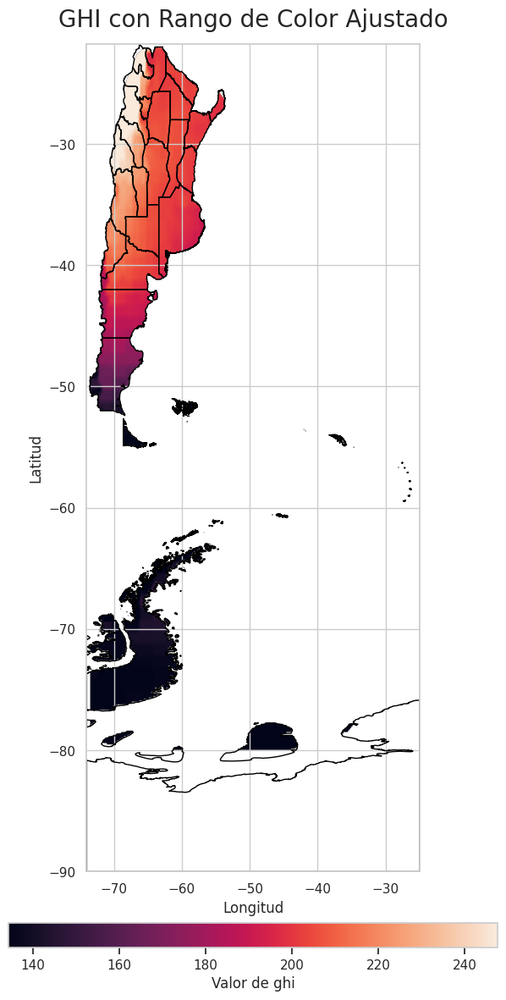

In [ ]:
# Se pensó en usar un mapa de calor para visualizar la irradiancia, pero se optó por un mapa de calor con interpolación espacial para una mejor visualización geográfica.
# Creemos que esta representación es más efectiva que los promedios provinciales para mostrar la distribución espacial de la irradiancia en Argentina.


def generar_mapa_final_sjoin(df, variable_a_mapear, cmap=None, titulo=None, grid_resolution=300, vmin=None, vmax=None):
    # --- 1. DATOS ---
    df_valid = df.dropna(subset=['longitud', 'latitud', variable_a_mapear])
    if df_valid.empty:
        print("No hay datos válidos para graficar.")
        return

    points = df_valid[['longitud', 'latitud']].values
    values = df_valid[variable_a_mapear].values

    # --- 2. MAPA ---
    ruta_mapa_provincias = "datos/provincia/provinciaPolygon.shp"
    try:
        mapa_provincias = geopandas.read_file(ruta_mapa_provincias)
        pais_completo = mapa_provincias.dissolve()
        argentina_polygon = pais_completo.unary_union
    except Exception as e:
        print(f"Error cargando el mapa: {e}")
        return

    # --- 3. MALLA E INTERPOLACIÓN ---
    min_lon, min_lat, max_lon, max_lat = argentina_polygon.bounds
    x_coords = np.linspace(min_lon, max_lon, grid_resolution)
    y_coords = np.linspace(min_lat, max_lat, grid_resolution)
    grid_x, grid_y = np.meshgrid(x_coords, y_coords)

    interpolator = LinearNDInterpolator(points, values)
    grid_z = interpolator(grid_x, grid_y)

    # --- 4. MÁSCARA VÍA SJOIN ---
    gdf_grid = geopandas.GeoDataFrame(
        geometry=geopandas.points_from_xy(grid_x.ravel(), grid_y.ravel()),
        crs=mapa_provincias.crs
    )
    gdf_arg = geopandas.GeoDataFrame(geometry=[argentina_polygon], crs=mapa_provincias.crs)

    # Solo conservar puntos dentro de Argentina
    inside_points = geopandas.sjoin(gdf_grid, gdf_arg, how="inner")
    mask = np.zeros(gdf_grid.shape[0], dtype=bool)
    mask[inside_points.index] = True
    mask = mask.reshape(grid_x.shape)

    grid_z[~mask] = np.nan

    # --- 5. PLOTEO ---
    fig, ax = plt.subplots(figsize=(10, 13))
    ax.set_aspect('equal')
    if titulo is None:
        titulo = f'Mapa de Calor de "{variable_a_mapear.replace("_", " ").title()}"'

    im = ax.imshow(grid_z, extent=(min_lon, max_lon, min_lat, max_lat),
                   origin='lower', cmap=cmap, vmin=vmin, vmax=vmax)
    mapa_provincias.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=1.0)

    ax.set_title(titulo, fontsize=20, pad=15)
    ax.set_xlabel('Longitud')
    ax.set_ylabel('Latitud')

    cbar = fig.colorbar(im, ax=ax, orientation='horizontal', pad=0.05, shrink=0.6)
    cbar.set_label(f'Valor de {variable_a_mapear}')
    plt.tight_layout()
    plt.show()



df_stations = pd.read_csv('datos/dataset_cleaned_tabular_engineered_with_target.csv')
vmin_ajustado = df_stations['ghi'].quantile(0.15)
vmax_ajustado = df_stations['ghi'].quantile(0.95)

generar_mapa_final_sjoin(
    df=df_stations,
    variable_a_mapear='ghi',
    vmin=vmin_ajustado,
    vmax=vmax_ajustado,
    titulo='GHI con Rango de Color Ajustado',
    grid_resolution=600
)



--- 2. Generando Mapa de Puntos (sin interpolación) ---


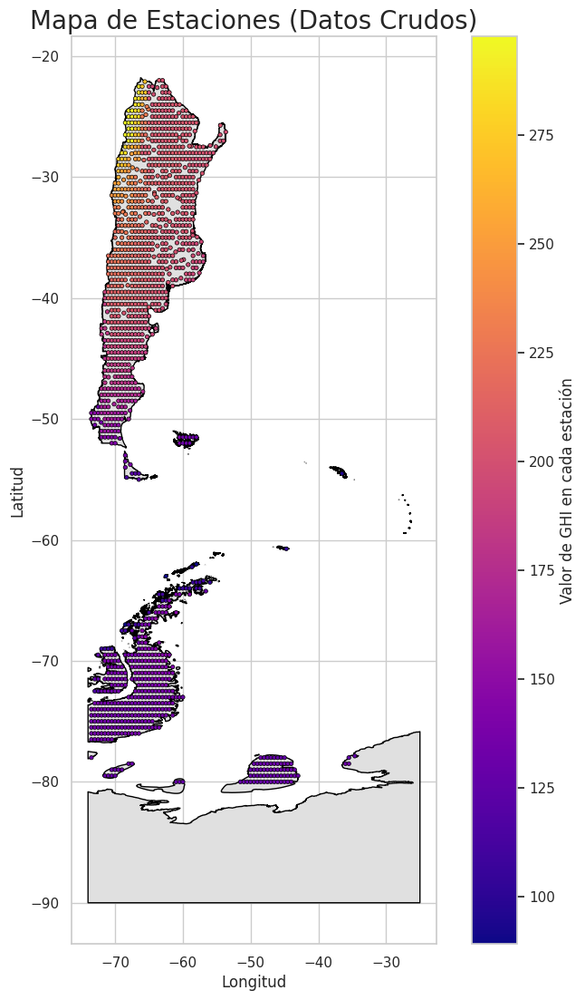

In [114]:
# Se verifican todos los datos de los puntos crudos de ghi
try:
    # 1. MAPA DE PUNTOS (DATOS CRUDOS)
    print("\n--- 2. Generando Mapa de Puntos (sin interpolación) ---")
    ruta_mapa_provincias = "datos/provincia/provinciaPolygon.shp"
    pais_completo = geopandas.read_file(ruta_mapa_provincias).dissolve()

    fig, ax = plt.subplots(1, 1, figsize=(10, 13))
    
    # Dibujar el contorno del país como fondo
    pais_completo.plot(ax=ax, facecolor='#E0E0E0', edgecolor='black')

    # Dibujar un punto por cada estación. El color de cada punto es su valor de GHI.
    scatter = ax.scatter(
        df_stations['longitud'],
        df_stations['latitud'],
        c=df_stations['ghi'],
        cmap='plasma',
        s=10,
        edgecolor='black',
        linewidth=0.5
    )

    ax.set_title('Mapa de Estaciones (Datos Crudos)', fontsize=20)
    ax.set_xlabel('Longitud')
    ax.set_ylabel('Latitud')
    fig.colorbar(scatter, label='Valor de GHI en cada estación')
    plt.show()

except NameError:
    print("\nERROR: No se encontró el DataFrame llamado 'df_stations'. Asegúrate de que esté cargado.")
except KeyError:
    print("\nERROR: No se encontró una de las columnas requeridas ('longitud', 'latitud', 'ghi').")
except Exception as e:
    print(f"\nOcurrió un error inesperado: {e}")

## Selección de Variables Predictoras - *Features*

### Geográficas
- **Latitud** (grados)  
- **Longitud** (grados)  
- **Altura** (metros sobre el nivel del mar)  

### Astronómicas
- **Ángulo cenital en el solsticio de verano al mediodía** (grados)  
- **Ángulo cenital en el solsticio de invierno al mediodía** (grados)  
- **Duración del día en horas el primer día de invierno**  
- **Duración del día en horas el primer día de verano**  

### Meteorológicas
En principio, se hará uso de todas las variables meteorológicas disponibles, así como de aquellas generadas mediante técnicas de *feature engineering*.

> Cabe destacar que este proceso se ha realizado **antes del particionado** del conjunto de datos (*split*), debido a la naturaleza del mismo: se dispone de **N filas independientes**, cada una correspondiente a una estación meteorológica con sus respectivas características. Esto permite generar nuevas variables por fila sin incurrir en riesgo de *data leakage*.



In [115]:
# Se eliminan las columnas que no aportan valor predictivo, que son redundantes o generan fuga de datos.
df_stations = pd.read_csv('datos/dataset_cleaned_tabular_engineered_with_target.csv')
# Lista de columnas a eliminar
columnas_a_eliminar = [
    # 1. Fuga de datos 
    'dhi',
    'dni',
    
    # 2. Identificadores (no aportan valor predictivo numérico)
    'estacion',
    'oaci',
    'nro',
    
    # 3. Variables astronómicas
    'declinacion_verano_grados',
    'declinacion_invierno_grados',
    'duracion_dia_verano_horas',
    'duracion_dia_invierno_horas',
    'angulo_cenital_mediodia_verano_grados',
    'angulo_cenital_mediodia_invierno_grados',
    'G0_invierno_W_m2',
    'G0_verano_W_m2'
]
df_stations_limpio=df_stations.drop(columns=columnas_a_eliminar, axis=1)
print("Columnas restantes en el DataFrame:")
print(df_stations_limpio.columns)

Columnas restantes en el DataFrame:
Index(['provincia', 'region', 'latitud', 'longitud', 'altura',
       'frecuencia_dias_precipitacion_gt_1mm_anual_amplitud',
       'frecuencia_dias_precipitacion_gt_1mm_anual_cv',
       'frecuencia_dias_precipitacion_gt_1mm_anual_max',
       'frecuencia_dias_precipitacion_gt_1mm_anual_media',
       'frecuencia_dias_precipitacion_gt_1mm_anual_min',
       'frecuencia_dias_precipitacion_gt_1mm_anual_std',
       'frecuencia_dias_precipitacion_gt_1mm_anual_total',
       'humedad_relativa_porcentaje_anual_amplitud',
       'humedad_relativa_porcentaje_anual_cv',
       'humedad_relativa_porcentaje_anual_max',
       'humedad_relativa_porcentaje_anual_media',
       'humedad_relativa_porcentaje_anual_min',
       'humedad_relativa_porcentaje_anual_std',
       'humedad_relativa_porcentaje_anual_total',
       'nubosidad_octavos_anual_amplitud', 'nubosidad_octavos_anual_cv',
       'nubosidad_octavos_anual_max', 'nubosidad_octavos_anual_media',
      

In [116]:
# Muestra las primeras filas del nuevo DataFrame
df_stations_limpio.head()

,provincia,region,latitud,longitud,altura,frecuencia_dias_precipitacion_gt_1mm_anual_amplitud,frecuencia_dias_precipitacion_gt_1mm_anual_cv,frecuencia_dias_precipitacion_gt_1mm_anual_max,frecuencia_dias_precipitacion_gt_1mm_anual_media,frecuencia_dias_precipitacion_gt_1mm_anual_min,...,temperatura_maxima_c_anual_std,temperatura_maxima_c_anual_total,temperatura_minima_c_anual_amplitud,temperatura_minima_c_anual_cv,temperatura_minima_c_anual_max,temperatura_minima_c_anual_media,temperatura_minima_c_anual_min,temperatura_minima_c_anual_std,temperatura_minima_c_anual_total,ghi
0,CAPITAL FEDERAL,Pampeana,-34.5500,-58.4167,6.0,3.0,0.1572,7.5,5.9250,4.5,...,4.9780,259.3,12.4,0.3025,20.8,14.7250,8.4,4.4540,176.7,199.863917
1,BUENOS AIRES,Pampeana,-36.8167,-59.8833,147.0,3.9,0.2332,7.3,5.5583,3.4,...,5.7768,254.0,12.2,0.5673,14.0,7.7917,1.8,4.4199,93.5,198.299194
2,BUENOS AIRES,Pampeana,-38.7000,-62.1500,83.0,3.2,0.1973,6.7,4.9750,3.5,...,6.1846,269.1,13.9,0.5300,16.3,9.2417,2.4,4.8985,110.9,201.666222
3,RIO NEGRO,Patagonia,-41.1333,-71.1500,835.0,10.8,0.5631,13.3,6.8167,2.5,...,6.0604,179.2,8.6,1.2221,7.0,2.5167,-1.6,3.0757,30.2,183.928194
4,ANTARTIDA,Antártida,-77.8667,-34.6167,256.0,2.4,0.0947,9.3,8.2583,6.9,...,6.8086,-117.0,18.9,-0.3952,-6.1,-17.3833,-25.0,6.8695,-208.6,126.409111


In [117]:
#Todavia quedavan algunos pocos valores nulos, por lo que se procede a eliminarlos
total_nulos = df_stations_limpio.isnull().sum().sum()
print(f"Número total de datos faltantes: {total_nulos}")
print("Conteo de valores nulos por columna:")
print(df_stations_limpio.isnull().sum())
# Muestra cuántas filas hay ANTES de la eliminación
print(f"Número de filas antes de eliminar: {len(df_stations_limpio)}")

# Elimina todas las filas que contengan al menos un valor nulo
df_stations_limpio.dropna(inplace=True)

print(f"Número de filas después de eliminar: {len(df_stations_limpio)}")

total_nulos_despues = df_stations_limpio.isnull().sum().sum()
print(f"Número total de datos faltantes ahora: {total_nulos_despues}")

if total_nulos_despues == 0:
    print("\nTodas las filas con valores nulos han sido eliminadas.")
    
    
nombre_archivo_final = 'datos/dataset_para_entrenamiento.csv'


df_stations_limpio.to_csv(nombre_archivo_final, index=False)

print(f"Dataset final guardado exitosamente en '{nombre_archivo_final}'")

Número total de datos faltantes: 26
Conteo de valores nulos por columna:
provincia                                               3
region                                                  3
latitud                                                 3
longitud                                                3
altura                                                 11
frecuencia_dias_precipitacion_gt_1mm_anual_amplitud     0
frecuencia_dias_precipitacion_gt_1mm_anual_cv           0
frecuencia_dias_precipitacion_gt_1mm_anual_max          0
frecuencia_dias_precipitacion_gt_1mm_anual_media        0
frecuencia_dias_precipitacion_gt_1mm_anual_min          0
frecuencia_dias_precipitacion_gt_1mm_anual_std          0
frecuencia_dias_precipitacion_gt_1mm_anual_total        0
humedad_relativa_porcentaje_anual_amplitud              0
humedad_relativa_porcentaje_anual_cv                    0
humedad_relativa_porcentaje_anual_max                   0
humedad_relativa_porcentaje_anual_media                 0

# Validación Cruzada Espacial en Bloques

Para asegurar que nuestro modelo aprenda a generalizar en lugar de memorizar, implementamos una estrategia de **Validación Cruzada Espacial en Bloques**. El objetivo es evitar que en el conjunto de prueba (`test`) haya estaciones muy cercanas a las del conjunto de entrenamiento (`train`). De esta forma, el modelo se ve forzado a aprender las características climáticas subyacentes en lugar de simplemente asociar una ubicación geográfica específica con un valor objetivo (`ghi`).

El proceso se divide en los siguientes pasos:

### 1. Definición de Zonas de Prueba Geográficas

Primero, tratamos las coordenadas (latitud y longitud) de todas las estaciones como un conjunto de puntos en un mapa. Utilizamos el algoritmo **K-Means** para agrupar estas estaciones en `N_TEST_ZONES` (en este caso, 25) clusters o "zonas". K-Means identifica los centroides de estas zonas, que actúan como los puntos centrales de nuestros futuros bloques de prueba.

### 2. Selección de Estaciones para el Conjunto de Prueba

Una vez que tenemos los centros de las zonas, utilizamos el algoritmo **NearestNeighbors** (Vecinos más Cercanos) para encontrar las `stations_per_zone` (en este caso, 10) estaciones más próximas a cada uno de esos centroides.

- **`zone_centers`**: Son los puntos centrales calculados por K-Means.
- **`stations_per_zone`**: Es la cantidad de estaciones que conformarán cada bloque de prueba.

Todas las estaciones seleccionadas en este paso se agrupan para formar el **conjunto de prueba (`df_test`)**.

### 3. Creación del Conjunto de Entrenamiento

El **conjunto de entrenamiento (`df_train`)** se crea de forma sencilla: son todas las estaciones que **no** fueron seleccionadas para el conjunto de prueba.

### 4. Resultado Final

Este método nos garantiza que el conjunto de prueba esté compuesto por pequeños bloques de estaciones geográficamente agrupadas, mientras que el conjunto de entrenamiento contiene todas las demás estaciones. Al separar los datos de esta manera, evaluamos de forma más robusta la capacidad del modelo para predecir en ubicaciones completamente nuevas para él.

In [118]:
from sklearn.cluster import KMeans
from sklearn.neighbors import NearestNeighbors

# --- 1. CONFIGURACIÓN ---
df_final = pd.read_csv('datos/dataset_para_entrenamiento.csv')

# --- INICIO DEL CÁLCULO DINÁMICO ---
# Parámetros clave que puedes ajustar
TARGET_TEST_PERCENTAGE = 0.15  # % de los datos para prueba
N_TEST_ZONES = 25              #zonas distribuidas 
RANDOM_STATE = 42

# Cálculo de estaciones por zona
total_stations = len(df_final)
target_test_size = int(total_stations * TARGET_TEST_PERCENTAGE)
stations_per_zone = target_test_size // N_TEST_ZONES
if stations_per_zone == 0:
    stations_per_zone = 1

actual_test_size = N_TEST_ZONES * stations_per_zone
actual_test_percentage = (actual_test_size / total_stations) * 100

print(f"Total de estaciones: {total_stations}")
print(f"Se crearán {N_TEST_ZONES} zonas de prueba con {stations_per_zone} estaciones cada una.")
print(f"Esto resulta en un conjunto de prueba de {actual_test_size} estaciones ({actual_test_percentage:.2f}% del total).")

# --- 2. PREPARACIÓN ---
coords = df_final[['latitud', 'longitud']].values
all_indices = np.arange(len(df_final))

# --- 3. PASO 1: ENCONTRAR LOS CENTROS DE LAS ZONAS DE PRUEBA ---
kmeans = KMeans(n_clusters=N_TEST_ZONES, random_state=RANDOM_STATE, n_init=10)
kmeans.fit(coords)
zone_centers = kmeans.cluster_centers_

# --- 4. PASO 2: SELECCIONAR LAS ESTACIONES ALREDEDOR DE CADA CENTRO ---
nbrs = NearestNeighbors(n_neighbors=stations_per_zone).fit(coords)
distances, indices = nbrs.kneighbors(zone_centers)

test_indices = sorted(list(indices.flatten()))
train_indices = sorted(list(set(all_indices) - set(test_indices)))

# --- 5. CREACIÓN DE LOS DATASETS FINALES ---
df_train = df_final.iloc[train_indices]
df_test = df_final.iloc[test_indices]

for i in range(N_TEST_ZONES):
    zone_station_indices = indices[i]
    zone_station_names = df_final.iloc[zone_station_indices]['region'].tolist()
    print(f"  Zona {i+1}: {zone_station_names}")
X_train = df_train.drop(columns=['ghi', 'provincia', 'region'])
y_train = df_train['ghi']
X_test = df_test.drop(columns=['ghi', 'provincia', 'region'])
y_test = df_test['ghi']

# --- 6. VERIFICACIÓN ---
print("\n--- Resultado de la División por Zonas Distribuidas ---")
print(f"Estaciones totales en el conjunto de prueba: {len(df_test)}")
print(f"Estaciones totales en el conjunto de entrenamiento: {len(df_train)}")
print(f"\nMapa de Zonas de Prueba (Cluster -> Estaciones):")


ruta_guardado = 'datos/'

# Guardar los conjuntos de entrenamiento
X_train.to_csv(ruta_guardado + 'X_train.csv', index=False)
y_train.to_frame().to_csv(ruta_guardado + 'y_train.csv', index=False)

# Guardar los conjuntos de prueba
X_test.to_csv(ruta_guardado + 'X_test.csv', index=False)
y_test.to_frame().to_csv(ruta_guardado + 'y_test.csv', index=False)

print("Archivos guardados exitosamente:")
print(f"- {ruta_guardado}X_train.csv")
print(f"- {ruta_guardado}y_train.csv")
print(f"- {ruta_guardado}X_test.csv")
print(f"- {ruta_guardado}y_test.csv")

Total de estaciones: 1390
Se crearán 25 zonas de prueba con 8 estaciones cada una.
Esto resulta en un conjunto de prueba de 200 estaciones (14.39% del total).
  Zona 1: ['Patagonia', 'Patagonia', 'Patagonia', 'Patagonia', 'Patagonia', 'Patagonia', 'Patagonia', 'Patagonia']
  Zona 2: ['Patagonia', 'Patagonia', 'Patagonia', 'Patagonia', 'Patagonia', 'Patagonia', 'Patagonia', 'Patagonia']
  Zona 3: ['Cuyo', 'Cuyo', 'Cuyo', 'Cuyo', 'Cuyo', 'Cuyo', 'NOA', 'Cuyo']
  Zona 4: ['NOA', 'Pampeana', 'Pampeana', 'Pampeana', 'NOA', 'Pampeana', 'Pampeana', 'Pampeana']
  Zona 5: ['Patagonia', 'Patagonia', 'Patagonia', 'Antártida', 'Patagonia', 'Patagonia', 'Patagonia', 'Patagonia']
  Zona 6: ['Patagonia', 'Patagonia', 'Patagonia', 'Patagonia', 'Patagonia', 'Patagonia', 'Patagonia', 'Patagonia']
  Zona 7: ['Patagonia', 'Patagonia', 'Patagonia', 'Patagonia', 'Patagonia', 'Patagonia', 'Patagonia', 'Patagonia']
  Zona 8: ['Patagonia', 'Patagonia', 'Patagonia', 'Patagonia', 'Patagonia', 'Patagonia', 'Patag

/tmp/ipykernel_24060/424606658.py:33: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  ax1.legend()


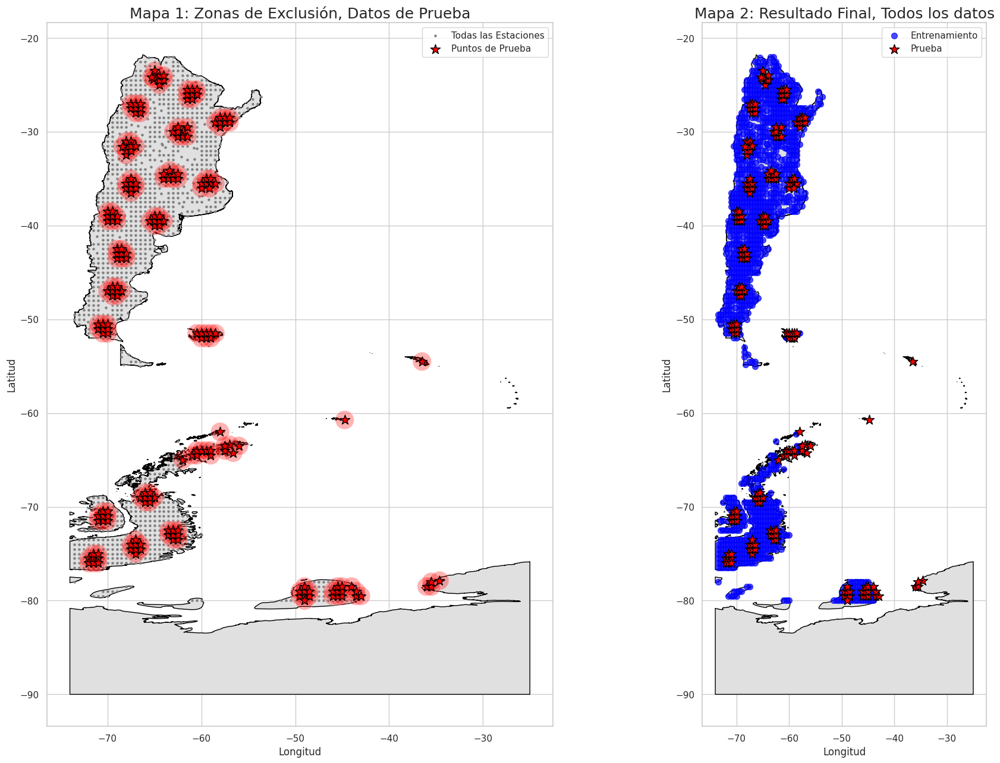

In [119]:
#Se visualizan los dos mapas con las zonas de exclusión (datos de test) y el resultado final con las separacion entre datos de entrenamiento y prueba

BUFFER_RADIUS_DEGREES = 1
# --- 2. PREPARACIÓN DEL MAPA DE FONDO ---
try:
    ruta_mapa_provincias = "datos/provincia/provinciaPolygon.shp"
    pais_completo = geopandas.read_file(ruta_mapa_provincias).dissolve()
except Exception as e:
    print(f"Error al cargar el shapefile: {e}")
    pais_completo = geopandas.GeoDataFrame()

# --- 3. CREACIÓN DE LOS DOS MAPAS ---
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 13))

# --- MAPA 1: Zonas de Exclusión ---
ax1.set_title('Mapa 1: Zonas de Exclusión, Datos de Prueba', fontsize=18)
pais_completo.plot(ax=ax1, facecolor='#E0E0E0', edgecolor='black')

# Dibujar TODOS los puntos originales en gris claro como referencia
ax1.scatter(df_final['longitud'], df_final['latitud'], color='gray', marker='.', s=20, label='Todas las Estaciones')

# Crear los círculos (buffers) alrededor de los puntos de prueba
gdf_test = geopandas.GeoDataFrame(df_test, geometry=geopandas.points_from_xy(df_test.longitud, df_test.latitud))
buffer_zones = gdf_test.geometry.buffer(BUFFER_RADIUS_DEGREES)

# Dibujar las zonas de exclusión
buffer_zones.plot(ax=ax1, facecolor='red', alpha=0.3, label=f'Zona de Exclusión ({BUFFER_RADIUS_DEGREES}°)')

# Dibujar los puntos de prueba en el centro de los buffers
ax1.scatter(df_test['longitud'], df_test['latitud'], color='red', marker='*', s=150, edgecolor='black', label='Puntos de Prueba')
ax1.set_xlabel('Longitud')
ax1.set_ylabel('Latitud')
ax1.legend()

# --- MAPA 2: Resultado Final de la División ---
ax2.set_title('Mapa 2: Resultado Final, Todos los datos', fontsize=18)
pais_completo.plot(ax=ax2, facecolor='#E0E0E0', edgecolor='black')

# Dibujar los puntos de entrenamiento finales
ax2.scatter(df_train['longitud'], df_train['latitud'], color='blue', marker='o', s=50, alpha=0.7, label='Entrenamiento')

# Dibujar los puntos de prueba finales
ax2.scatter(df_test['longitud'], df_test['latitud'], color='red', marker='*', s=150, edgecolor='black', label='Prueba')
ax2.set_xlabel('Longitud')
ax2.set_ylabel('Latitud')
ax2.legend()

plt.tight_layout()
plt.show()

Generando boxplots contextuales por región para cada variable...


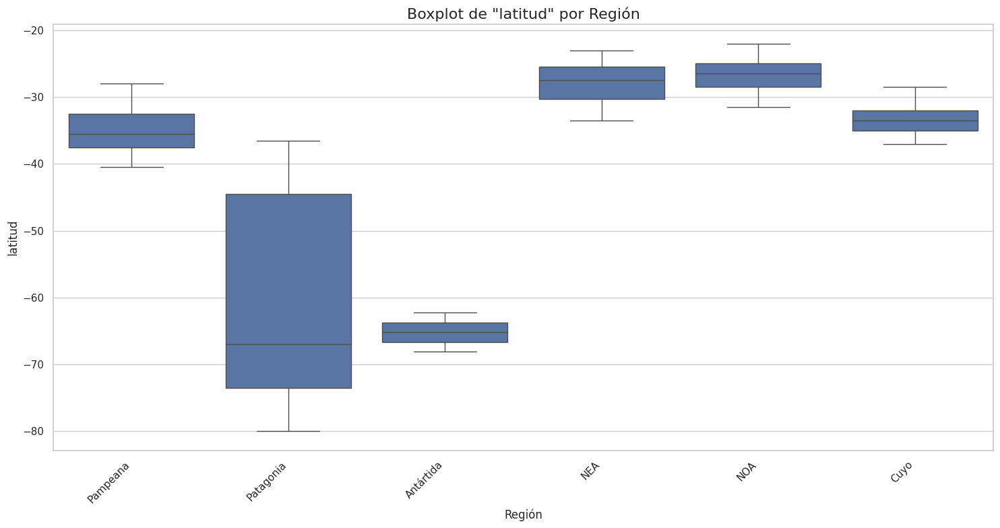

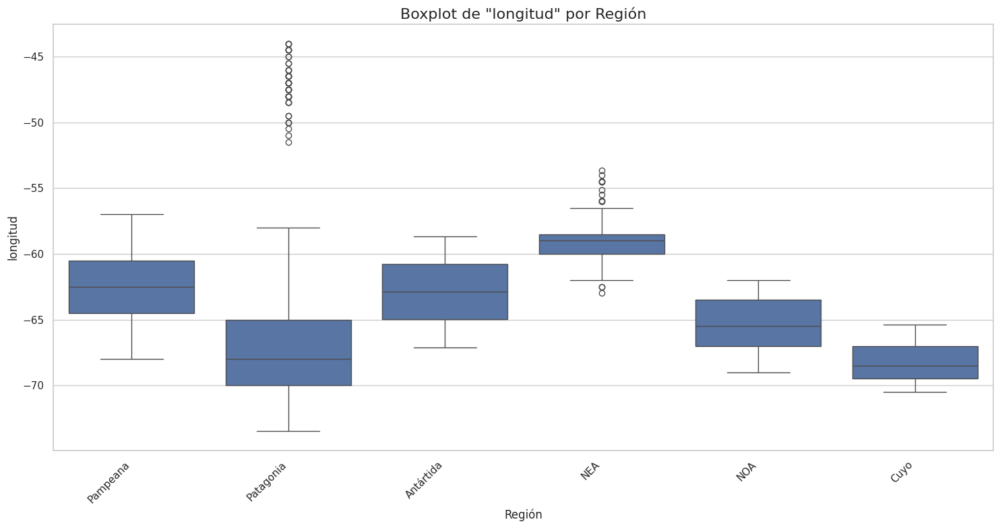

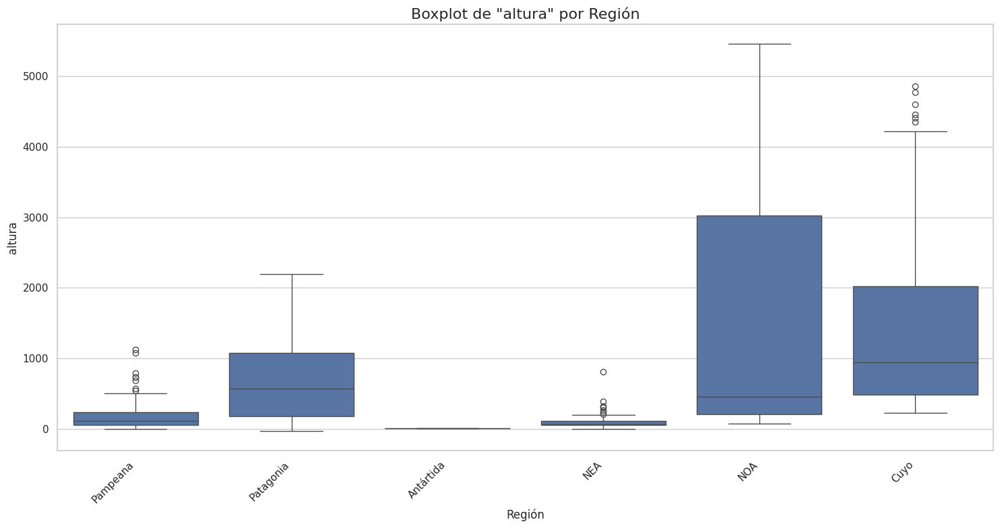

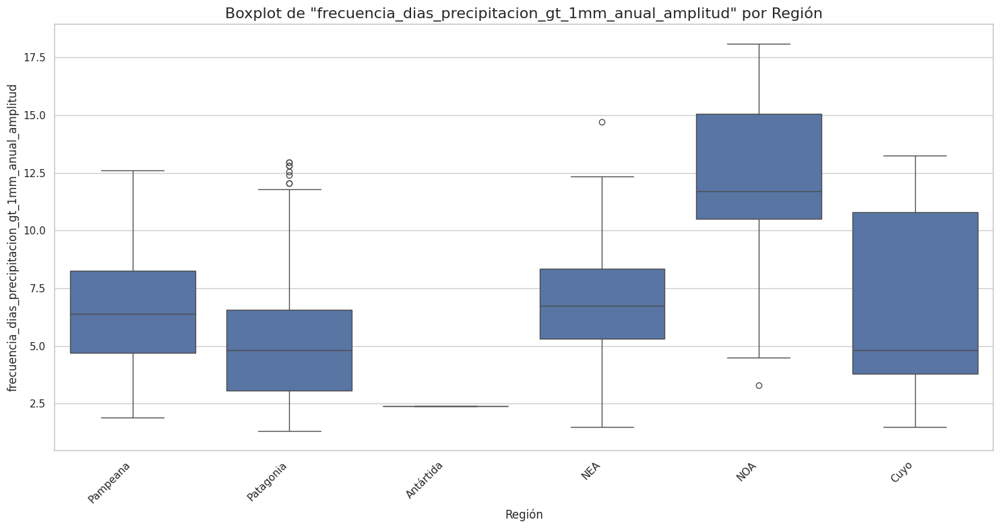

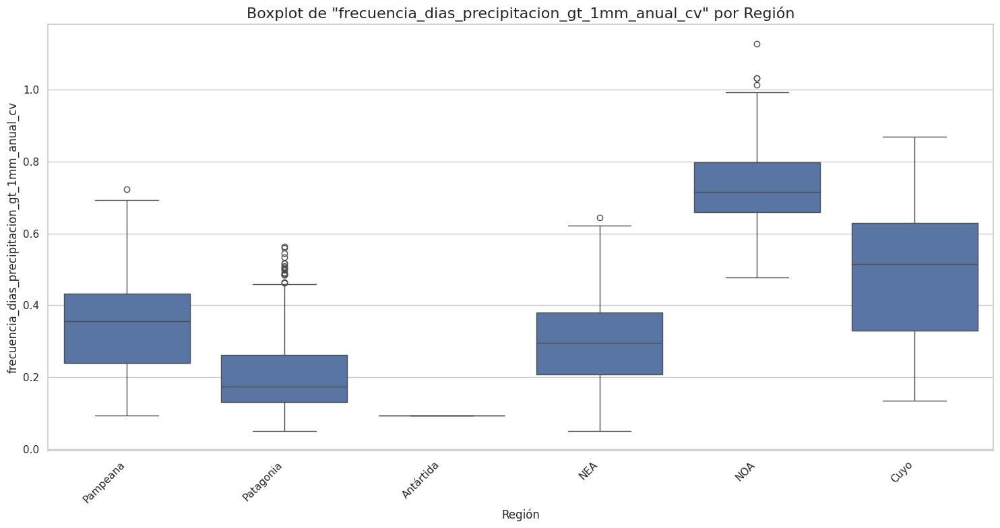

...

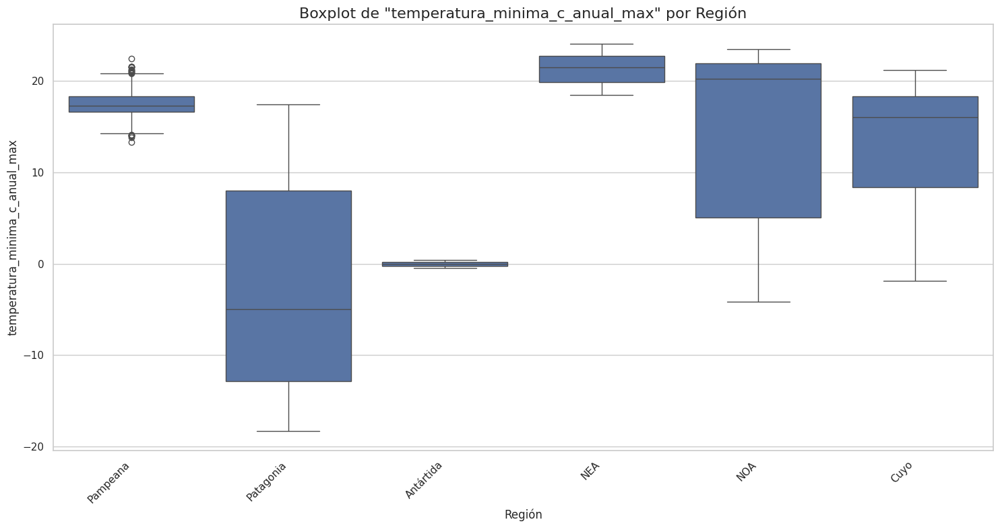

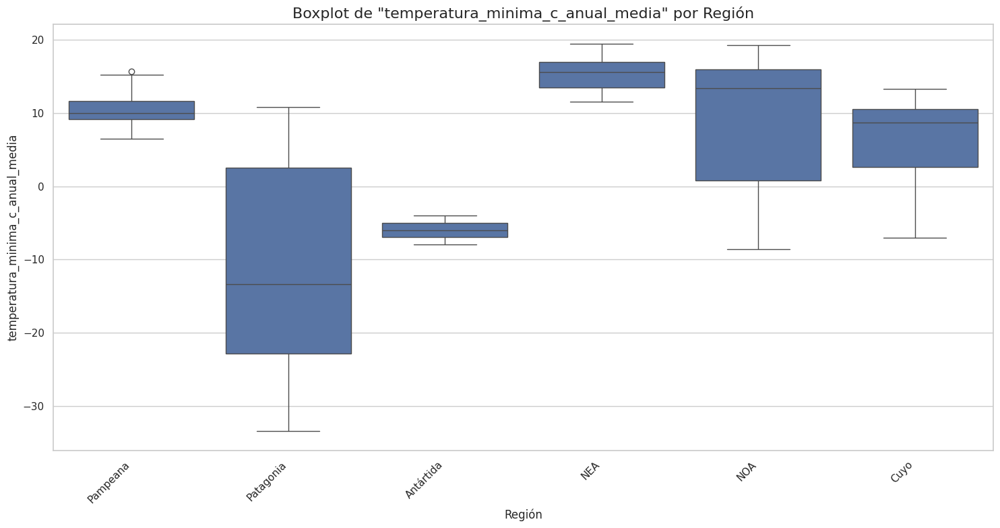

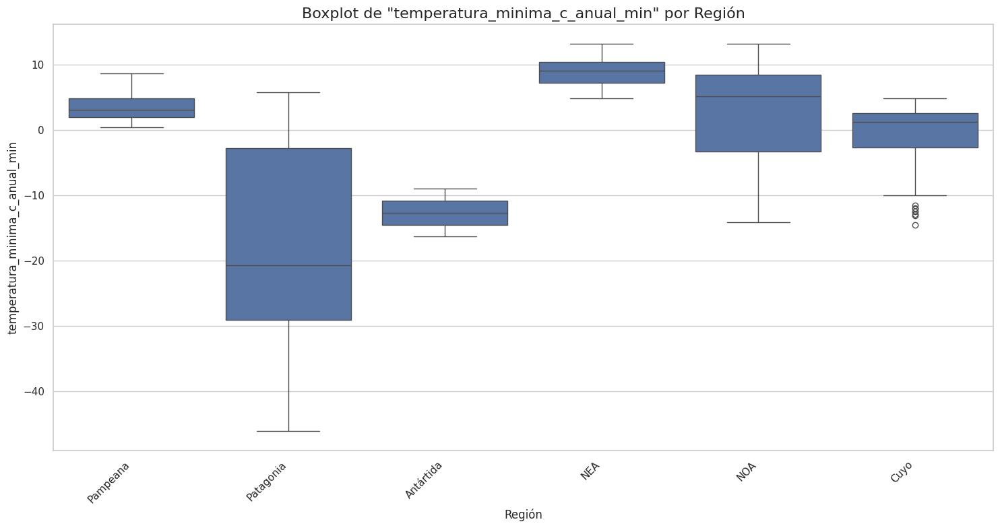

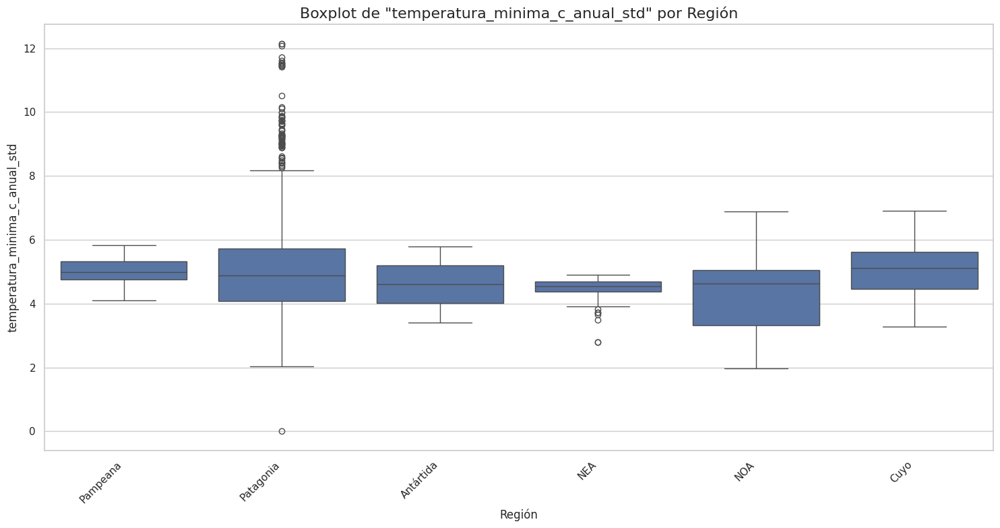

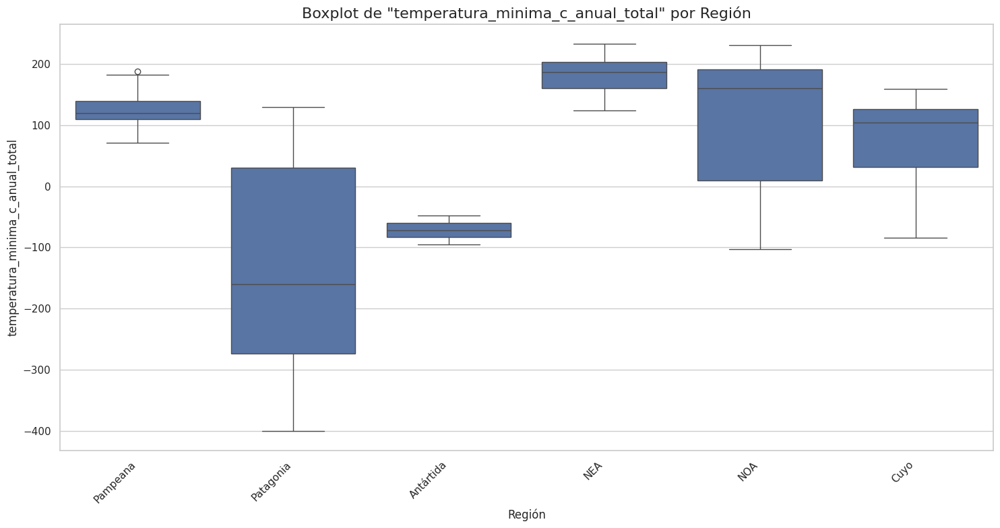

In [120]:
#Se realiza un analisis boxplot para visualizar valores atipicos y la distribucion de las variables numericas en el dataset de entrenamiento, agrupando por region
# Se agrupan por región porque hay valores que respecto a las medias del pais pueden parecer atípicos, pero no lo son en su contexto regional.
# Necesitamos la columna 'region' del df_final para agrupar, así que la unimos temporalmente a X_train para graficar.
df_train_para_plot = pd.concat([X_train, df_final.loc[X_train.index, 'region']], axis=1)

# Identificamos las columnas numéricas que queremos analizar
columnas_numericas = X_train.select_dtypes(include=np.number).columns

print("Generando boxplots contextuales por región para cada variable...")

# Iteramos sobre cada variable para crear un gráfico separado
for col in columnas_numericas:
    plt.figure(figsize=(15, 8))
    sns.boxplot(data=df_train_para_plot, x='region', y=col)
    
    plt.title(f'Boxplot de "{col}" por Región', fontsize=16)
    plt.xlabel('Región', fontsize=12)
    plt.ylabel(col, fontsize=12)
    plt.xticks(rotation=45, ha='right') 
    plt.tight_layout()
    plt.show()

### Eliminación de Outliers Geográficos y Climáticos

Basado en el análisis boxplot anterior, procederemos a eliminar los outliers que podrían perjudicar el rendimiento y la capacidad de generalización del modelo. La eliminación se basa en dos criterios principales:

1.  **Anomalía Geográfica:** Se eliminarán las estaciones de la región de la Patagonia cuya longitud es anómalamente baja (mayor a -55), lo que sugiere que son estaciones insulares (ej: Islas Malvinas) con un régimen climático distinto al continental.
2.  **Anomalía Climática Extrema:** Se eliminará la estación de la Patagonia que presenta un valor extremo de más de 300 días de precipitación anual. Este punto tiene un alto apalancamiento estadístico y no es representativo del clima general de la región.

In [ ]:
print(f"Tamaño original del dataset: {X_train.shape}")

# --- 1. Definir las condiciones para eliminar outliers ---

# Condición 1: Estaciones en la Patagonia que por su longitud parecen ser insulares.
# (Basado en el análisis del boxplot, longitudes mayores a -55 en esa región son anómalas).
df_train = pd.concat([X_train, df_final.loc[X_train.index, 'region']], axis=1)
condicion_islas = (df_train['region'] == 'Patagonia') & (X_train['longitud'] > -55)

# Condición 2: Estación en la Patagonia con precipitaciones anuales extremas.
# (Basado en el análisis, el punto con más de 300 días de lluvia anual).
condicion_lluvia_extrema = (df_train['region'] == 'Patagonia') & (X_train['frecuencia_dias_precipitacion_gt_1mm_anual_total'] > 300)

# --- 2. Identificar y mostrar los outliers ---

indices_a_eliminar = X_train[condicion_islas | condicion_lluvia_extrema].index
if not indices_a_eliminar.empty:
    print(f"\nSe encontraron {len(indices_a_eliminar)} outliers para eliminar.")
    print("Mostrando los outliers identificados antes de la eliminación:")
    
    # Usamos display() que es ideal para mostrar DataFrames en notebooks
    display(X_train.loc[indices_a_eliminar])

    # --- 3. Crear un nuevo DataFrame limpio ---
    # Usamos .drop() para eliminar las filas por su índice.
    X_train_so = X_train.drop(indices_a_eliminar)
    y_train_so = y_train.drop(indices_a_eliminar)

    print("\n✅ Outliers eliminados exitosamente.")
    print(f"Tamaño nuevo del dataset ('df_limpio'): {X_train_so.shape}")

else:
    print("\nNo se encontraron outliers que cumplan con las condiciones definidas.")
    df_limpio = X_train.copy()
X_train_so.to_csv('datos/X_train_limpio.csv', index=False)
y_train_so.to_csv('datos/y_train_limpio.csv', index=False)

Tamaño original del dataset: (1190, 52)

Se encontraron 48 outliers para eliminar.
Mostrando los outliers identificados antes de la eliminación:


,latitud,longitud,altura,frecuencia_dias_precipitacion_gt_1mm_anual_amplitud,frecuencia_dias_precipitacion_gt_1mm_anual_cv,frecuencia_dias_precipitacion_gt_1mm_anual_max,frecuencia_dias_precipitacion_gt_1mm_anual_media,frecuencia_dias_precipitacion_gt_1mm_anual_min,frecuencia_dias_precipitacion_gt_1mm_anual_std,frecuencia_dias_precipitacion_gt_1mm_anual_total,...,temperatura_maxima_c_anual_min,temperatura_maxima_c_anual_std,temperatura_maxima_c_anual_total,temperatura_minima_c_anual_amplitud,temperatura_minima_c_anual_cv,temperatura_minima_c_anual_max,temperatura_minima_c_anual_media,temperatura_minima_c_anual_min,temperatura_minima_c_anual_std,temperatura_minima_c_anual_total
30,-80.0,-48.0,113.0,2.90,0.2553,4.55,2.9958,1.65,0.7647,35.95,...,-32.4768,8.3769,-279.7024,24.8667,-0.3187,-13.2773,-28.1673,-38.1440,8.9766,-338.0075
141,-80.0,-47.5,114.0,2.90,0.2400,4.65,3.1625,1.75,0.7589,37.95,...,-32.6667,8.4351,-282.0521,24.9153,-0.3191,-13.3580,-28.3067,-38.2733,9.0314,-339.6805
252,-80.0,-47.0,114.0,2.70,0.2048,5.10,3.7125,2.40,0.7604,44.55,...,-32.8626,8.4980,-284.2417,25.0656,-0.3202,-13.4224,-28.4922,-38.4880,9.1220,-341.9065
359,-80.0,-46.5,115.0,2.55,0.1687,5.80,4.4917,3.25,0.7576,53.90,...,-33.1591,8.6331,-286.8432,25.3565,-0.3230,-13.3922,-28.6845,-38.7487,9.2649,-344.2137
374,-80.0,-46.0,114.0,2.55,0.1687,5.80,4.4917,3.25,0.7576,53.90,...,-33.1591,8.6331,-286.8432,25.3565,-0.3230,-13.3922,-28.6845,-38.7487,9.2649,-344.2137
385,-80.0,-45.5,115.0,2.40,0.1517,6.50,5.1542,4.10,0.7820,61.85,...,-33.3658,8.7542,-288.5684,25.7118,-0.3262,-13.3550,-28.9076,-39.0668,9.4295,-346.8911
396,-80.0,-45.0,113.0,2.70,0.1447,6.95,5.4917,4.25,0.7948,65.90,...,-33.6741,8.9550,-290.4997,26.1618,-0.3312,-13.1903,-29.0552,-39.3521,9.6226,-348.6627
407,-80.0,-44.5,112.0,2.50,0.1423,6.85,5.4708,4.35,0.7785,65.65,...,-34.2090,9.2888,-293.4865,26.7545,-0.3389,-12.8485,-29.1070,-39.6030,9.8647,-349.2835
418,-80.0,-44.0,111.0,2.30,0.1433,6.65,5.3250,4.35,0.7632,63.90,...,-34.6682,9.5987,-295.8822,27.4500,-0.3469,-12.5385,-29.2510,-39.9885,10.1484,-351.0117
474,-79.5,-50.0,138.0,2.60,0.2552,4.25,2.8208,1.65,0.7200,33.85,...,-31.0377,8.3696,-260.3516,25.7468,-0.3385,-12.0152,-27.2167,-37.7620,9.2130,-326.6001



✅ Outliers eliminados exitosamente.
Tamaño nuevo del dataset ('df_limpio'): (1142, 52)


In [ ]:
# Se genera un pipeline de preprocesamiento para escalar los datos numéricos. 
X_train = pd.read_csv('datos/X_train_limpio.csv')
y_train = pd.read_csv('datos/y_train_limpio.csv')
X_test = pd.read_csv('datos/X_test.csv')
y_test = pd.read_csv('datos/y_test.csv')
# 2. Crear el pipeline de preprocesamiento
# Como todas las columnas son numéricas, aplicamos un solo paso: el escalador.
pipeline = Pipeline(steps=[
    ('scaler', StandardScaler())
])

# 3. Aplicar el pipeline a tus datos
X_train_preprocessed = pipeline.fit_transform(X_train)

X_test_preprocessed = pipeline.transform(X_test)

X_train_scaled_df = pd.DataFrame(X_train_preprocessed, columns=X_train.columns)
X_test_scaled_df = pd.DataFrame(X_test_preprocessed, columns=X_test.columns)

In [ ]:
#Se procesdio hacer una eliminación de variables altamente correlacionadas, para evitar problemas de multicolinealidad y mejorar la interpretabilidad del modelo.
# Los resultados del modelo son buenos por lo que no se considera necesario hacer una selección de variables más compleja, como PDA, LASSO o RFE.
CORRELATION_THRESHOLD = 0.85

# --- 2. CÁLCULO Y FILTRADO ---
# Calcula la matriz de correlación y toma el valor absoluto
correlation_matrix = X_train_scaled_df.corr().abs()


upper_triangle = correlation_matrix.where(
    np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool)
)

# Convierte la matriz en una lista, elimina los nulos y filtra por el umbral
highly_correlated_pairs = upper_triangle.stack().sort_values(ascending=False)
highly_correlated_pairs = highly_correlated_pairs[highly_correlated_pairs > CORRELATION_THRESHOLD]

# --- 3. MOSTRAR RESULTADOS ---
print(f"--- Pares de Features con Correlación > {CORRELATION_THRESHOLD} ---")
if highly_correlated_pairs.empty:
    print("No se encontraron pares de features altamente correlacionadas con este umbral.")
else:
    print(highly_correlated_pairs)
    
temp_df = pd.concat([X_train_scaled_df, y_train], axis=1)

# Correlación de cada feature con el target 'ghi'
corr_with_target = temp_df.corr()['ghi'].abs().sort_values(ascending=False)
print("\n--- Correlación de cada Feature con el Target (ghi) ---")
print(corr_with_target.head(15))

# Conjunto para almacenar las columnas que vamos a eliminar
columns_to_drop = set()

# Iterar sobre los pares altamente correlacionados
for (feature1, feature2), corr_value in highly_correlated_pairs.items():
    if feature1 in columns_to_drop or feature2 in columns_to_drop:
        continue

    # Comparar su correlación con el target 'ghi'
    corr1 = corr_with_target.get(feature1, 0)
    corr2 = corr_with_target.get(feature2, 0)

    # Añadir la columna con la MENOR correlación con 'ghi' al conjunto de eliminación
    if corr1 >= corr2:
        columns_to_drop.add(feature2)
        print(f"Par: ('{feature1}', '{feature2}') -> Conservar '{feature1}', Descartar '{feature2}'")
    else:
        columns_to_drop.add(feature1)
        print(f"Par: ('{feature1}', '{feature2}') -> Conservar '{feature2}', Descartar '{feature1}'")

print(f"\nTotal de columnas a eliminar: {len(columns_to_drop)}")
print("Columnas sugeridas para eliminar:", list(columns_to_drop))


# Eliminar las columnas seleccionadas
X_train_selected = X_train_scaled_df.drop(columns=list(columns_to_drop))
X_test_selected = X_test_scaled_df.drop(columns=list(columns_to_drop)) # Aplicar la misma selección

print(f"\nDimensiones originales de X_train: {X_train_scaled_df.shape}")
print(f"Dimensiones de X_train después de la selección: {X_train_selected.shape}")
X_train_selected.to_csv('datos/X_train_selected.csv', index=False)
X_test_selected.to_csv('datos/X_test_selected.csv', index=False)


--- Pares de Features con Correlación > 0.85 ---
temperatura_minima_c_anual_media                  temperatura_minima_c_anual_total                    0.999938
temperatura_anual_media                           temperatura_anual_total                             0.999909
temperatura_maxima_c_anual_media                  temperatura_maxima_c_anual_total                    0.999874
frecuencia_dias_precipitacion_gt_1mm_anual_media  frecuencia_dias_precipitacion_gt_1mm_anual_total    0.999794
precipitacion_mm_anual_media                      precipitacion_mm_anual_total                        0.998790
                                                                                                        ...   
humedad_relativa_porcentaje_anual_total           nubosidad_octavos_anual_max                         0.853321
temperatura_anual_std                             temperatura_minima_c_anual_amplitud                 0.853265
humedad_relativa_porcentaje_anual_min             nubosidad_oct

In [ ]:
# Se procede a entrenar y evaluar los modelos de regresión, utilizando las métricas de rendimiento más comunes para comparar su desempeño.

# --- 1. Cargar los datos finales ---
X_train = pd.read_csv('datos/X_train_selected.csv') 
y_train = pd.read_csv('datos/y_train_limpio.csv')
X_test = pd.read_csv('datos/X_test_selected.csv')
y_test = pd.read_csv('datos/y_test.csv')

# --- 2. Definir los modelos a probar ---
models = {
    "Ridge Regression": Ridge(random_state=42),
    "Random Forest": RandomForestRegressor(random_state=42, n_jobs=-1),
    "LightGBM": LGBMRegressor(random_state=42, n_jobs=-1),
    "Support Vector Regressor (SVR)": SVR()
}

# --- 3. Bucle de Entrenamiento y Evaluación ---
results = []
print("--- Iniciando Entrenamiento y Evaluación de Modelos ---")
predictions_list = []
for name, model in models.items():
    print(f"Entrenando {name}...")
    model.fit(X_train, y_train.values.ravel())
    predictions = model.predict(X_test)
    predictions_list.append(predictions)
    # Calcular todas las métricas
    r2 = r2_score(y_test, predictions)
    mae = mean_absolute_error(y_test, predictions)
    # RMSE se calcula como la raíz cuadrada de MSE
    rmse = np.sqrt(mean_squared_error(y_test, predictions))
    medae = median_absolute_error(y_test, predictions)
    max_err = max_error(y_test, predictions)
    
    # Guardar los resultados
    results.append({
        "Modelo": name,
        "R² Score": r2,
        "MAE": mae,
        "RMSE": rmse,
        "MedAE": medae,
        "Max Error": max_err
    })

# --- 4. Tabla Comparativa Final ---
results_df = pd.DataFrame(results)
results_df = results_df.sort_values(by="R² Score", ascending=False).reset_index(drop=True)

print("\n--- Tabla Comparativa de Rendimiento de Modelos --- 🏆")
print(results_df)

--- Iniciando Entrenamiento y Evaluación de Modelos ---
Entrenando Ridge Regression...
Entrenando Random Forest...
Entrenando LightGBM...
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000178 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3825
[LightGBM] [Info] Number of data points in the train set: 1142, number of used features: 16
[LightGBM] [Info] Start training from score 186.754673
Entrenando Support Vector Regressor (SVR)...

--- Tabla Comparativa de Rendimiento de Modelos --- 🏆
                           Modelo  R² Score        MAE       RMSE     MedAE  \
0                   Random Forest  0.980535   2.276143   5.944398  0.938536   
1                        LightGBM  0.976827   2.718814   6.485929  1.345017   
2                Ridge Regression  0.842122  10.481814  16.929263  4.795963   
3  Support Vector Regressor (SVR)  0.623799  15.871014  26.132900  4.578480   

   Max Error  
0  64.71

--- Cargando datos y mapa de fondo (una sola vez) ---

--- Generando mapas para el modelo: Ridge Regression ---


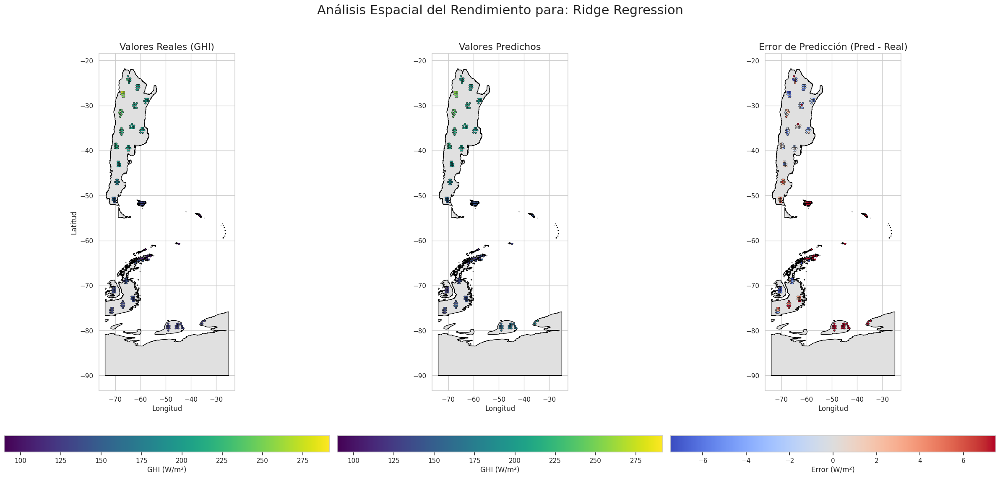


--- Generando mapas para el modelo: Random Forest ---


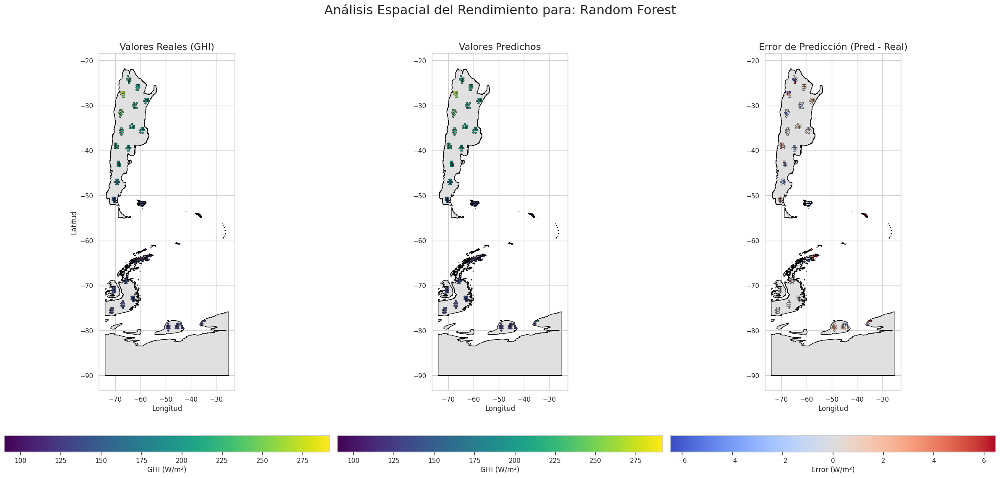


--- Generando mapas para el modelo: LightGBM ---


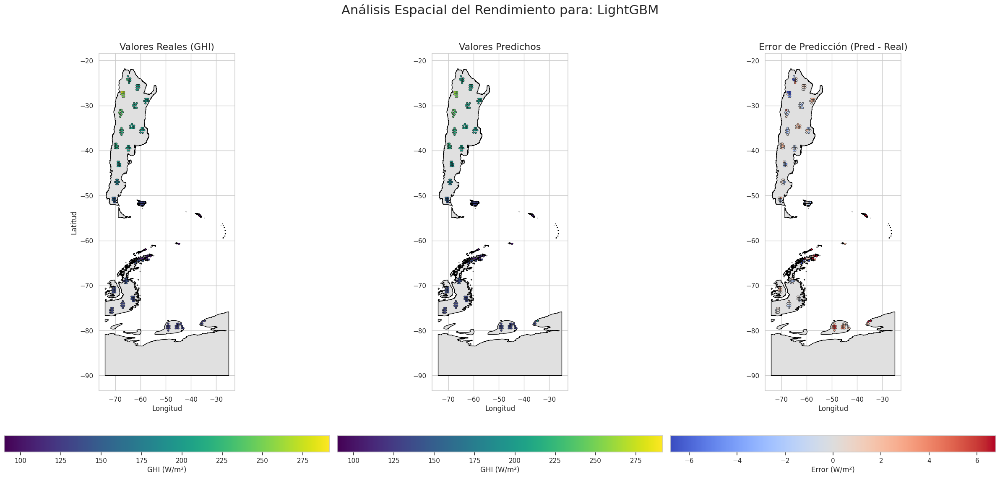


--- Generando mapas para el modelo: Support Vector Regressor (SVR) ---


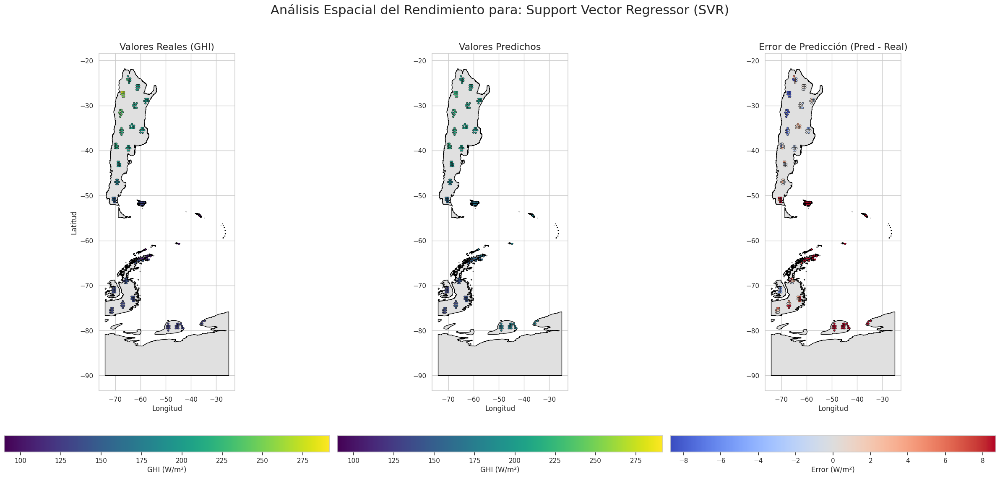

In [125]:
#Se visualizan los resultados de los modelos en un mapa, mostrando las predicciones de GHI y el error de predicción para cada modelo.
print("--- Cargando datos y mapa de fondo (una sola vez) ---")

ruta_mapa_provincias = "datos/provincia/provinciaPolygon.shp"
pais_completo = geopandas.read_file(ruta_mapa_provincias).dissolve()
mapa_cargado = True
X_test = pd.read_csv('datos/X_test.csv')

# --- 2. BUCLE PARA VISUALIZAR CADA MODELO ---

# Iteramos sobre los nombres de los modelos y sus correspondientes predicciones
for model_name, predictions in zip(models.keys(), predictions_list):
    
    print(f"\n--- Generando mapas para el modelo: {model_name} ---")

    # Crear un DataFrame con los resultados específicos de este modelo
    df_results_map = pd.DataFrame({
        'latitud': X_test['latitud'],
        'longitud': X_test['longitud'],
        'ghi_real': y_test.values.ravel(),
        'ghi_predicho': predictions
    })

    # Calcular el error para este modelo
    df_results_map['error'] = df_results_map['ghi_predicho'] - df_results_map['ghi_real']

    # --- Creación de los tres mapas para el modelo actual ---
    fig, axes = plt.subplots(1, 3, figsize=(24, 13))
    
    # Título
    fig.suptitle(f'Análisis Espacial del Rendimiento para: {model_name}', fontsize=22)

    # --- MAPA 1: VALORES REALES (GHI) ---
    if mapa_cargado:
        pais_completo.plot(ax=axes[0], facecolor='#E0E0E0', edgecolor='black')
    
    # Sincronizar la escala de color entre el mapa real y el predicho
    vmin = min(df_results_map['ghi_real'].min(), df_results_map['ghi_predicho'].min())
    vmax = max(df_results_map['ghi_real'].max(), df_results_map['ghi_predicho'].max())

    scatter1 = axes[0].scatter(
        df_results_map['longitud'], df_results_map['latitud'], c=df_results_map['ghi_real'],
        cmap='viridis', s=10, edgecolor='black', linewidth=0.5, vmin=vmin, vmax=vmax
    )
    axes[0].set_title('Valores Reales (GHI)', fontsize=16)
    axes[0].set_xlabel('Longitud')
    axes[0].set_ylabel('Latitud')
    fig.colorbar(scatter1, ax=axes[0], label='GHI (W/m²)', orientation='horizontal', pad=0.1)

    # --- MAPA 2: VALORES PREDICHOS (GHI) ---
    if mapa_cargado:
        pais_completo.plot(ax=axes[1], facecolor='#E0E0E0', edgecolor='black')
        
    scatter2 = axes[1].scatter(
        df_results_map['longitud'], df_results_map['latitud'], c=df_results_map['ghi_predicho'],
        cmap='viridis', s=10, edgecolor='black', linewidth=0.5, vmin=vmin, vmax=vmax
    )
    axes[1].set_title('Valores Predichos', fontsize=16)
    axes[1].set_xlabel('Longitud')
    axes[1].set_ylabel('')
    fig.colorbar(scatter2, ax=axes[1], label='GHI (W/m²)', orientation='horizontal', pad=0.1)

    # --- MAPA 3: ERROR DE PREDICCIÓN ---
    if mapa_cargado:
        pais_completo.plot(ax=axes[2], facecolor='#E0E0E0', edgecolor='black')
        
    error_cmap = 'coolwarm'
    max_abs_error = df_results_map['error'].abs().max()*0.1

    scatter3 = axes[2].scatter(
        df_results_map['longitud'], df_results_map['latitud'], c=df_results_map['error'],
        cmap=error_cmap, s=10, edgecolor='black', linewidth=0.5,
        vmin=-max_abs_error, vmax=max_abs_error
    )
    axes[2].set_title('Error de Predicción (Pred - Real)', fontsize=16)
    axes[2].set_xlabel('Longitud')
    axes[2].set_ylabel('')
    fig.colorbar(scatter3, ax=axes[2], label='Error (W/m²)', orientation='horizontal', pad=0.1)

    plt.tight_layout(rect=[0, 0.05, 1, 0.96])
    plt.show()
